## Imports, Path definitions

In [1]:
import socket, os
print(socket.gethostname())   # shows which machine/node
print(os.getcwd())             # shows working directory


LAPTOP-RLFB5OCF
/home/lois/pypsa-eur/pypsa-eur/scripts/_testing


In [2]:
import pypsa
import numpy as np
import pandas as pd
import xarray as xr
import atlite
import yaml
import sys
import geopandas as gpd
from pathlib import Path
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import matplotlib.patches as mpatches
import re

# directory set up on cluster

# root = Path.cwd()
# pypsa_eur_root = root  
# home_root = root.parent        

# pypsa_dmg_root = home_root / "pypsa-damage"
# pypsa_eur_scripts = pypsa_eur_root / "scripts"

# sys.path.insert(0, str(pypsa_eur_scripts / "_testing"))

# directory set up on local machine
root = Path.cwd()
pypsa_eur_root = root.parent.parent  
home_root = pypsa_eur_root.parent        

pypsa_dmg_root = home_root / "pypsa-damage"
pypsa_eur_scripts = pypsa_eur_root / "scripts"

sys.path.insert(0, str(pypsa_eur_root))
sys.path.insert(0, str(pypsa_eur_scripts))
sys.path.insert(0, str(pypsa_eur_scripts / "_testing"))

In [3]:
sys.path

['/home/lois/pypsa-eur/pypsa-eur/scripts/_testing',
 '/home/lois/pypsa-eur/pypsa-eur/scripts',
 '/home/lois/pypsa-eur/pypsa-eur',
 '/home/lois/pypsa-eur/pypsa-eur/.pixi/envs/default/lib/python313.zip',
 '/home/lois/pypsa-eur/pypsa-eur/.pixi/envs/default/lib/python3.13',
 '/home/lois/pypsa-eur/pypsa-eur/.pixi/envs/default/lib/python3.13/lib-dynload',
 '',
 '/home/lois/pypsa-eur/pypsa-eur/.pixi/envs/default/lib/python3.13/site-packages']

### Config name

In [4]:
CONFIG_NAME       = "2022-FR"
YEAR              = 2022
CLUSTERS          = 5
CF_ACTUAL_DIR     = pypsa_dmg_root / "entsoe_comparison/outputs"
CF_ACTUAL_PATTERN = "cf_B14_plant_{year}-01-01_{year}-12-31.csv"
cf_fixed_factor   = 0.616

CUTOUT_PATH = pypsa_eur_root / "data/cutout/build/unknown" / f"europe-{YEAR}-era5_fg10_lmlt.nc"

_results = pypsa_eur_root / "results" / CONFIG_NAME

SCENARIO_VARIANTS = {
    "cap": f"weather_year_{YEAR}_nuc_cap",
    "dis": f"weather_year_{YEAR}_nuc_dis",
}

NETWORK_PATHS = {
    "base":     _results / f"weather_year_{YEAR}_nuc_dis"  / "networks" / "base_s_5_elec_.nc",
    "base_cap": _results / f"weather_year_{YEAR}_nuc_base" / "networks" / "base_s_5_elec_.nc",
    "base_dis": _results / f"weather_year_{YEAR}_nuc_base" / "networks" / "base_s_5_elec__op.nc",
    "cap":      _results / f"weather_year_{YEAR}_nuc_cap"  / "networks" / "base_s_5_elec_.nc",
    "cap_op": _results / f"weather_year_{YEAR}_nuc_cap" / "networks" / "base_s_5_elec__op.nc",
    "dis":      _results / f"weather_year_{YEAR}_nuc_dis"  / "networks" / "base_s_5_elec__damaged-dispatch.nc",
}


In [5]:
# ===========================================================================
# Helpers
# ===========================================================================
def _base_name(name: str) -> str:
    return re.sub(r"\s+\d+$", "", name.strip().upper())


def _build_mapping(powerplants_df: pd.DataFrame, cf_actual: pd.DataFrame) -> pd.DataFrame:
    unit_names = cf_actual.unit_name.unique()
    rows = []
    for pp_name in powerplants_df["Name"]:
        base    = _base_name(pp_name)
        matched = [u for u in unit_names if u.startswith(base)]
        for unit in matched:
            rows.append({"Name": pp_name, "unit_name": unit})
    return pd.DataFrame(rows).sort_values("Name").reset_index(drop=True)

from scripts.build_damage_profiles.build_nuclear_damage_profiles import load_nuclear_plants


def load_scenario(scenario_dir: Path) -> dict:
    year_match = re.search(r"weather_year_(\d+)_", scenario_dir.name)
    year = int(year_match.group(1)) if year_match else YEAR

    powerplants_df = load_nuclear_plants(scenario_dir / f"powerplants_s_{CLUSTERS}.csv", dateout_cutoff= 2017)

    damage_df = xr.open_dataset(
        scenario_dir / "damage_profiles" / "nuclear_damage_plants.nc"
    )["profile"].to_pandas()
    damage_df.index = pd.to_datetime(damage_df.index)

    cf_actual = pd.read_csv(
        CF_ACTUAL_DIR / CF_ACTUAL_PATTERN.format(year=year),
        index_col=0, parse_dates=True,
    )
    mapping = _build_mapping(powerplants_df, cf_actual)

    return {
        "year":           year,
        "scenario_dir":   scenario_dir,
        "damage_df":      damage_df,
        "powerplants_df": powerplants_df,
        "cf_actual":      cf_actual,
        "mapping":        mapping,
    }


In [6]:
# ===========================================================================
# Load
# ===========================================================================
_base_dir = pypsa_eur_root / "resources" / CONFIG_NAME

scenarios = {
    label: load_scenario(_base_dir / subdir)
    for label, subdir in SCENARIO_VARIANTS.items()
}

# Convenience aliases (single-scenario cells default to "dis")
powerplants_df = scenarios["dis"]["powerplants_df"]
damage_df      = scenarios["dis"]["damage_df"]

print(f"Config : {CONFIG_NAME}")
for label, s in scenarios.items():
    print(f"  {label:4s} : {s['scenario_dir'].name}")
print(f"Buses  : {sorted(powerplants_df['bus'].unique())}")



Config : 2022-FR
  cap  : weather_year_2022_nuc_cap
  dis  : weather_year_2022_nuc_dis
Buses  : ['FR0 0', 'FR0 1', 'FR0 2', 'FR0 3', 'FR0 4']


### Statistics setup

In [7]:
print("Available groupers:", list(pypsa.statistics.groupers.list_groupers().keys()))
grouper = ["bus", "carrier", "bus_carrier"]


Available groupers: ['bus', 'bus_carrier', 'carrier', 'country', 'location', 'name', 'unit']


In [8]:
cf_actual = pd.read_csv(
    pypsa_dmg_root / "entsoe_comparison/outputs/cf_B14_plant_2022-01-01_2022-12-31.csv",
    index_col=0,
    parse_dates=True,
)
cf_actual.head()

from builders import fill_short_gaps

for s in scenarios.values():
    s["cf_actual"] = fill_short_gaps(s["cf_actual"])


In [9]:
cf_actual.unit_name.unique()

array(['BELLEVILLE 1', 'BELLEVILLE 2', 'BLAYAIS 1', 'BLAYAIS 2',
       'BLAYAIS 3', 'BLAYAIS 4', 'BUGEY 2', 'BUGEY 3', 'BUGEY 4',
       'BUGEY 5', 'CATTENOM 1', 'CATTENOM 3', 'CATTENOM 4', 'CHINON 2',
       'CHINON 3', 'CHINON 4', 'CHOOZ 1', 'CIVAUX 1', 'CIVAUX 2',
       'CRUAS 1', 'CRUAS 3', 'CRUAS 4', 'DAMPIERRE 2', 'DAMPIERRE 3',
       'DAMPIERRE 4', 'FESSENHEIM 1', 'FLAMANVILLE 1', 'FLAMANVILLE 2',
       'GOLFECH 1', 'GOLFECH 2', 'GRAVELINES 2', 'GRAVELINES 3',
       'GRAVELINES 4', 'GRAVELINES 5', 'GRAVELINES 6', 'NOGENT 1',
       'NOGENT 2', 'PALUEL 1', 'PALUEL 2', 'PALUEL 3', 'PALUEL 4',
       'PENLY 2', 'ST ALBAN 1', 'ST ALBAN 2', 'ST LAURENT 2',
       'TRICASTIN 1', 'TRICASTIN 2', 'TRICASTIN 3', 'TRICASTIN 4',
       'CHINON 1', 'ST LAURENT 1', 'CRUAS 2', 'CATTENOM 2', 'CHOOZ 2',
       'GRAVELINES 1', 'DAMPIERRE 1', 'FESSENHEIM 2', 'PENLY 1'],
      dtype=object)

In [10]:
cf_actual

,country,unit_name,unit_code,psr_type,generation_mw,installed_capacity_mw,capacity_factor
timestamp,,,,,,,
2022-01-01 00:00:00+01:00,FR,BELLEVILLE 1,17W100P100P0090I,B14,1263.0,1310,0.964122
2022-01-01 01:00:00+01:00,FR,BELLEVILLE 1,17W100P100P0090I,B14,1262.0,1310,0.963359
2022-01-01 02:00:00+01:00,FR,BELLEVILLE 1,17W100P100P0090I,B14,1261.0,1310,0.962595
2022-01-01 03:00:00+01:00,FR,BELLEVILLE 1,17W100P100P0090I,B14,1261.0,1310,0.962595
2022-01-01 04:00:00+01:00,FR,BELLEVILLE 1,17W100P100P0090I,B14,1264.0,1310,0.964885
...,...,...,...,...,...,...,...
2022-12-08 18:00:00+01:00,FR,PENLY 1,17W100P100P0143N,B14,0.0,1330,0.000000
2022-12-08 19:00:00+01:00,FR,PENLY 1,17W100P100P0143N,B14,0.0,1330,0.000000
2022-12-08 20:00:00+01:00,FR,PENLY 1,17W100P100P0143N,B14,0.0,1330,0.000000


In [11]:
cutout_data = atlite.Cutout(path=CUTOUT_PATH).data

for s in scenarios.values():
    s["cutout_data"] = cutout_data

cutout_data_by_year = {YEAR: cutout_data}


In [12]:
cutout_data

<xarray.Dataset> Size: 23GB
Dimensions:               (x: 217, y: 157, time: 8760)
Coordinates:
  * x                     (x) float64 2kB -12.0 -11.75 -11.5 ... 41.5 41.75 42.0
  * y                     (y) float64 1kB 33.0 33.25 33.5 ... 71.5 71.75 72.0
  * time                  (time) datetime64[ns] 70kB 2022-01-01 ... 2022-12-3...
    lon                   (x) float64 2kB dask.array<chunksize=(217,), meta=np.ndarray>
    lat                   (y) float64 1kB dask.array<chunksize=(157,), meta=np.ndarray>
Data variables: (12/17)
    height                (y, x) float32 136kB dask.array<chunksize=(157, 217), meta=np.ndarray>
    wnd100m               (time, y, x) float32 1GB dask.array<chunksize=(100, 157, 217), meta=np.ndarray>
    wnd_shear_exp         (time, y, x) float64 2GB dask.array<chunksize=(100, 157, 217), meta=np.ndarray>
    wnd_azimuth           (time, y, x) float32 1GB dask.array<chunksize=(100, 157, 217), meta=np.ndarray>
    roughness             (time, y, x) float32 1GB dask.array<chunksize=(100, 157, 217), meta=np.ndarray>
    influx_toa            (time, y, x) float32 1GB dask.array<chunksize=(100, 157, 217), meta=np.ndarray>
    ...                    ...
    temperature           (time, y, x) float32 1GB dask.array<chunksize=(100, 157, 217), meta=np.ndarray>
    soil temperature      (time, y, x) float32 1GB dask.array<chunksize=(100, 157, 217), meta=np.ndarray>
    dewpoint temperature  (time, y, x) float32 1GB dask.array<chunksize=(100, 157, 217), meta=np.ndarray>
    runoff                (time, y, x) float32 1GB dask.array<chunksize=(100, 157, 217), meta=np.ndarray>
    wnd_gust10m           (time, y, x) float32 1GB dask.array<chunksize=(100, 157, 217), meta=np.ndarray>
    lake_s_temp           (time, y, x) float32 1GB dask.array<chunksize=(100, 157, 217), meta=np.ndarray>
Attributes:
    module:                  era5
    prepared_features:       ['temperature', 'lake_s_temperature', 'influx', ...
    chunksize_time:          100
    GRIB_centre:             ecmf
    GRIB_centreDescription:  European Centre for Medium-Range Weather Forecasts
    GRIB_subCentre:          0
    Conventions:             CF-1.7
    institution:             European Centre for Medium-Range Weather Forecasts
    history:                 2026-03-24T14:46 GRIB to CDM+CF via cfgrib-0.9.1...

In [13]:
cf_fixed_factor = 0.616

In [14]:
damage_df.head()

plant,Nogent,Paluel 2,Penly 3,St Alban,Tricastin 2,St Laurent 4,Dampierre 5,Belleville 6,Gravelines 7,Bugey 3,Cattenom,Chinon,Chooz 2,Civaux,Cruas 4,Fessenheim 3,Flamanville 2,Golfech 2,Blayais 3
time,,,,,,,,,,,,,,,,,,,
2022-06-01 00:00:00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.001774,0.0
2022-06-01 01:00:00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.001037,0.0
2022-06-01 02:00:00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000301,0.0
2022-06-01 03:00:00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0
2022-06-01 04:00:00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0


In [15]:
plants = ['St Alban', 'Bugey 3', 'Golfech 2', 'Blayais 3', 'Tricastin 2']

## Plot_plant_cf_comparison

In [16]:
from plot_cf import (
    iplot_cf_comparison,
    plot_cf_comparison,
    iplot_cf_temp,
)
from builders import (
    build_cf_sources,
    build_plant_cf_df,
    build_bus_damage_df,
    build_multi_scenario_sources,
    build_cf_temp_aligned_df,
    _resolve_date_range,
)

from plot_stats import eb_imap_network


import matplotlib.dates as mdates
from styles import _compute_day_ticks
from styles import _DAMAGE_SINGLE_COLOR, _DAMAGE_COLORS




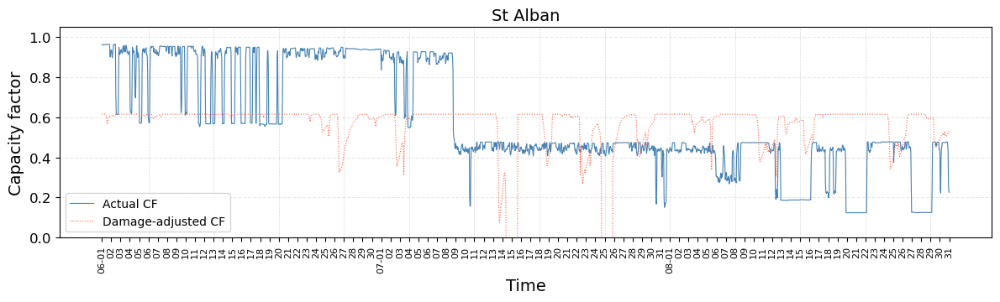

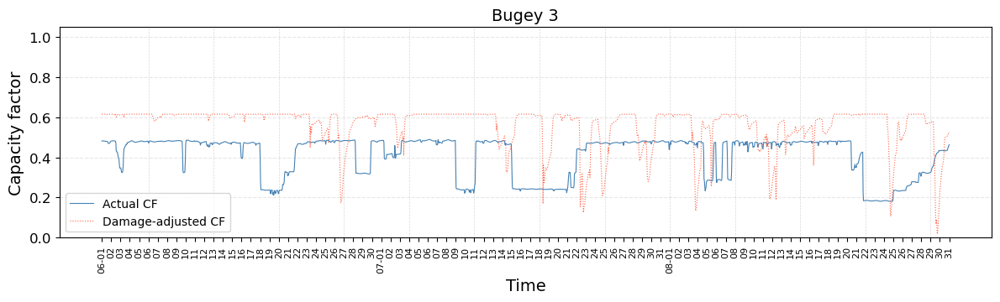

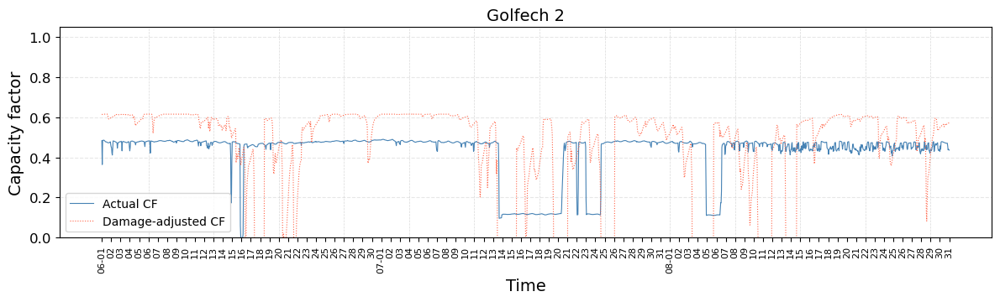

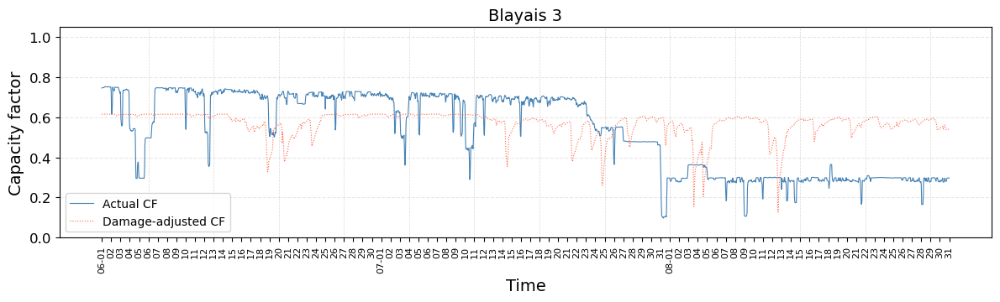

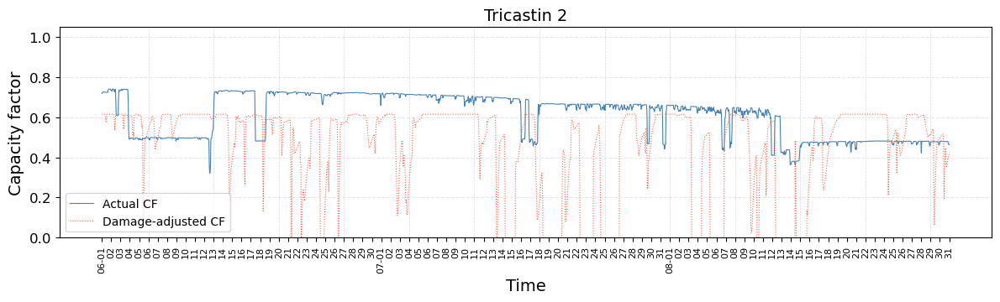

In [17]:
s = scenarios["dis"]

for plant in plants:
    data = build_plant_cf_df(
        plant, ("2022-06-01", "2022-08-31"),
        damage_df=s["damage_df"],
        cf_actual=s["cf_actual"],
        mapping=s["mapping"],
    )
    fig, ax = plot_cf_comparison(data, title=plant)

    tickvals, ticktext = _compute_day_ticks(data.index)
    ax.set_xticks(tickvals)
    ax.set_xticklabels(ticktext, rotation=90, ha="center", fontsize=8)

    ax.set_yticks(np.arange(0, 1.2, 0.2))
    ax.grid(True, which="major", axis="y", alpha=0.3, linestyle="--")

    days_until_monday = (7 - data.index[0].weekday()) % 7
    first_monday = data.index[0].normalize() + pd.Timedelta(days=days_until_monday)

    for d in pd.date_range(first_monday, data.index[-1], freq="7D"):
        ax.axvline(d, color="grey", alpha=0.3, linestyle="--", linewidth=0.5, zorder=0)
    ax.legend(loc="lower left", fontsize=10)

    plt.show()


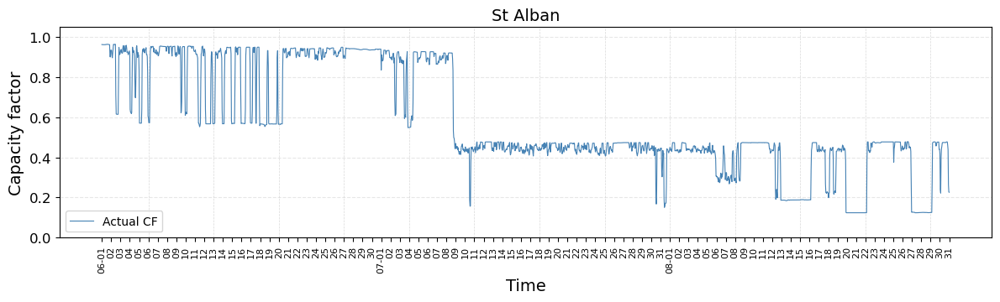

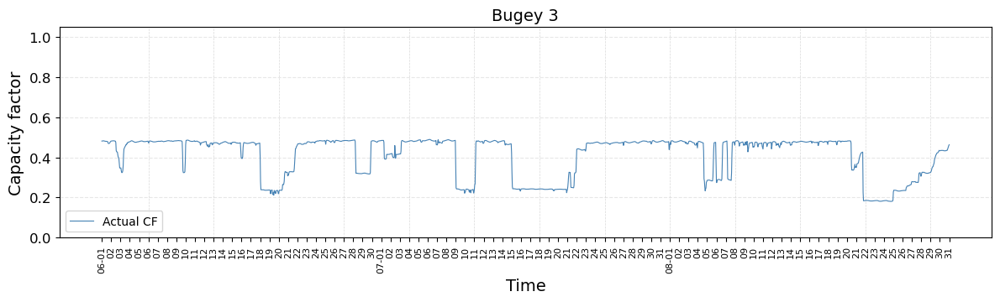

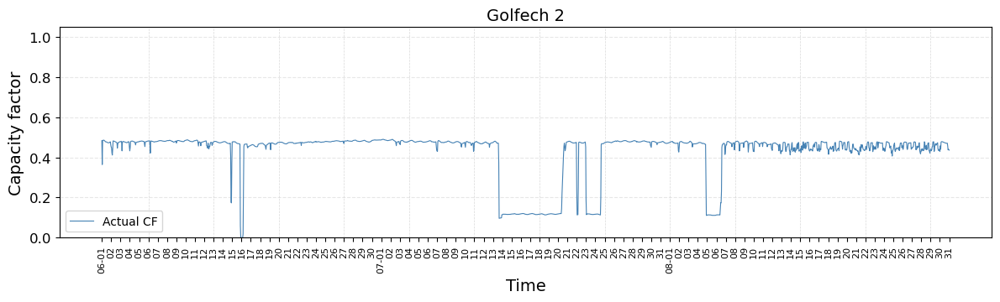

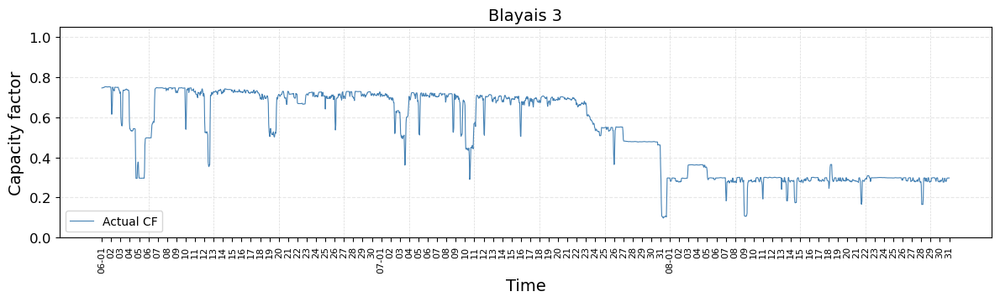

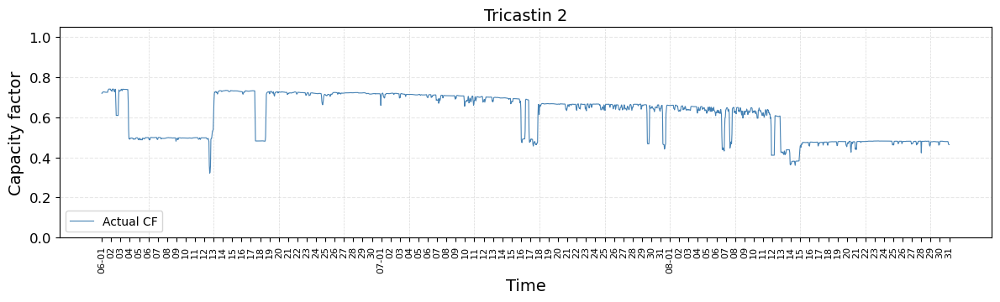

In [19]:
s = scenarios["dis"]

for plant in plants:
    data = build_plant_cf_df(
        plant, ("2022-06-01", "2022-08-31"),
        damage_df=None,
        cf_actual=s["cf_actual"],
        mapping=s["mapping"],
    )
    fig, ax = plot_cf_comparison(data, title=plant)

    tickvals, ticktext = _compute_day_ticks(data.index)
    ax.set_xticks(tickvals)
    ax.set_xticklabels(ticktext, rotation=90, ha="center", fontsize=8)

    ax.set_yticks(np.arange(0, 1.2, 0.2))
    ax.grid(True, which="major", axis="y", alpha=0.3, linestyle="--")

    days_until_monday = (7 - data.index[0].weekday()) % 7
    first_monday = data.index[0].normalize() + pd.Timedelta(days=days_until_monday)

    for d in pd.date_range(first_monday, data.index[-1], freq="7D"):
        ax.axvline(d, color="grey", alpha=0.3, linestyle="--", linewidth=0.5, zorder=0)
    ax.legend(loc="lower left", fontsize=10)

    plt.show()


In [18]:
first_monday

Timestamp('2022-06-06 00:00:00')

## Plot_cf_to_temp

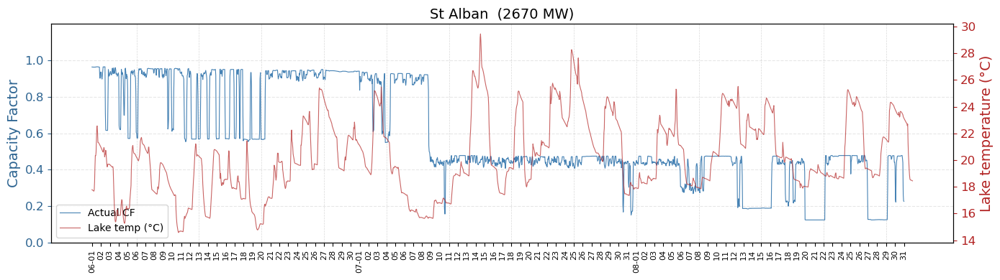

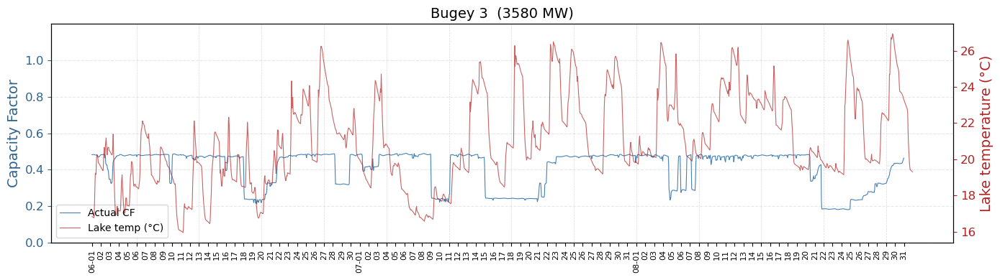

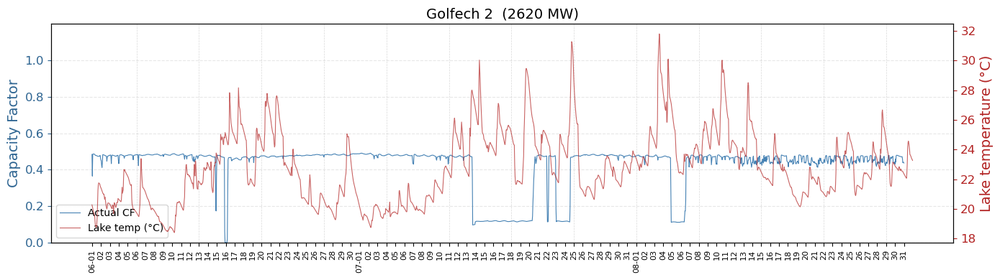

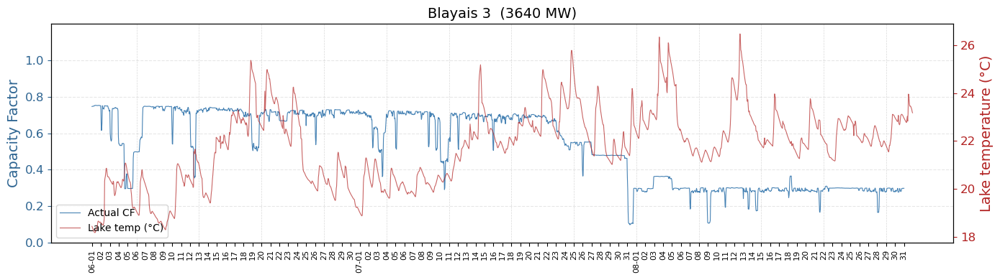

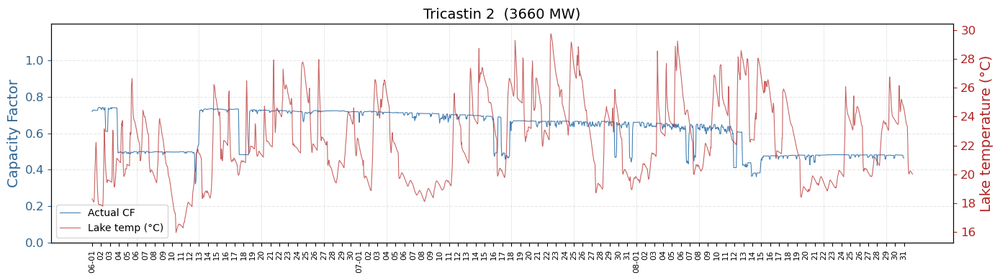

In [20]:
s = scenarios["dis"]
start, end = "2022-06-01", "2022-08-31"

for plant in plants:
    data = build_plant_cf_df(
        plant, (start, end),
        cf_actual=s["cf_actual"],
        mapping=s["mapping"],
    )
    if data.empty:
        continue

    plant_row = s["powerplants_df"].loc[s["powerplants_df"]["Name"] == plant].iloc[0]
    temp = (
        cutout_data["lake_s_temp"]
        .sel(x=plant_row["lon"], y=plant_row["lat"], method="nearest")
        .to_pandas()
        .loc[start:end]
    ) - 273.0

    fig, ax1 = plt.subplots(figsize=(14, 4))
    ax1.plot(data.index, data["Actual CF"], color="steelblue", linewidth=0.8, label="Actual CF")
    ax1.set_ylabel("Capacity Factor", color="#2d6491")       # steelblue darkened
    ax1.tick_params(axis="y", colors="#2d6491")


    ax1.set_ylim(0, 1.2)
    ax1.set_yticks(np.arange(0, 1.2, 0.2))
    ax1.grid(True, which="major", axis="y", alpha=0.3, linestyle="--")

    ax2 = ax1.twinx()
    ax2.plot(temp.index, temp.values, color="firebrick", linewidth=0.8, alpha=0.7, label="Lake temp (°C)")

    ax2.set_ylabel("Lake temperature (°C)", color="firebrick")
    ax2.tick_params(axis="y", colors="firebrick")


    lines1, labels1 = ax1.get_legend_handles_labels()
    lines2, labels2 = ax2.get_legend_handles_labels()
    ax1.legend(lines1 + lines2, labels1 + labels2, loc="lower left", fontsize=10)
    ax1.set_title(f"{plant}  ({plant_row['Capacity']:.0f} MW)")


    tickvals, ticktext = _compute_day_ticks(data.index)
    ax1.set_xticks(tickvals)
    ax1.set_xticklabels(ticktext, rotation=90, ha="center", fontsize=8)

    days_until_monday = (7 - data.index[0].weekday()) % 7
    first_monday = data.index[0].normalize() + pd.Timedelta(days=days_until_monday)
    for d in pd.date_range(first_monday, data.index[-1], freq="7D"):
        ax1.axvline(d, color="grey", alpha=0.3, linestyle="--", linewidth=0.5, zorder=0)

    plt.tight_layout()
    plt.show()


In [23]:
s = scenarios["dis"]

rows = []
for plant in s["powerplants_df"]["Name"]:
    units = s["mapping"].loc[s["mapping"]["Name"] == plant, "unit_name"]
    entsoe_cap = (
        s["cf_actual"]
        .loc[s["cf_actual"]["unit_name"].isin(units)]
        .groupby("unit_name")["installed_capacity_mw"].first()
        .sum()
    )
    pypsa_cap = s["powerplants_df"].loc[s["powerplants_df"]["Name"] == plant, "Capacity"].iloc[0]
    rows.append({"plant": plant, "ENTSO-E (MW)": entsoe_cap, "PyPSA (MW)": pypsa_cap})

cap_df = pd.DataFrame(rows).set_index("plant")
cap_df["diff (MW)"] = cap_df["ENTSO-E (MW)"] - cap_df["PyPSA (MW)"]
cap_df


,ENTSO-E (MW),PyPSA (MW),diff (MW)
plant,,,
Nogent,2620,2620.0,0.0
Paluel 2,5320,5320.0,0.0
Penly 3,2660,2660.0,0.0
St Alban,2670,2670.0,0.0
Tricastin 2,3660,3660.0,0.0
St Laurent 4,1830,1830.0,0.0
Dampierre 5,3560,3560.0,0.0
Belleville 6,2620,2620.0,0.0
Gravelines 7,5460,5460.0,0.0


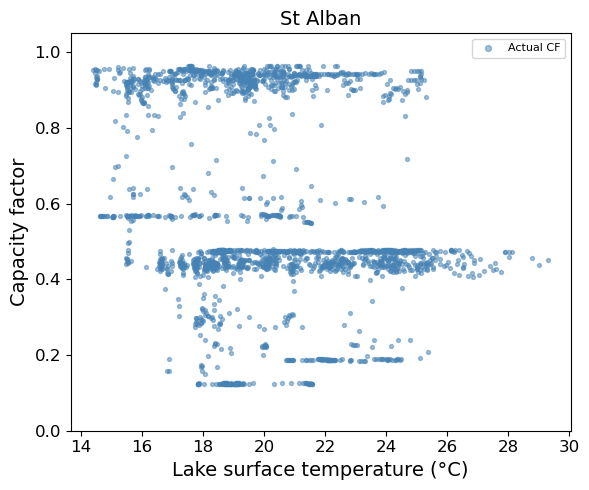

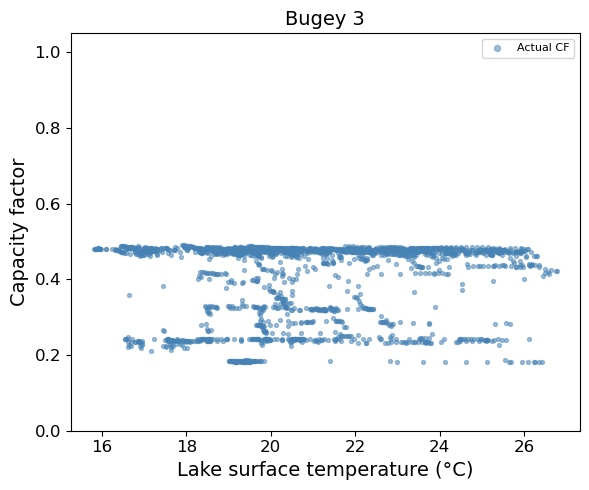

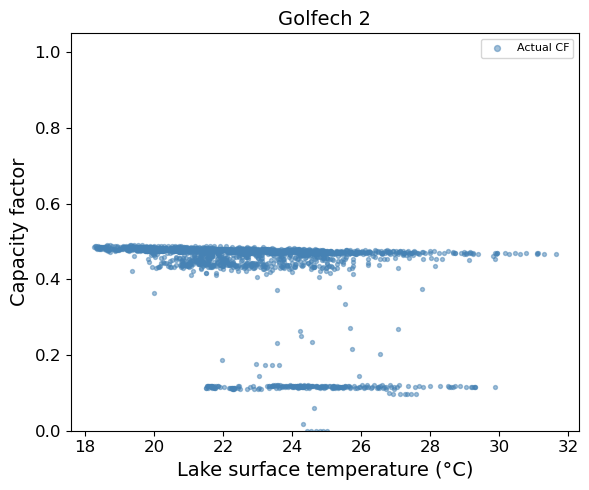

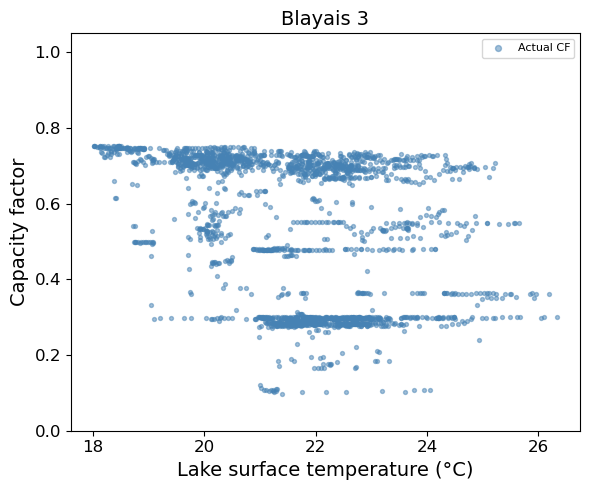

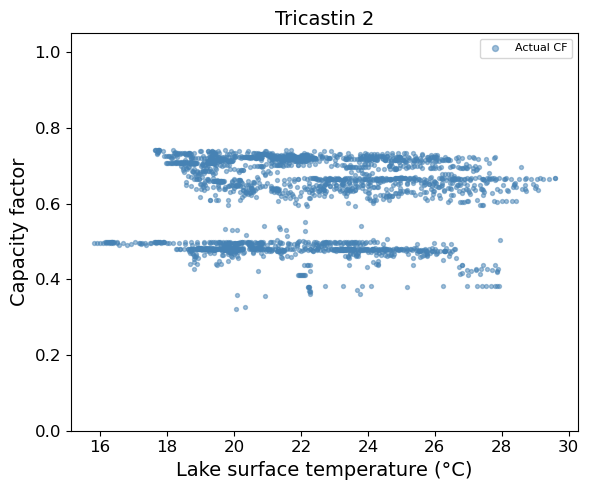

In [18]:
from plot_cf import plot_cf_temp

s = scenarios["dis"]
sources = build_cf_sources(cf_actual=s["cf_actual"], mapping=s["mapping"])
for plant in plants:
    data = build_cf_temp_aligned_df(
        sources, cutout_data, s["powerplants_df"],
        plant_name=plant, date_range=("2022-06-01", "2022-08-31"),
    )
    fig, ax = plot_cf_temp(data, title=plant)
    plt.show()


In [19]:
s = scenarios["dis"]
sources = build_cf_sources(s["damage_df"], s["cf_actual"], s["mapping"], cf_fixed_factor=cf_fixed_factor)

for plant in plants:
    print(plant)
    data = build_cf_temp_aligned_df(
        sources, cutout_data, s["powerplants_df"],
        plant_name=plant, date_range=("2022-06-01", "2022-08-31"),
    )
    fig = iplot_cf_temp(data, title=plant)
    fig.show()


St Alban


Bugey 3


Golfech 2


Blayais 3


Tricastin 2


# p_max_pu vs cf

In [14]:
from builders import build_cf_pmax_df, build_agg_cf_pmax_df
from plot_network import iplot_cf_pmax, plot_cf_pmax

networks = {label: pypsa.Network(path) for label, path in NETWORK_PATHS.items()}

nc = pypsa.NetworkCollection(list(networks.values()), index=list(networks.keys()))

_color_overrides = {
    "load_shedding": "darkred",
    "oil":           "dimgray",
    "load":          "#4a4a4a",

}

for n in networks.values():
    # Rename the "" carrier to "load" everywhere
    if "" in n.carriers.index:
        n.carriers = n.carriers.rename(index={"": "load"})
        for attr in ["generators", "loads", "links", "storage_units", "stores"]:
            df = getattr(n, attr)
            if not df.empty and "carrier" in df.columns:
                df.loc[df["carrier"] == "", "carrier"] = "load"

    for carrier, color in _color_overrides.items():
        if carrier in n.carriers.index:
            n.carriers.loc[carrier, "color"] = color

    remaining = n.carriers[n.carriers.color.isna() | n.carriers.color.eq("")].index
    n.carriers.loc[remaining, "color"] = "lightgrey"

color_map = networks["base_dis"].carriers.color.to_dict()


INFO:pypsa.network.io:New version 1.2.4 available! (Current: 1.0.7)
INFO:pypsa.network.io:Imported network 'Unnamed Network' has buses, carriers, generators, global_constraints, lines, links, loads, storage_units, stores, sub_networks
INFO:pypsa.network.io:New version 1.2.4 available! (Current: 1.0.7)
INFO:pypsa.network.io:Imported network 'Unnamed Network' has buses, carriers, generators, global_constraints, lines, links, loads, storage_units, stores, sub_networks
INFO:pypsa.network.io:New version 1.2.4 available! (Current: 1.0.7)
INFO:pypsa.network.io:Imported network 'Unnamed Network' has buses, carriers, generators, global_constraints, lines, links, loads, storage_units, stores, sub_networks
INFO:pypsa.network.io:New version 1.2.4 available! (Current: 1.0.7)
INFO:pypsa.network.io:Imported network 'Unnamed Network' has buses, carriers, generators, global_constraints, lines, links, loads, storage_units, stores, sub_networks
INFO:pypsa.network.io:New version 1.2.4 available! (Current:

In [22]:
ts = nc.statistics.capacity_factor(
    groupby=["bus", "carrier"], groupby_time=False, nice_names=False
)
CARRIER = "nuclear"   # onwind | offwind-ac | offwind-dc | offwind-float
BUS     = "FR0 4"        # adjust to a valid GB bus
data = build_cf_pmax_df(
    ts, networks,
    bus=BUS, carrier=CARRIER,
    start="2022-08-01", end="2022-08-21",
)

iplot_cf_pmax(data, title=f"CF vs p_max_pu — {CARRIER} @ {BUS}, July - Aug 2022")

In [223]:
ts = nc.statistics.capacity_factor(
    groupby=["bus", "carrier"], groupby_time=False, nice_names=False
)
CARRIER = "nuclear"   # onwind | offwind-ac | offwind-dc | offwind-float
BUS     = "FR0 2"        # adjust to a valid GB bus
data = build_cf_pmax_df(
    ts, networks,
    bus=BUS, carrier=CARRIER,
    start="2022-07-01", end="2022-08-07",
)

iplot_cf_pmax(data, title=f"CF vs p_max_pu — {CARRIER} @ {BUS}, July - Aug 2022")

CF vs p_max_pu — nuclear @ FR0 4, Summer 2022


(<Figure size 1400x500 with 1 Axes>, <Axes: ylabel='p.u.'>)

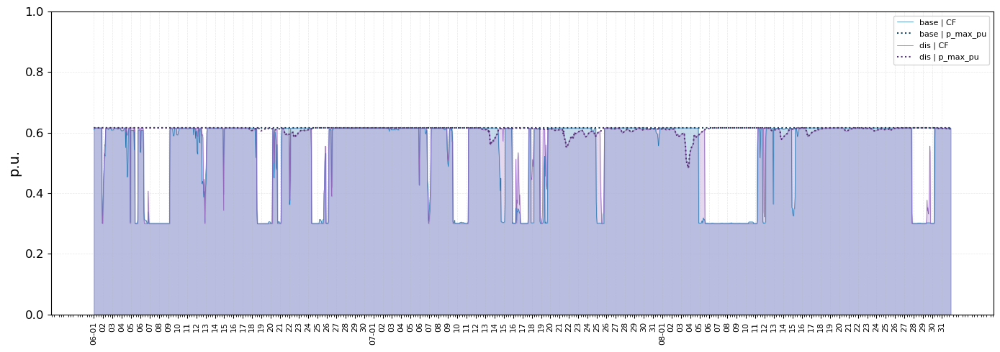

In [21]:
ts = nc.statistics.capacity_factor(
    groupby=["bus", "carrier"], groupby_time=False, nice_names=False
)
CARRIER = "nuclear"   # onwind | offwind-ac | offwind-dc | offwind-float
BUS     = "FR0 4"        # adjust to a valid GB bus
data = build_cf_pmax_df(
    ts, {k: networks[k] for k in ["base","dis"]},
    bus=BUS, carrier=CARRIER,
    start="2022-06-01", end="2022-08-31",
)

plot_cf_pmax(data, title=f"CF vs p_max_pu — {CARRIER} @ {BUS}, Summer 2022", figsize=(14,5))

CF vs p_max_pu — nuclear @ FR0 3, Summer 2022


(<Figure size 800x400 with 1 Axes>, <Axes: ylabel='p.u.'>)

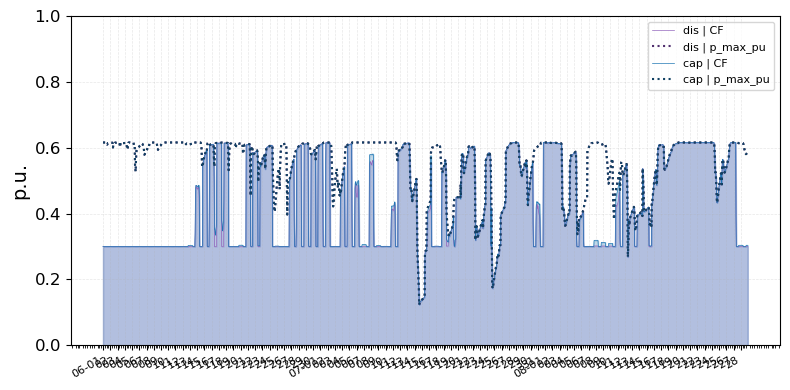

In [29]:
ts = nc.statistics.capacity_factor(
    groupby=["bus", "carrier"], groupby_time=False, nice_names=False
)
CARRIER = "nuclear"   # onwind | offwind-ac | offwind-dc | offwind-float
BUS     = "FR0 3"        # adjust to a valid GB bus
data = build_cf_pmax_df(
    ts, {k: networks[k] for k in ["dis", "cap"]},
    bus=BUS, carrier=CARRIER,
    start="2022-06-01", end="2022-08-28",
)

plot_cf_pmax(data, title=f"CF vs p_max_pu — {CARRIER} @ {BUS}, Summer 2022")

(<Figure size 800x400 with 1 Axes>,
 <Axes: title={'center': 'CF vs p_max_pu — nuclear @ All Buses, July 2022'}, xlabel='snapshot', ylabel='p.u.'>)

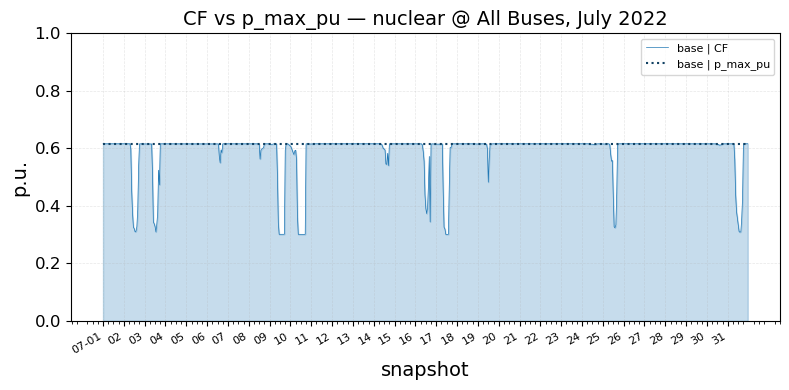

In [134]:
ts = nc.statistics.capacity_factor(
    groupby=["bus", "carrier"], groupby_time=False, nice_names=False
)
CARRIER = "nuclear"   # onwind | offwind-ac | offwind-dc | offwind-float
data = build_cf_pmax_df(
    ts, {k: networks[k] for k in ["base"]},
    bus=BUS, carrier=CARRIER,
    start="2022-07-01", end="2022-07-31",
)

plot_cf_pmax(data, title=f"CF vs p_max_pu — {CARRIER} @ All Buses, July 2022")

In [ ]:
CARRIER = "nuclear"

data = build_agg_cf_pmax_df(
    {k: networks[k] for k in ["base"]},
    carrier=CARRIER,
    start="2023-01-01",
    end="2023-02-28",
    freq="MS",   # monthly; use "h" or omit resampling for hourly
)

plot_cf_pmax(data, title=f"CF vs p_max_pu — {CARRIER}, all buses, Jan–Feb 2023")


# Stats Bar

In [9]:
import importlib
import plot_stats
from plot_stats import plot_network_map


In [10]:
from plot_stats import compute_stats_diff, format_stats_df, iplot_stats_bar, plot_stats_bar, plot_network_map
grouper = ["bus", "carrier", "bus_carrier"]
stats = nc.statistics(groupby=grouper, nice_names=False)
stats["Expanded Capacity"] = stats["Optimal Capacity"] - stats["Installed Capacity"]

diff = compute_stats_diff(stats, base="base")
diff = format_stats_df(diff, index_names=["techgroup", "network", "bus", "tech", "bus_carrier"])

fc_efficiency = networks['base'].links.loc[
    networks['base'].links.carrier == "H2 fuel cell", "efficiency"
].mean()

In [11]:
SUP_CARRIERS = [
        'biomass', 'nuclear', 'offwind-ac', 'offwind-dc',
       'onwind', 'solar', 'solar-hsat', 'load_shedding', 'ror', 'hydro']
CHARGE_CARRIERS = ['H2 electrolysis','H2 fuel cell','battery', 'PHS']

RE_CARRIERS = ['biomass', 'offwind-ac', 'offwind-dc', 'onwind', 'solar', 'solar-hsat', 'ror', 'biomass']
STOR_CARRIERS = ['H2 fuel cell']

GRID_CARRIERS = [
        'AC', 'DC', 'H2'
        ]

In [225]:
diff.to_csv(root.parent.parent.parent / "results" / f"stats_diff_FR-{YEAR}.csv")


In [13]:
n.statistics.withdrawal().filter(like="Load").sum()


np.float64(585725152.33228)

In [12]:
n.carriers[["nice_name", "color"]]


,nice_name,color
name,,
DC,DC,#8a1caf
AC,AC,#70af1d
nuclear,nuclear,#ff8c00
lignite,lignite,#826837
coal,coal,#545454
biomass,biomass,#baa741
CCGT,Combined-Cycle Gas,#a85522
oil,oil,dimgray
onwind,Onshore Wind,#235ebc


In [220]:
n = networks["dis"]  # or any loaded network

vom = pd.concat([
    n.generators[["carrier", "marginal_cost"]].rename(columns={"marginal_cost": "vom"}),
    n.storage_units[["carrier", "marginal_cost"]].rename(columns={"marginal_cost": "vom"}),
    n.links[["carrier", "marginal_cost"]].rename(columns={"marginal_cost": "vom"})
])

vom[vom["vom"] > 0].sort_values("vom", ascending=False)


,carrier,vom
name,,
FR0 0 H2 load shedding,load_shedding,10000.010685
FR0 2 H2 load shedding,load_shedding,10000.010527
FR0 4 load shedding,load_shedding,10000.010349
FR0 1 load shedding,load_shedding,10000.010339
FR0 3 load shedding,load_shedding,10000.010250
...,...,...
FR0 4 0 offwind-dc,offwind-dc,0.019000
FR0 3 0 offwind-ac,offwind-ac,0.016000
FR0 4 0 offwind-ac,offwind-ac,0.016000


In [222]:
vom.carrier.unique()

array(['CCGT', 'coal', 'lignite', 'nuclear', 'biomass', 'oil', 'solar',
       'offwind-ac', 'offwind-dc', 'onwind', 'solar-hsat', 'ror',
       'load_shedding', 'PHS', 'hydro', 'battery', 'H2 electrolysis',
       'H2 fuel cell'], dtype=object)

In [224]:
vom[vom["carrier"] =='solar']

,carrier,vom
name,,
FR0 0 0 solar,solar,0.030069
FR0 1 0 solar,solar,0.029499
FR0 2 0 solar,solar,0.030510
FR0 3 0 solar,solar,0.030345
FR0 4 0 solar,solar,0.029591


In [28]:
diff[diff["tech"].isin(["nuclear"])]

,techgroup,network,bus,tech,bus_carrier,optimal capacity,installed capacity,supply,withdrawal,energy balance,...,withdrawal_diff,energy_balance_diff,transmission_diff,capacity_factor_diff,curtailment_diff,capital_expenditure_diff,operational_expenditure_diff,revenue_diff,market_value_diff,expanded_capacity_diff
3,Generator,base,FR0 0,nuclear,AC,9960.0,9960.0,4.682428e+07,0.0,4.682428e+07,...,0.0,0.000000e+00,0.0,0.000000,0.000000e+00,0.0,0.000000e+00,0.000000e+00,0.000000,0.0
10,Generator,base,FR0 1,nuclear,AC,24070.0,24070.0,1.123442e+08,0.0,1.123442e+08,...,0.0,0.000000e+00,0.0,0.000000,0.000000e+00,0.0,0.000000e+00,0.000000e+00,0.000000,0.0
18,Generator,base,FR0 2,nuclear,AC,9250.0,9250.0,4.581430e+07,0.0,4.581430e+07,...,0.0,0.000000e+00,0.0,0.000000,0.000000e+00,0.0,0.000000e+00,0.000000e+00,0.000000,0.0
27,Generator,base,FR0 3,nuclear,AC,13570.0,13570.0,5.879664e+07,0.0,5.879664e+07,...,0.0,0.000000e+00,0.0,0.000000,0.000000e+00,0.0,0.000000e+00,0.000000e+00,0.000000,0.0
36,Generator,base,FR0 4,nuclear,AC,6280.0,6280.0,2.749475e+07,0.0,2.749475e+07,...,0.0,0.000000e+00,0.0,0.000000,0.000000e+00,0.0,0.000000e+00,0.000000e+00,0.000000,0.0
46,Generator,base_cap,FR0 0,nuclear,AC,9960.0,9960.0,4.670573e+07,0.0,4.670573e+07,...,0.0,-1.185476e+05,0.0,-0.001359,1.185476e+05,0.0,-1.639860e+06,-4.434171e+06,0.131835,0.0
53,Generator,base_cap,FR0 1,nuclear,AC,24070.0,24070.0,1.124655e+08,0.0,1.124655e+08,...,0.0,1.213321e+05,0.0,0.000575,-1.213321e+05,0.0,1.588886e+06,-5.188201e+06,-0.143210,0.0
61,Generator,base_cap,FR0 2,nuclear,AC,9250.0,9250.0,4.582256e+07,0.0,4.582256e+07,...,0.0,8.254915e+03,0.0,0.000102,-8.254915e+03,0.0,8.787776e+04,-2.137077e+06,-0.062134,0.0
70,Generator,base_cap,FR0 3,nuclear,AC,13570.0,13570.0,5.880272e+07,0.0,5.880272e+07,...,0.0,6.080814e+03,0.0,0.000051,-6.080814e+03,0.0,5.945109e+04,-2.635406e+06,-0.054498,0.0
79,Generator,base_cap,FR0 4,nuclear,AC,6280.0,6280.0,2.747942e+07,0.0,2.747942e+07,...,0.0,-1.532451e+04,0.0,-0.000279,1.532451e+04,0.0,-2.028319e+05,-2.015851e+06,-0.021213,0.0


In [29]:
n = networks["base_cap"] 
n.statistics.installed_capacity()

component    carrier             
Generator    Combined-Cycle Gas      10077.69321
             Offshore Wind (AC)       3024.20000
             Onshore Wind            23778.60000
             Run of River             6870.64915
             Solar                   14721.79000
             biomass                   348.00000
             coal                     2362.85116
             lignite                   977.00000
             nuclear                 63130.00000
             oil                       928.00000
Line         AC                      85519.57561
StorageUnit  Pumped Hydro Storage     5236.30000
             Reservoir & Dam          8749.85605
dtype: float64

In [83]:
n = networks["dis"] 
n.statistics.optimal_capacity()

component    carrier             
Generator    Combined-Cycle Gas      1.007769e+04
             Offshore Wind (AC)      1.562350e+04
             Offshore Wind (DC)      2.376274e+03
             Onshore Wind            4.499957e+04
             Run of River            6.870649e+03
             Solar                   7.998801e+04
             biomass                 2.999999e+03
             coal                    2.362851e+03
             lignite                 9.770000e+02
             load_shedding           1.489616e+04
             nuclear                 6.313000e+04
             oil                     9.280000e+02
             solar-hsat              1.197326e+01
Line         AC                      8.551958e+04
Link         H2 electrolysis         1.032313e+04
             H2 fuel cell            5.650113e+04
StorageUnit  Battery Storage         2.902477e+04
             Pumped Hydro Storage    5.236300e+03
             Reservoir & Dam         8.749856e+03
Store        Hyd

In [31]:
n = networks["base"] 
n.statistics.optimal_capacity()

component    carrier             
Generator    Combined-Cycle Gas      1.007769e+04
             Offshore Wind (AC)      1.562350e+04
             Offshore Wind (DC)      2.376274e+03
             Onshore Wind            4.499957e+04
             Run of River            6.870649e+03
             Solar                   7.998801e+04
             biomass                 2.999999e+03
             coal                    2.362851e+03
             lignite                 9.770000e+02
             nuclear                 6.313000e+04
             oil                     9.280000e+02
             solar-hsat              1.197326e+01
Line         AC                      8.551958e+04
Link         H2 electrolysis         1.032313e+04
             H2 fuel cell            5.650113e+04
StorageUnit  Battery Storage         2.902477e+04
             Pumped Hydro Storage    5.236300e+03
             Reservoir & Dam         8.749856e+03
Store        Hydrogen Storage        4.190300e+07
dtype: float64

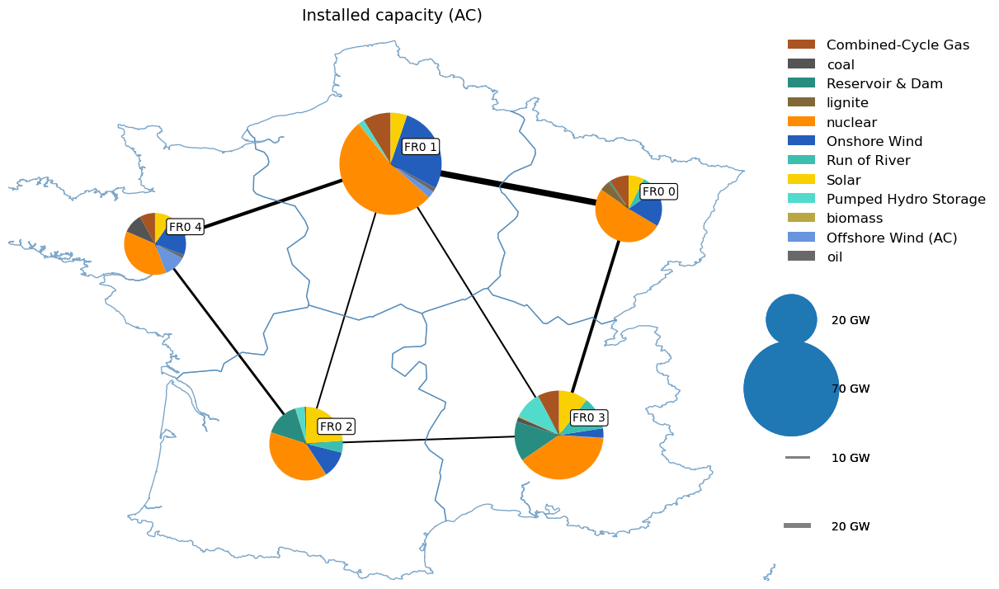

In [32]:

regions = gpd.read_file(
    pypsa_eur_root / "resources" / CONFIG_NAME / SCENARIO_VARIANTS["cap"] / "regions_onshore_base_s_5.geojson"
)
n = networks["base_cap"]

fig, ax = plot_network_map(
    n, regions,
    stat="installed_capacity",
    bus_area_fraction=0.05,
    branch_area_fraction=0.07,
    legend_circles=[20000, 70000],
    legend_lines=[10000, 20000],
    legend_spacing= 5,
    legend_bbox=(1.0, 0.5),
    title="Installed capacity (AC)",
    figsize = (12,17)
)
# fig.subplots_adjust(bottom=0.5)

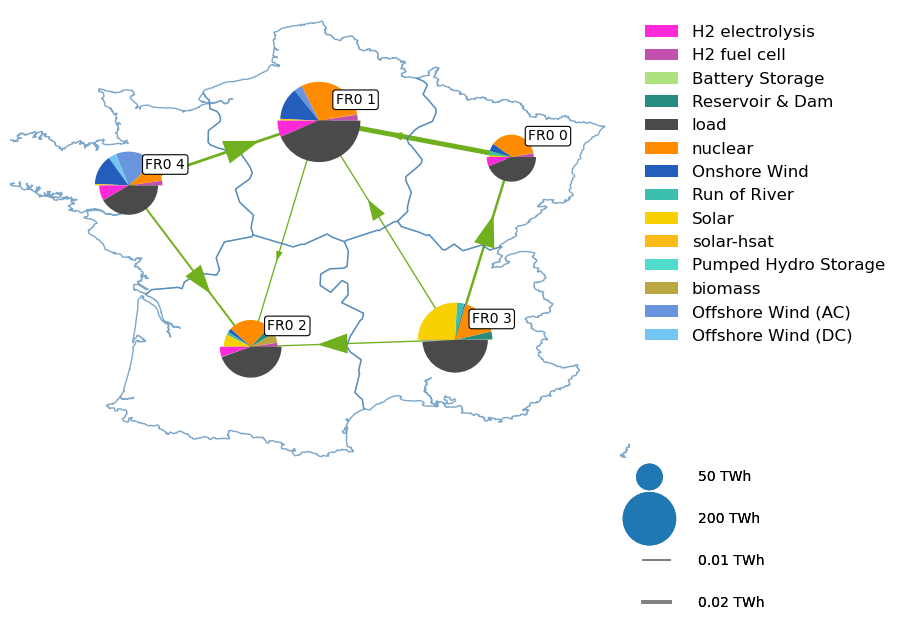

In [33]:
n = networks["base"]

fig, ax = plot_network_map(
    n, regions,
    stat="energy_balance",
    legend_circles=[50_000_000, 200_000_000],
    legend_lines=[10000, 20000],
    legend_unit="TWh",
    legend_multiplier=1e-6,
    legend_spacing = 2,
    title="",
)


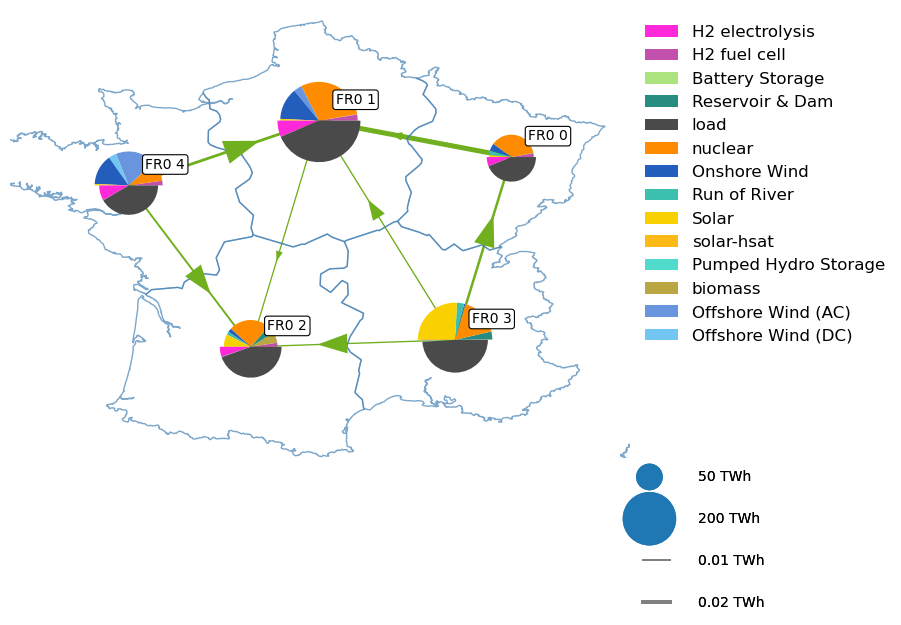

In [117]:
n = networks["cap"]

fig, ax = plot_network_map(
    n, regions,
    stat="energy_balance",
    legend_circles=[50_000_000, 200_000_000],
    legend_lines=[10000, 20000],
    legend_unit="TWh",
    legend_multiplier=1e-6,
    legend_spacing = 2,
    title="",
)


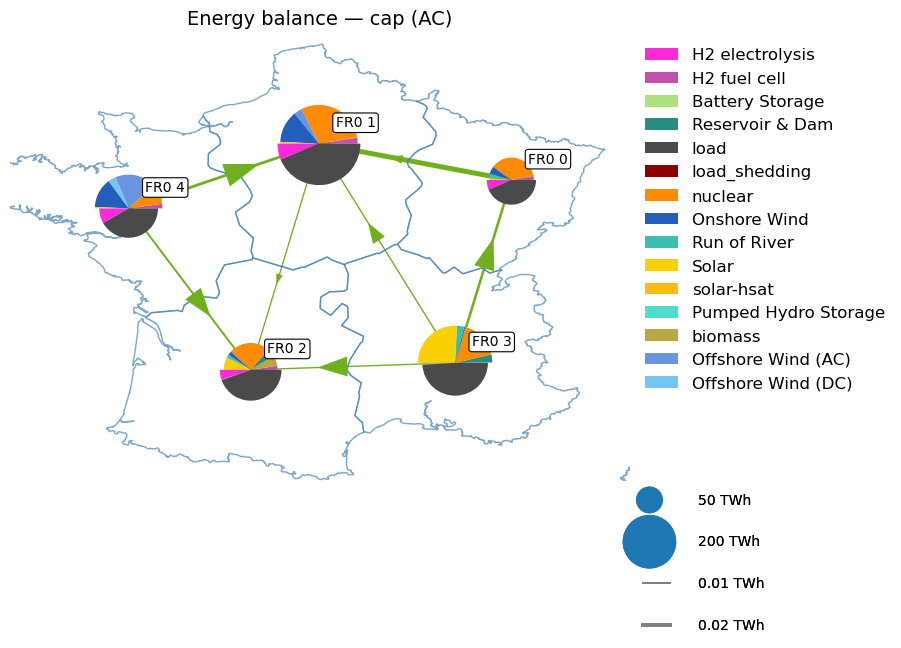

In [34]:
n = networks["dis"]

fig, ax = plot_network_map(
    n, regions,
    stat="energy_balance",
    legend_circles=[50_000_000, 200_000_000],
    legend_lines=[10000, 20000],
    legend_unit="TWh",
    legend_multiplier=1e-6,
    legend_spacing = 2,
    title="Energy balance — cap (AC)",
)


(<Figure size 1000x600 with 1 Axes>,
 [<Axes: title={'center': 'base'}, ylabel='Installed Capacity (GW)'>])

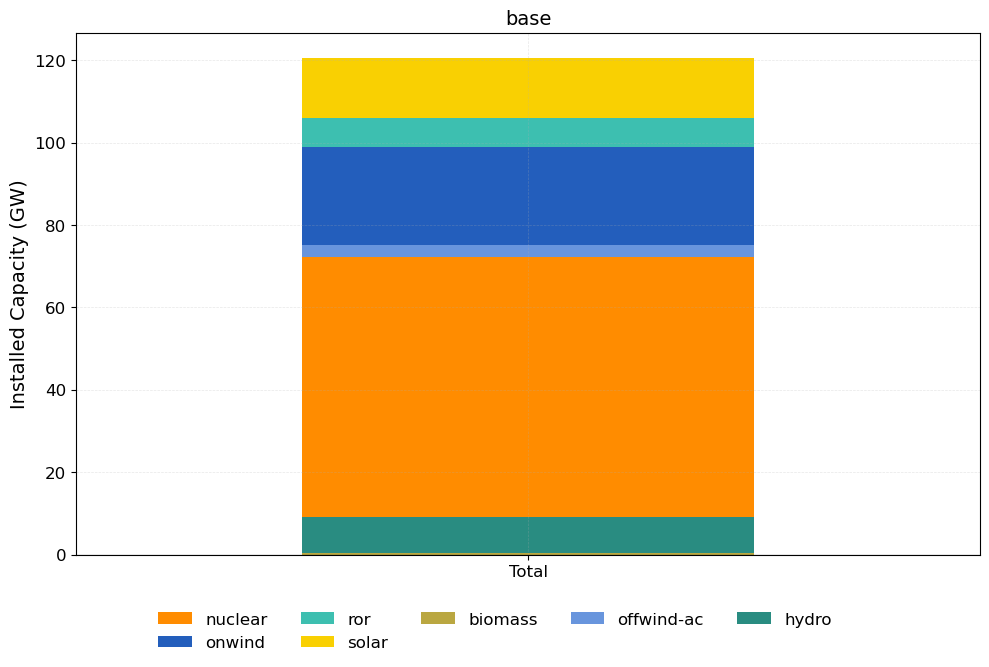

In [126]:
plot_stats_bar(
    diff[
        diff["tech"].isin(SUP_CARRIERS + CHARGE_CARRIERS + STOR_CARRIERS)
        # diff["techgroup"].isin(["Generator", "StorageUnit"])
        # & (diff["bus_carrier"] == "AC")
    ],
    column="installed capacity",
    multiplier=1e-3,
    title="Installed Capacity (GW)",
    networks=["base"],
    aggregate = True,
    color_map=color_map,
    figsize=(10, 6)
)

(<Figure size 800x800 with 1 Axes>,
 [<Axes: title={'center': 'base'}, xlabel='Bus', ylabel='Expanded Capacity (GW)'>])

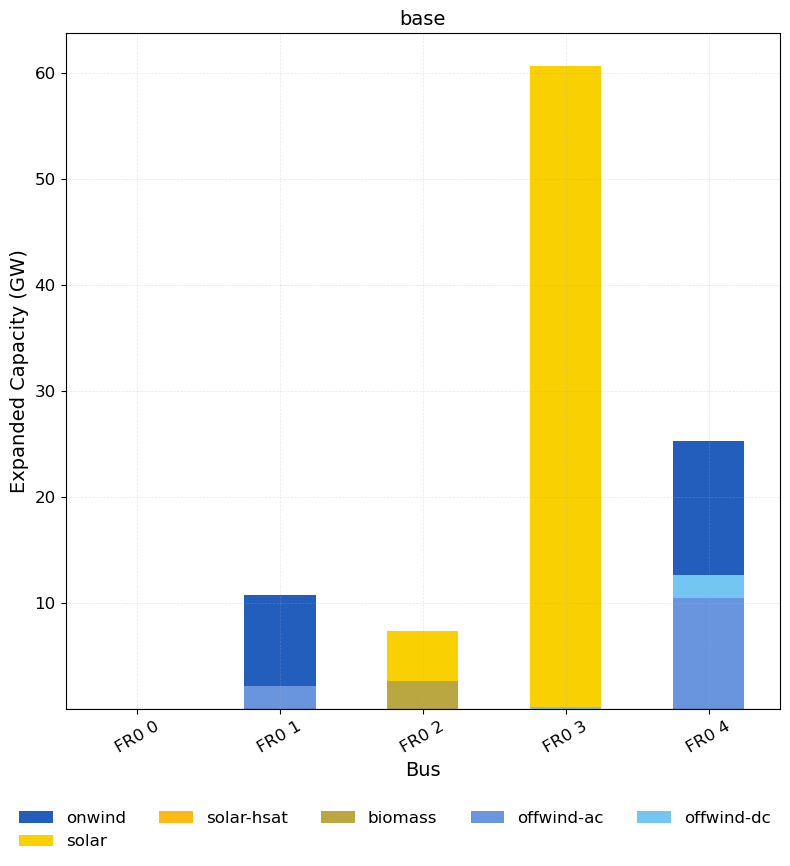

In [84]:
fc_efficiency = networks['base'].links.loc[
    networks['base'].links.carrier == "H2 fuel cell", "efficiency"
].mean()

plot_stats_bar(
    diff[diff["tech"].isin(SUP_CARRIERS)],
    column="expanded capacity",
    multiplier=1e-3,
    carrier_multipliers={"H2 fuel cell": fc_efficiency},
    title="Expanded Capacity (GW)",
    networks=["base"],
    color_map=color_map,
    figsize=(8, 8),
)


(<Figure size 800x800 with 1 Axes>,
 [<Axes: title={'center': 'base'}, xlabel='Bus', ylabel='Optimal Capacity (GW)'>])

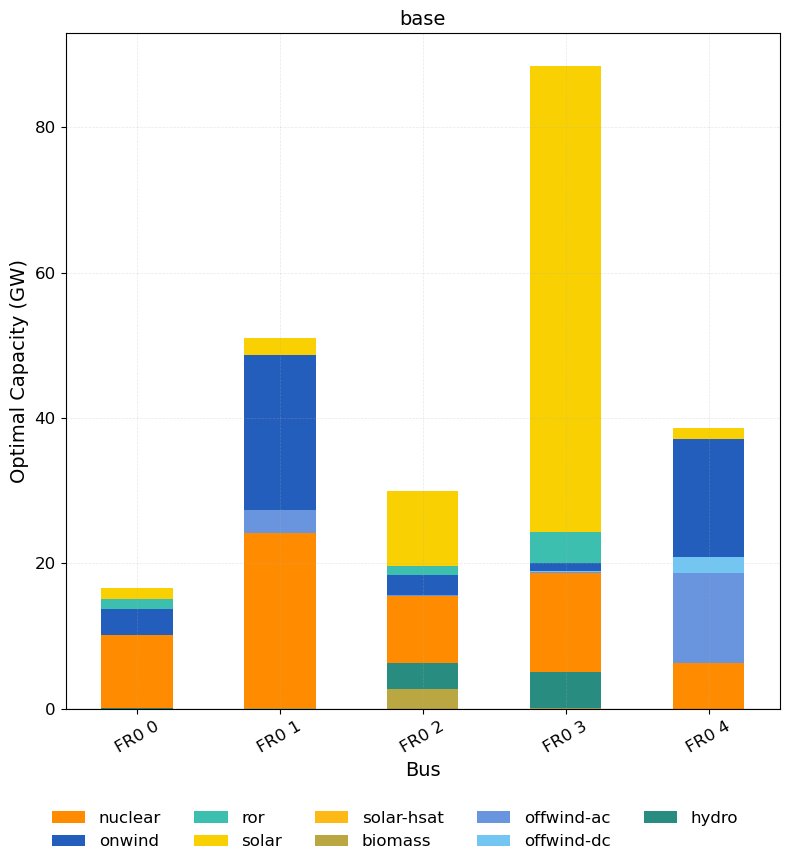

In [85]:
plot_stats_bar(
    diff[
        diff["tech"].isin(SUP_CARRIERS)
        # diff["techgroup"].isin(["Generator", "StorageUnit"])
        # & (diff["bus_carrier"] == "AC")
    ],
    column="optimal capacity",
    multiplier=1e-3,
    carrier_multipliers={"H2 fuel cell": fc_efficiency},
    title="Optimal Capacity (GW)",
    networks=["base"],
    # aggregate = True,
    color_map=color_map,
    figsize=(8, 8)
)

(<Figure size 800x600 with 1 Axes>,
 [<Axes: title={'center': 'base'}, xlabel='Bus', ylabel='Optimal Capacity (GW)'>])

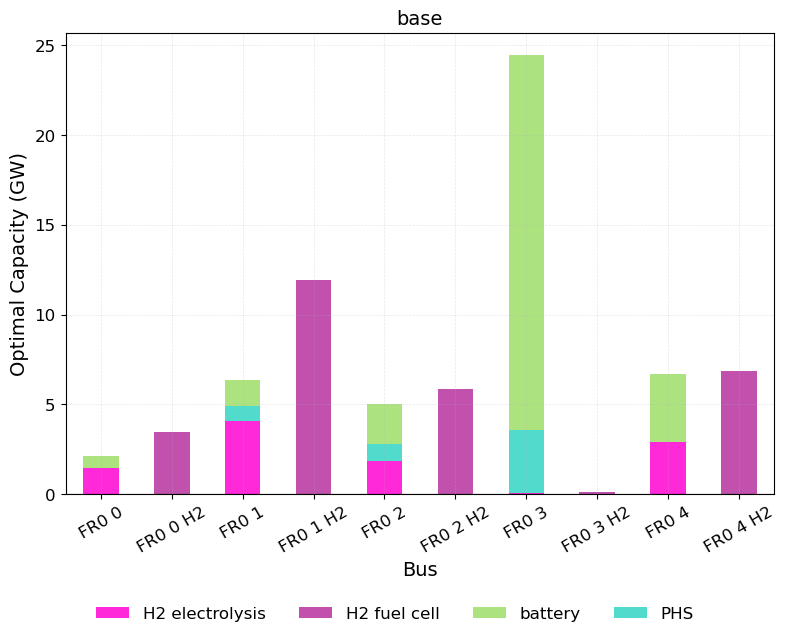

In [ ]:
fc_efficiency = networks['base'].links.loc[
    networks['base'].links.carrier == "H2 fuel cell", "efficiency"
].mean()

plot_stats_bar(
    diff[
        diff["tech"].isin(CHARGE_CARRIERS)
        # diff["techgroup"].isin(["Generator", "StorageUnit"])
        # & (diff["bus_carrier"] == "AC")
    ],
    column="optimal capacity",
    multiplier=1e-3,
    carrier_multipliers={"H2 fuel cell": fc_efficiency},
    title="Optimal Capacity (GW)",
    networks=["base"],
    # aggregate = True,
    color_map=color_map,
    figsize=(8, 6)
)

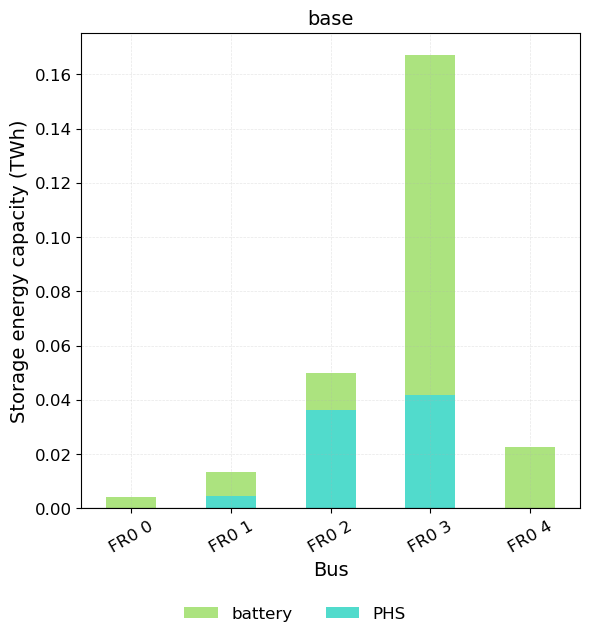

In [41]:
storage_stats = nc.statistics.optimal_capacity(groupby=grouper, nice_names=False, storage=True)
storage_stats = storage_stats.loc[storage_stats.index.get_level_values("component").isin(["Store", "StorageUnit"])]
storage_stats = storage_stats.to_frame("Optimal Capacity")

storage_stats = compute_stats_diff(storage_stats, base="base")
storage_df    = format_stats_df(storage_stats, index_names=["techgroup", "network", "bus", "tech", "bus_carrier"])
storage_df = storage_df[~storage_df["bus_carrier"].isin(["H2"]) & (storage_df["tech"] != "hydro")]

fig, axes = plot_stats_bar(
    storage_df,
    column="optimal capacity",
    networks=["base"],
    color_map=n.carriers.color.to_dict(),
    multiplier=1e-6,
    title="Storage energy capacity (TWh)",
    figsize=(6, 6)
)


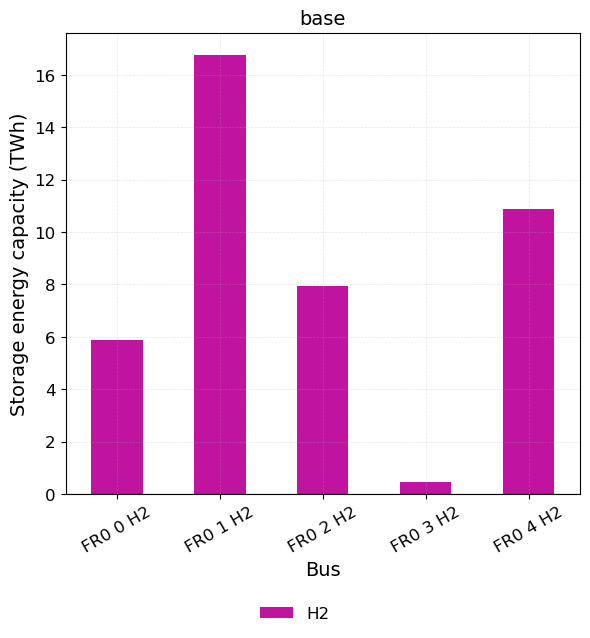

In [159]:
storage_stats = nc.statistics.optimal_capacity(groupby=grouper, nice_names=False, storage=True)
storage_stats = storage_stats.loc[storage_stats.index.get_level_values("component").isin(["Store", "StorageUnit"])]
storage_stats = storage_stats.to_frame("Optimal Capacity")

storage_stats = compute_stats_diff(storage_stats, base="base")
storage_df    = format_stats_df(storage_stats, index_names=["techgroup", "network", "bus", "tech", "bus_carrier"])
storage_df = storage_df[storage_df["bus_carrier"].isin(["H2"])]

fig, axes = plot_stats_bar(
    storage_df,
    column="optimal capacity",
    networks=["base"],
    color_map=n.carriers.color.to_dict(),
    multiplier=1e-6,
    title="Storage energy capacity (TWh)",
    figsize=(6, 6)
)


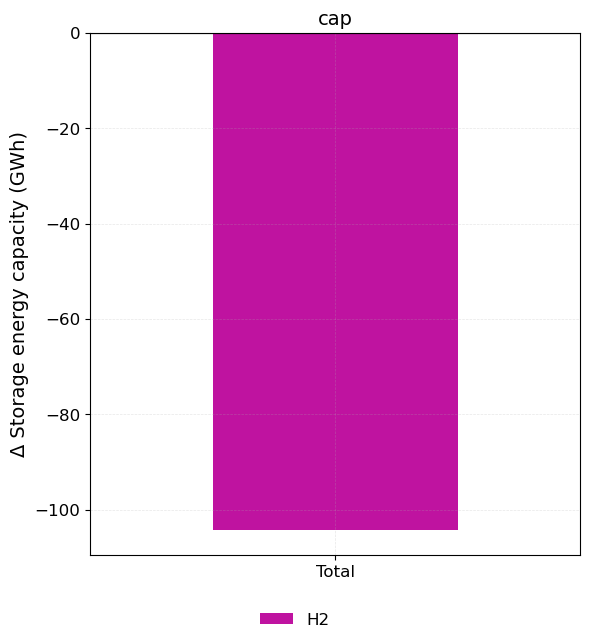

In [161]:
fig, axes = plot_stats_bar(
    storage_df,
    column="optimal_capacity_diff",
    networks=["cap"],
    color_map=n.carriers.color.to_dict(),
    multiplier=1e-3,
    title="\u0394 Storage energy capacity (GWh)",
    figsize=(6, 6),
    aggregate=True
)


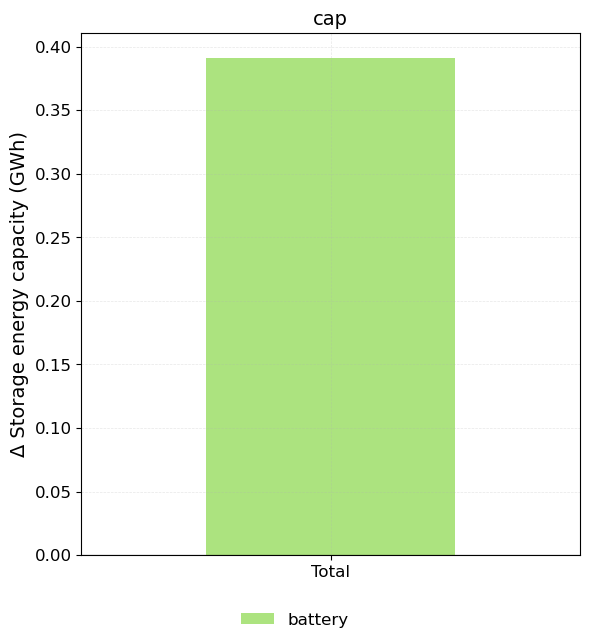

In [162]:
storage_stats = nc.statistics.optimal_capacity(groupby=grouper, nice_names=False, storage=True)
storage_stats = storage_stats.loc[storage_stats.index.get_level_values("component").isin(["Store", "StorageUnit"])]
storage_stats = storage_stats.to_frame("Optimal Capacity")

storage_stats = compute_stats_diff(storage_stats, base="base")
storage_df    = format_stats_df(storage_stats, index_names=["techgroup", "network", "bus", "tech", "bus_carrier"])
storage_df = storage_df[~storage_df["bus_carrier"].isin(["H2"]) & (storage_df["tech"] != "hydro")]


fig, axes = plot_stats_bar(
    storage_df,
    column="optimal_capacity_diff",
    networks=["cap"],
    color_map=n.carriers.color.to_dict(),
    multiplier=1e-3,
    title="\u0394 Storage energy capacity (GWh)",
    figsize=(6, 6),
    aggregate=True
)

(<Figure size 800x600 with 1 Axes>,
 [<Axes: title={'center': 'cap'}, xlabel='Bus', ylabel='Δ Expanded Capacity (MW)'>])

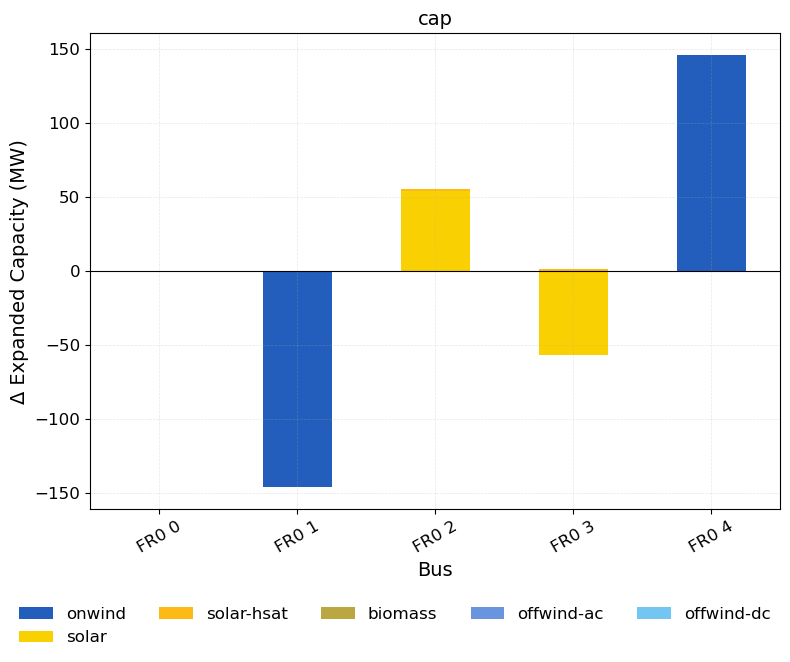

In [144]:
plot_stats_bar(
    diff[
        diff["tech"].isin(SUP_CARRIERS)
        # diff["techgroup"].isin(["Generator", "StorageUnit"])
        & (diff["bus_carrier"] == "AC")
    ],
    column="expanded_capacity_diff",
    # multiplier=1e-3,
    title="\u0394 Expanded Capacity (MW)",
    networks=["cap"],
    carrier_multipliers={"H2 fuel cell": fc_efficiency},
    # aggregate = True,
    color_map=color_map,
    figsize=(8, 6)
)

(<Figure size 1000x600 with 1 Axes>,
 [<Axes: title={'center': 'base_cap'}, ylabel='energy balance (TWh)'>])

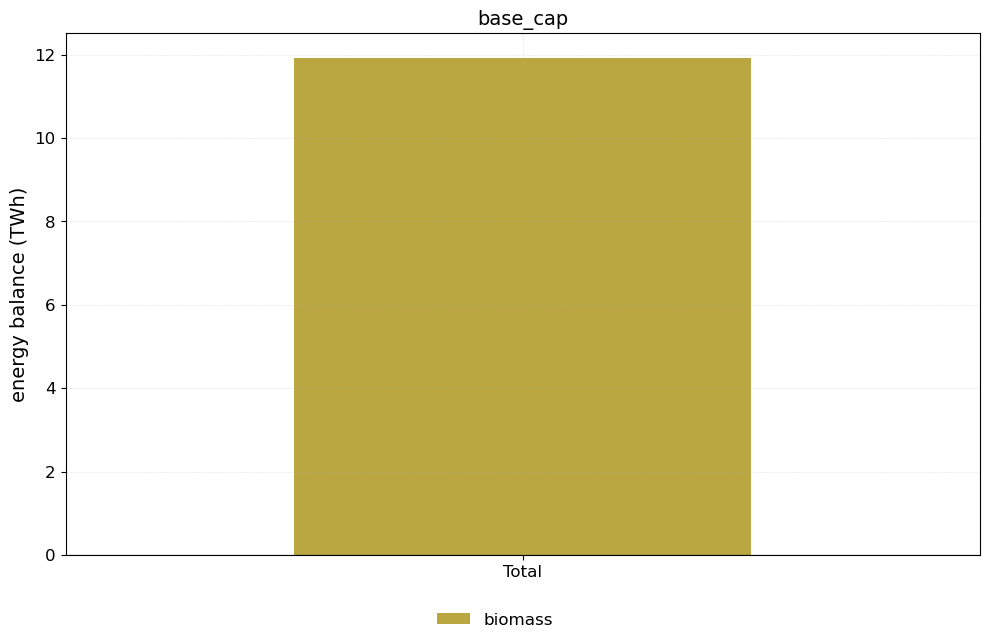

In [135]:
plot_stats_bar(
    diff[
        # diff["tech"].isin(SUP_CARRIERS + CHARGE_CARRIERS)
        diff["tech"].isin(["biomass"])
        # diff["techgroup"].isin(["Generator", "StorageUnit"])
        # & (diff["bus_carrier"] == "AC")
    ],
    column="energy balance",
    multiplier=1e-6,
    title="energy balance (TWh)",
    networks=["base_cap"],
    aggregate = True,
    color_map=color_map,
    figsize=(10, 6)
)

(<Figure size 1000x600 with 1 Axes>,
 [<Axes: title={'center': 'base'}, xlabel='Bus', ylabel='Optimal Capacity (GW)'>])

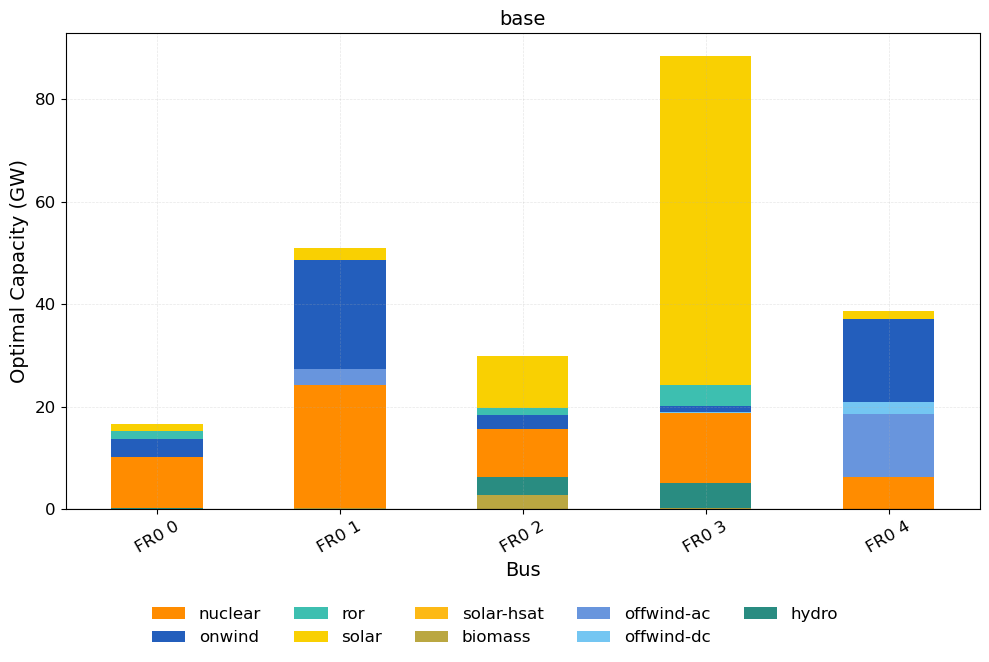

In [288]:
plot_stats_bar(
    diff[
        diff["tech"].isin(SUP_CARRIERS)
        # diff["techgroup"].isin(["Generator", "StorageUnit"])
        # & (diff["bus_carrier"] == "AC")
    ],
    column="optimal capacity",
    multiplier=1e-3,
    title="Optimal Capacity (GW)",
    networks=["base"],
    # aggregate = True,
    color_map=color_map,
    figsize=(10, 6)
)

(<Figure size 1000x600 with 2 Axes>,
 array([<Axes: title={'center': 'base_cap'}, xlabel='Bus', ylabel='installed Capacity (MW)'>,
        <Axes: title={'center': 'cap'}, xlabel='Bus'>], dtype=object))

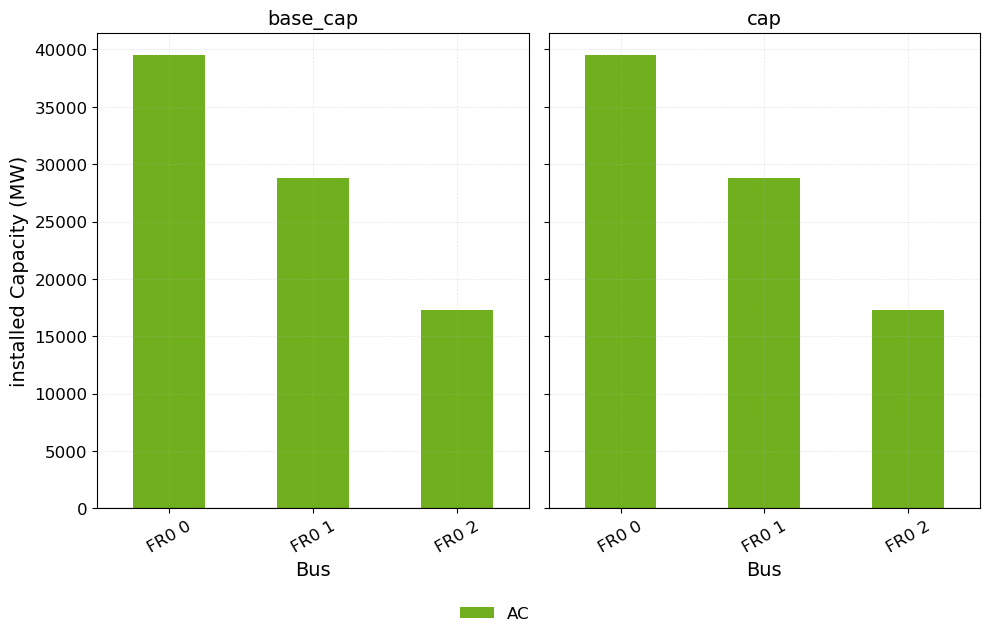

In [137]:
plot_stats_bar(
    diff[
        diff["techgroup"].isin(["Line", "Link"]) 
        & (diff["tech"] != "H2 electrolysis")
        & (diff["bus_carrier"] == "AC")
    ],
    column="installed capacity",
    networks=["base_cap", "cap"],
    multiplier=1,
    title="installed Capacity (MW)",
    color_map=networks["base_cap"].carriers.color.to_dict(),
    figsize=(10, 6)
)

(<Figure size 600x600 with 2 Axes>,
 array([<Axes: title={'center': 'dis'}, ylabel='Energy Balance Difference (GWh)'>,
        <Axes: title={'center': 'cap'}>], dtype=object))

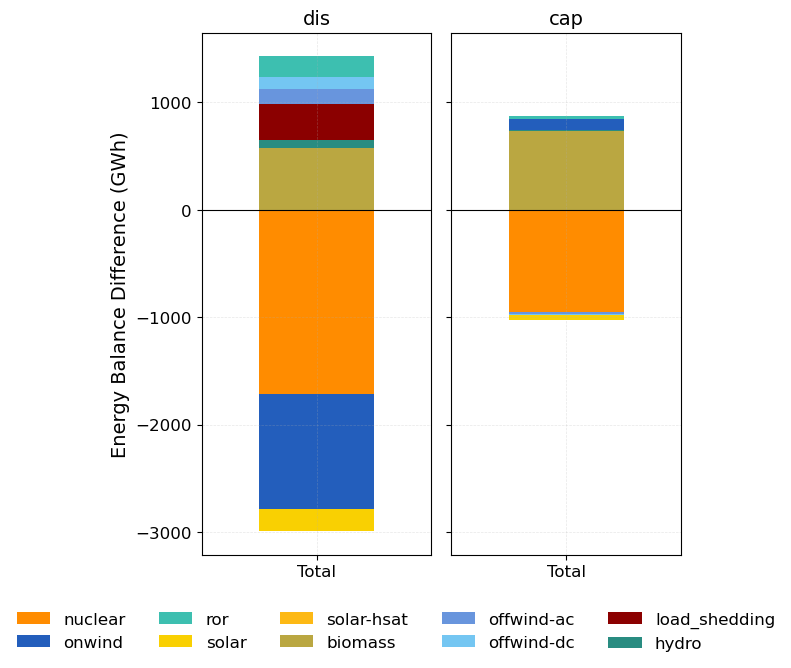

In [163]:
diff = compute_stats_diff(stats, base="base")
diff = format_stats_df(diff, index_names=["techgroup", "network", "bus", "tech", "bus_carrier"])
plot_stats_bar(
    diff[
        diff["tech"].isin(SUP_CARRIERS) 
        # & (diff["tech"] != "H2 electrolysis")
        & (diff["bus_carrier"] == "AC")
    ],
    column="energy_balance_diff",
    networks=["dis", "cap"],
    multiplier=1e-3,
    aggregate=True,
    title="Energy Balance Difference (GWh)",
    color_map=color_map,
    figsize=(6, 6)
)

In [67]:
CHARGE_CARRIERS

['H2 electrolysis', 'H2 fuel cell', 'battery', 'PHS']

(<Figure size 1000x600 with 1 Axes>,
 [<Axes: title={'center': 'dis'}, xlabel='Bus', ylabel='Energy Balance Difference (GWh)'>])

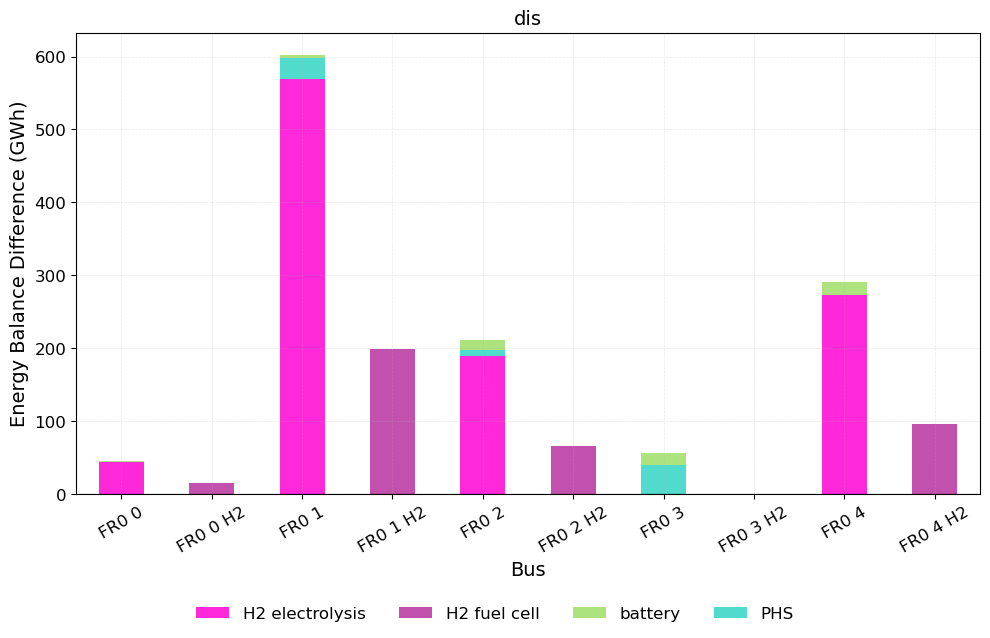

In [279]:
diff = compute_stats_diff(stats, base="base")
diff = format_stats_df(diff, index_names=["techgroup", "network", "bus", "tech", "bus_carrier"])
plot_stats_bar(
    diff[
        diff["tech"].isin(CHARGE_CARRIERS) 
        # & (diff["tech"] != "H2 electrolysis")
        # & (diff["bus_carrier"] == "AC")
    ],
    column="energy_balance_diff",
    networks=["dis"],
    multiplier=1e-3,
    carrier_multipliers={"H2 fuel cell": fc_efficiency},
    aggregate=False,
    title="Energy Balance Difference (GWh)",
    color_map=color_map,
    figsize=(10, 6)
)

(<Figure size 1000x600 with 1 Axes>,
 [<Axes: title={'center': 'dis'}, ylabel='Energy Balance Difference (GWh)'>])

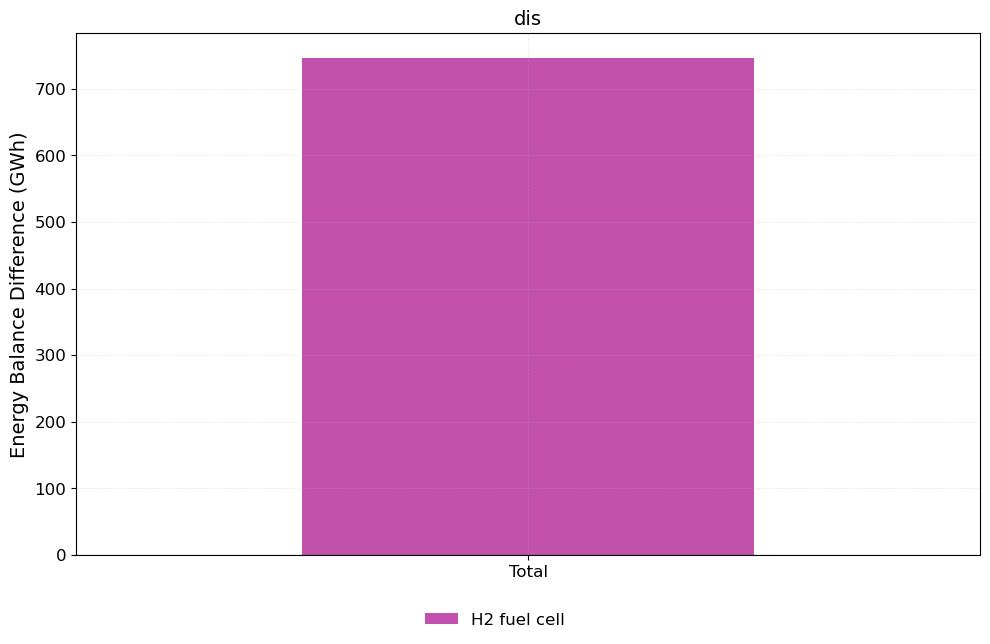

In [145]:
diff = compute_stats_diff(stats, base="base")
diff = format_stats_df(diff, index_names=["techgroup", "network", "bus", "tech", "bus_carrier"])
plot_stats_bar(
    diff[
        diff["tech"].isin(STOR_CARRIERS) 
        # & (diff["tech"] != "H2 electrolysis")
        # & (diff["bus_carrier"] == "AC")
    ],
    column="energy_balance_diff",
    networks=["dis"],
    multiplier=1e-3,
    aggregate=False,
    title="Energy Balance Difference (GWh)",
    color_map=color_map,
    figsize=(10, 6)
)

(<Figure size 1000x600 with 1 Axes>,
 [<Axes: title={'center': 'base_cap'}, ylabel='Optimal Capacity (GW)'>])

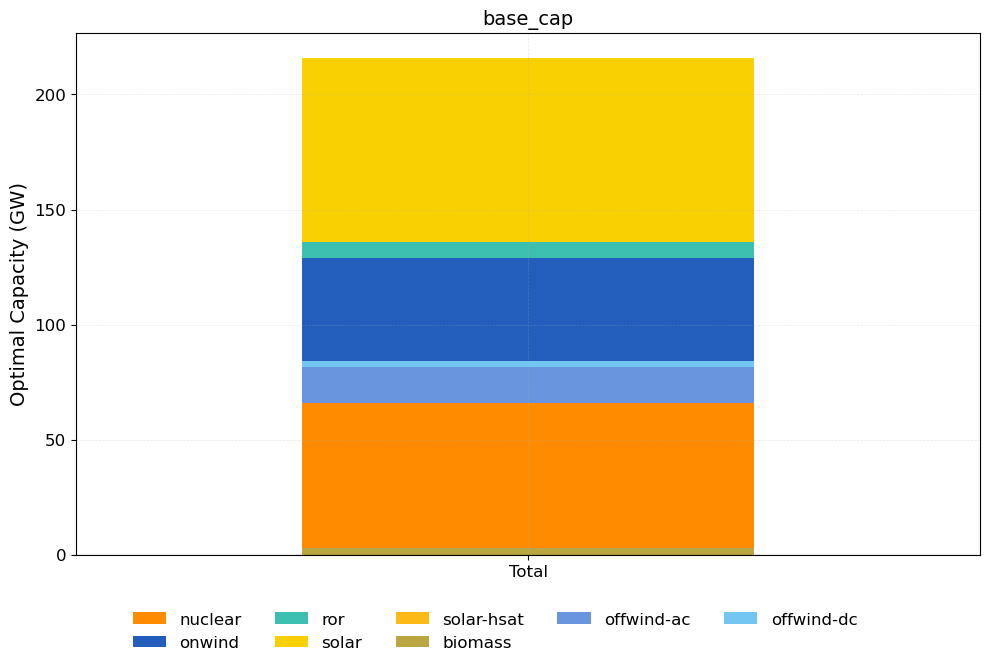

In [342]:
plot_stats_bar(
    diff[
        diff["tech"].isin(SUP_CARRIERS) 
        # & (diff["tech"] != "H2 electrolysis")
        # & (diff["bus_carrier"] == "AC")
    ],
    column="optimal capacity",
    networks=["base_cap"],
    multiplier=1e-3,
    aggregate=True,
    title="Optimal Capacity (GW)",
    color_map=color_map,
    figsize=(10, 6)
)

(<Figure size 1000x600 with 2 Axes>,
 array([<Axes: title={'center': 'base'}, xlabel='Bus', ylabel='energy balance (TWh)'>,
        <Axes: title={'center': 'dis'}, xlabel='Bus'>], dtype=object))

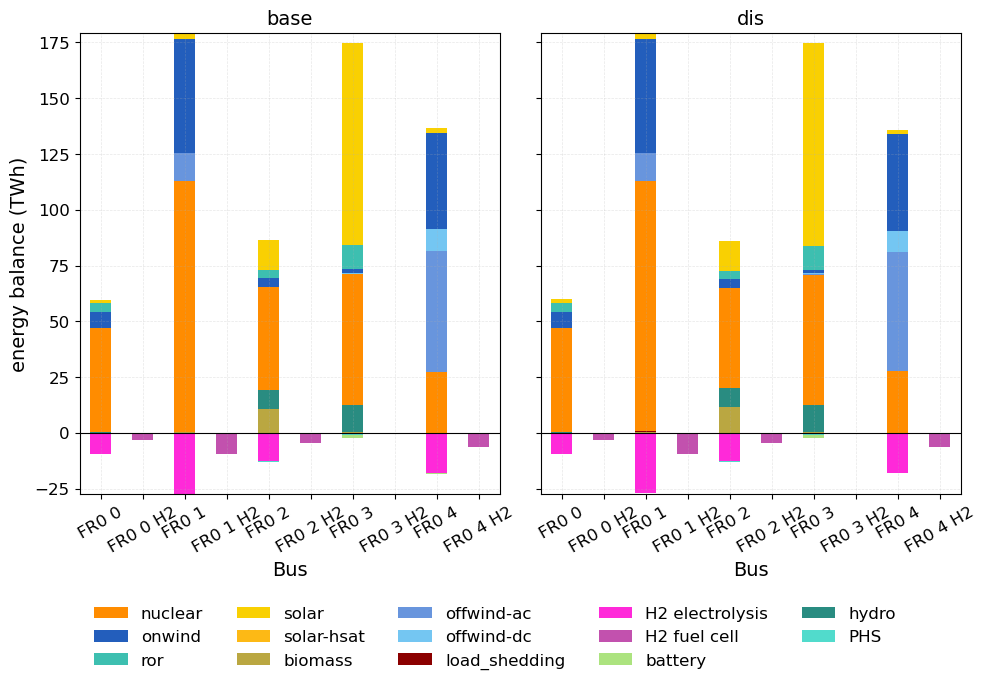

In [281]:

plot_stats_bar(
    diff[
        diff["tech"].isin(SUP_CARRIERS + CHARGE_CARRIERS) 
        # & (diff["tech"] != "H2 electrolysis")
        # & (diff["bus_carrier"] == "AC")
    ],
    column="energy balance",
    networks=["base", "dis"],
    multiplier=1e-6,
    carrier_multipliers={"H2 fuel cell": fc_efficiency},
    # aggregate=True,
    title="energy balance (TWh)",
    color_map=color_map,
    figsize=(10, 6)
)

(<Figure size 600x600 with 1 Axes>,
 [<Axes: title={'center': 'dis'}, xlabel='Bus', ylabel='Load Shedding (GWh)'>])

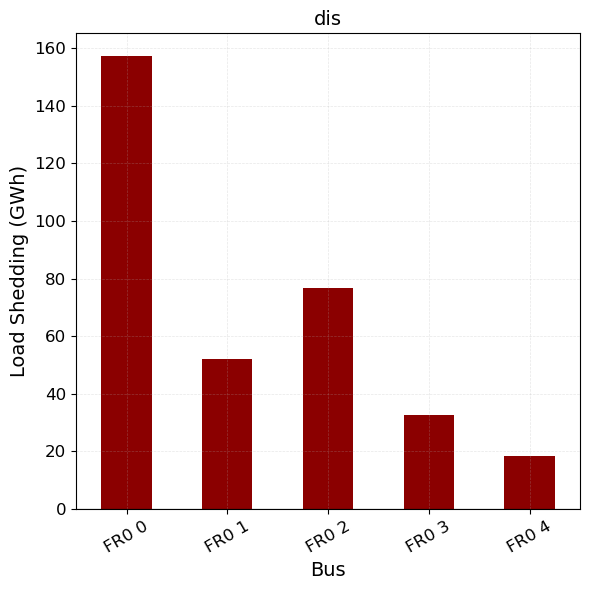

In [88]:
plot_stats_bar(
    diff[
        diff["tech"].isin(["load_shedding"]) 
        # & (diff["tech"] != "H2 electrolysis")
        & (diff["bus_carrier"] == "AC")
    ],
    column="energy_balance_diff",
    networks=["dis"],
    multiplier=1e-3,
    aggregate=False,
    title="Load Shedding (GWh)",
    color_map=color_map,
    show_legend=False,
    figsize=(6, 6)
)

(<Figure size 1000x600 with 1 Axes>,
 [<Axes: title={'center': 'dis'}, xlabel='Bus', ylabel='energy balance diff (GWh)'>])

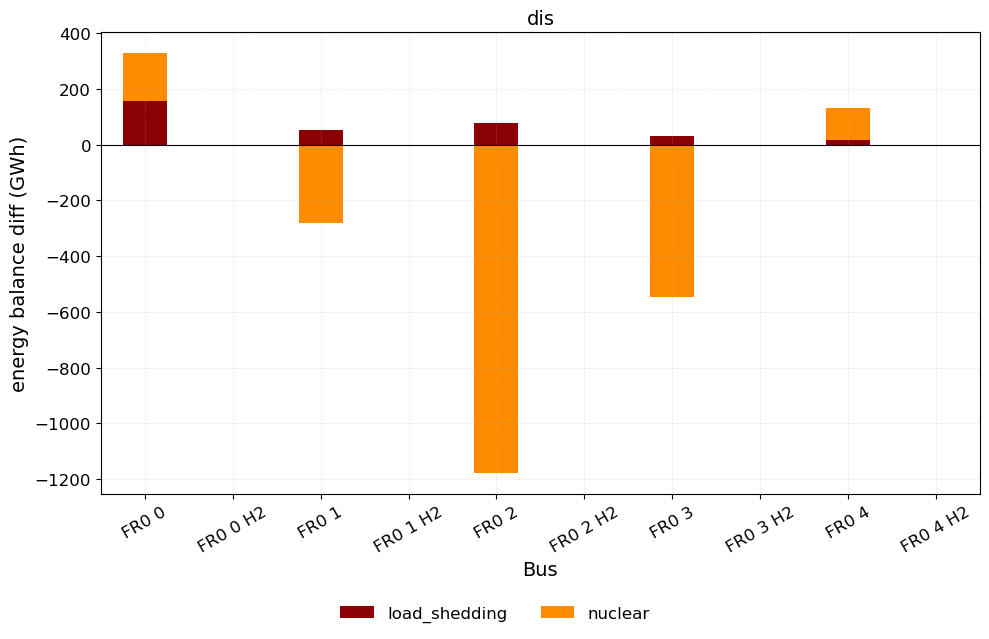

In [89]:
plot_stats_bar(
    diff[
        diff["tech"].isin(["load_shedding", "nuclear"]) 
        # & (diff["tech"] != "H2 electrolysis")
        # & (diff["bus_carrier"] == "AC")
    ],
    column="energy_balance_diff",
    networks=["dis"],
    multiplier=1e-3,
    aggregate=False,
    title="energy balance diff (GWh)",
    color_map=color_map,
    figsize=(10, 6)
)

In [63]:
# In FR22 notebook
diff_fr22_2022 = diff[diff["tech"].isin(SUP_CARRIERS + CHARGE_CARRIERS)].groupby("tech")["energy_balance_diff"].sum()



print(diff_fr22_2022)



tech
H2 electrolysis    8.140702e+07
H2 fuel cell       5.693609e+07
battery            2.160914e+05
biomass            9.747563e+07
hydro              1.696542e+04
load_shedding      1.640702e+06
nuclear            1.894996e+06
offwind-ac        -8.965122e+06
offwind-dc        -2.982836e+06
onwind            -5.280847e+07
ror               -8.954296e+07
solar              5.436816e+04
solar-hsat        -3.807045e+04
Name: energy_balance_diff, dtype: float64


(<Figure size 800x600 with 1 Axes>,
 [<Axes: title={'center': 'cap'}, xlabel='Bus', ylabel='Δ Optimal Capacity (MW)'>])

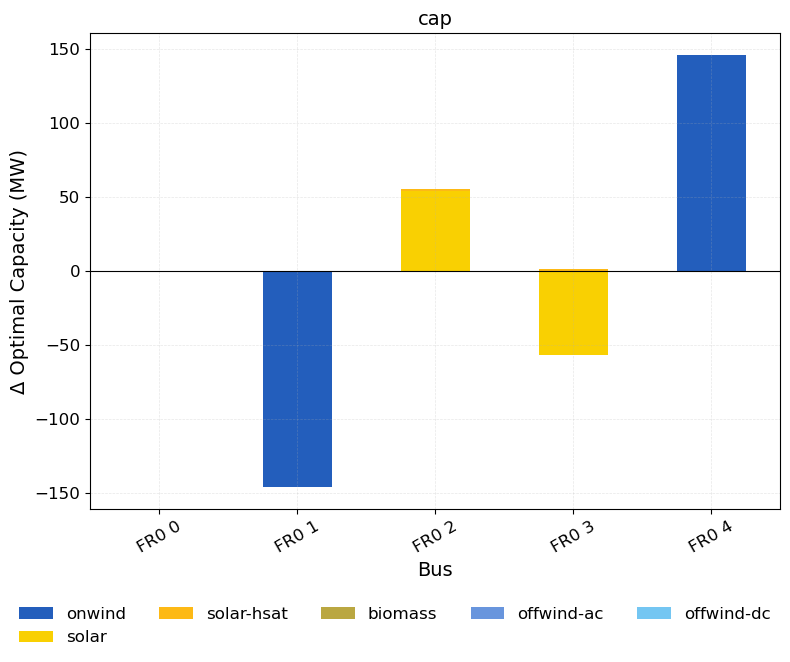

In [164]:
plot_stats_bar(
    diff[
        diff["tech"].isin(SUP_CARRIERS)
        # diff["techgroup"].isin(["Generator", "StorageUnit"])
        # & (diff["bus_carrier"] == "AC")
    ],
    column="optimal_capacity_diff",
    # multiplier=1e-3,
    carrier_multipliers={"H2 fuel cell": fc_efficiency},
    title="\u0394 Optimal Capacity (MW)",
    networks=["cap"],
    color_map=color_map,
    figsize=(8, 6)
)

(<Figure size 800x600 with 1 Axes>,
 [<Axes: title={'center': 'cap'}, xlabel='Bus', ylabel='Δ Optimal Capacity (MW)'>])

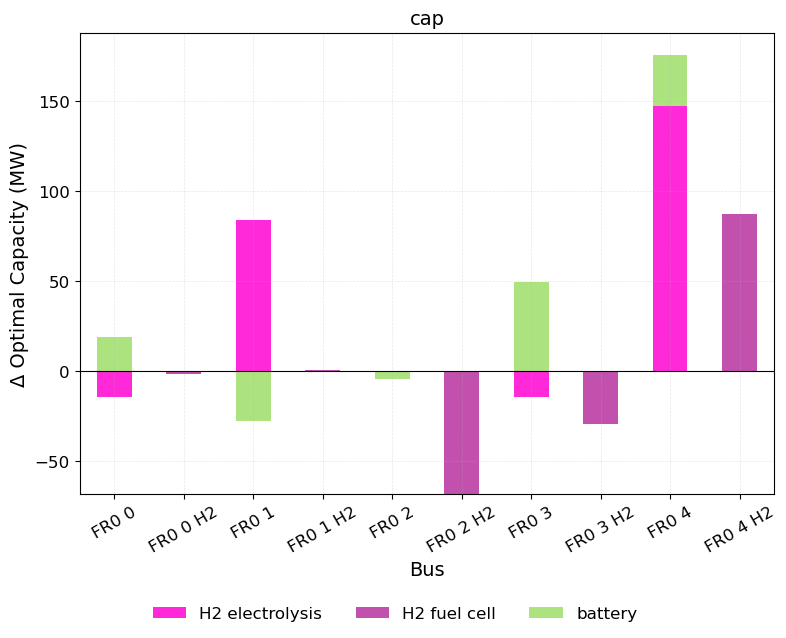

In [167]:
plot_stats_bar(
    diff[
        diff["tech"].isin(CHARGE_CARRIERS)
        # diff["techgroup"].isin(["Generator", "StorageUnit"])
        # & (diff["bus_carrier"] == "AC")
    ],
    column="optimal_capacity_diff",
    # multiplier=1e-3,
    carrier_multipliers={"H2 fuel cell": fc_efficiency},
    title="\u0394 Optimal Capacity (MW)",
    networks=["cap"],
    aggregate=False,
    color_map=color_map,
    figsize=(8, 6)
)

(<Figure size 1000x600 with 1 Axes>,
 [<Axes: title={'center': 'cap'}, xlabel='Bus', ylabel='Optimal Capacity (GW)'>])

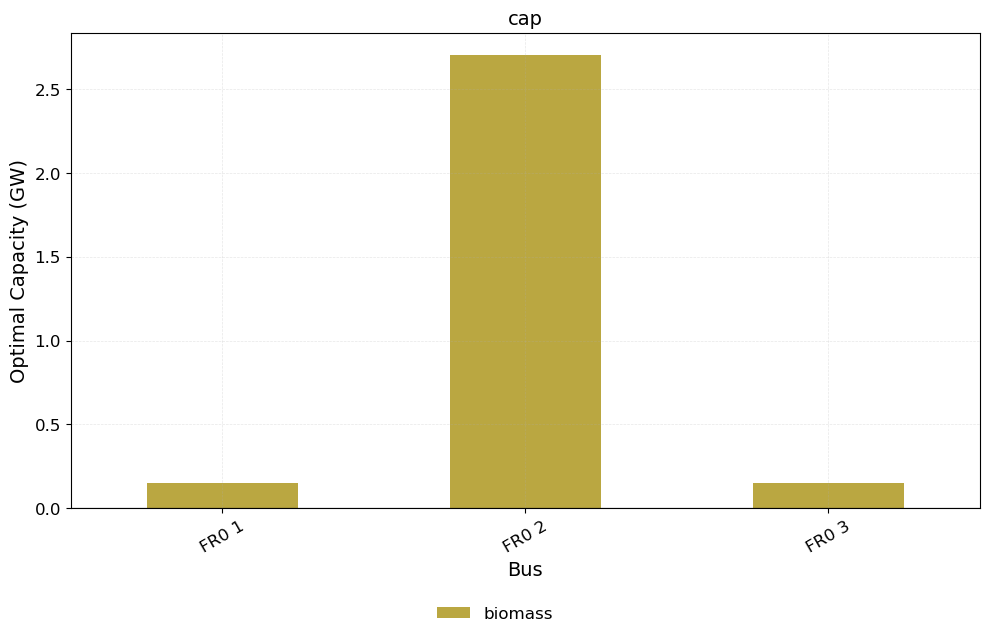

In [346]:
plot_stats_bar(
    diff[
        diff["tech"].isin(["biomass"])
        # diff["techgroup"].isin(["Generator", "StorageUnit"])
        # & (diff["bus_carrier"] == "AC")
    ],
    column="optimal capacity",
    multiplier=1e-3,
    title="Optimal Capacity (GW)",
    networks=["cap"],
    color_map=color_map,
    figsize=(10, 6)
)

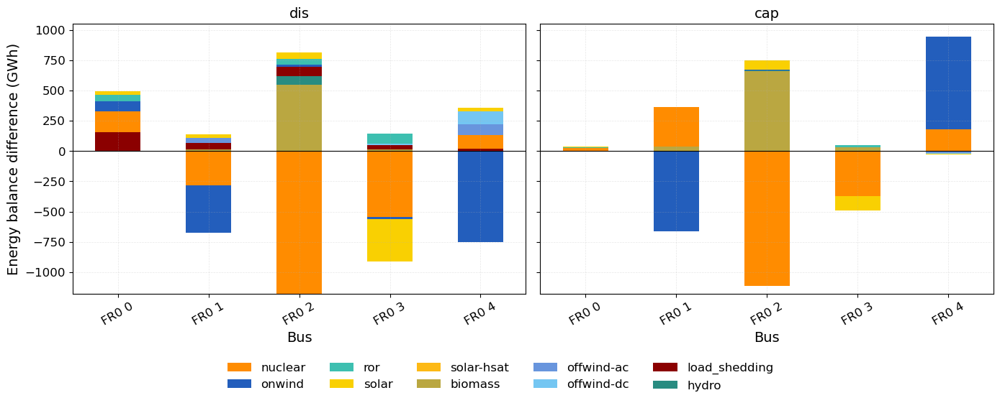

In [150]:
# ── Statistics across all networks ────────────────────────────────────────────
# grouper = ["bus", "carrier", "bus_carrier"]
# stats = nc.statistics(groupby=grouper, nice_names=False)
# stats["Expanded Capacity"] = stats["Optimal Capacity"] - stats["Installed Capacity"]

# diff = compute_stats_diff(stats, base="base_cap")
# diff = format_stats_df(diff, index_names=["techgroup", "network", "bus", "tech", "bus_carrier"])

NUC_CARRIERS = ["nuclear"]

fig, axes = plot_stats_bar(
    diff[
        diff["tech"].isin(SUP_CARRIERS) &
        (diff["bus_carrier"] == "AC")
    ],
    column="energy_balance_diff",
    networks=["dis", "cap"],
    multiplier=1e-3,
    title="Energy balance difference (GWh)",
    color_map=color_map,
)




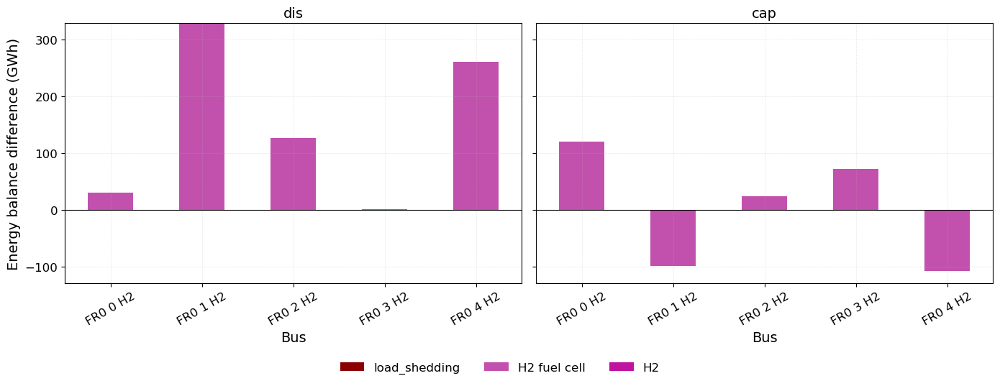

In [151]:
# ── Statistics across all networks ────────────────────────────────────────────
# grouper = ["bus", "carrier", "bus_carrier"]
# stats = nc.statistics(groupby=grouper, nice_names=False)
# stats["Expanded Capacity"] = stats["Optimal Capacity"] - stats["Installed Capacity"]

# diff = compute_stats_diff(stats, base="base_cap")
# diff = format_stats_df(diff, index_names=["techgroup", "network", "bus", "tech", "bus_carrier"])

NUC_CARRIERS = ["nuclear"]

fig, axes = plot_stats_bar(
    diff[
        # diff["tech"].isin(SUP_CARRIERS) &
        (diff["bus_carrier"] == "H2")
    ],
    column="energy_balance_diff",
    networks=["dis", "cap"],
    multiplier=1e-3,
    title="Energy balance difference (GWh)",
    color_map=color_map,
)




# Energy Balance Plot

In [ ]:
def format_ts_df(nc, stat="energy_balance", **stat_kwargs):
    result = getattr(nc.statistics, stat)(
        groupby=["bus", "carrier", "bus_carrier"],
        groupby_time=False,
        nice_names=False,
        **stat_kwargs,
    )
    df = result.reset_index()
    meta_cols = [c for c in df.columns if not isinstance(c, pd.Timestamp)]
    ts_cols   = [c for c in df.columns if isinstance(c, pd.Timestamp)]
    df = df.melt(id_vars=meta_cols, value_vars=ts_cols, var_name="snapshot", value_name="value")
    return df

_CARRIER_COLOR_OVERRIDES = {"load_shedding": "darkred"}

# ── format_ts_diff_df ───────────────────────────────────────
def format_ts_diff_df(networks, stat="energy_balance", base="base", **stat_kwargs):
    if base not in networks:
        raise ValueError(f"Base label {base!r} not found in networks.")
    all_dfs = []
    for label, n in networks.items():
        df = format_ts_df(n, stat=stat, **stat_kwargs)
        df["network"] = label
        all_dfs.append(df)
    combined = pd.concat(all_dfs, ignore_index=True)
    merge_keys = ["bus", "carrier", "bus_carrier", "snapshot"]
    base_vals = (
        combined[combined["network"] == base][merge_keys + ["value"]]
        .rename(columns={"value": "_base_value"})
    )
    combined = combined.merge(base_vals, on=merge_keys, how="left")
    combined["_base_value"] = combined["_base_value"].fillna(0)
    combined["value"]       = combined["value"].fillna(0)
    combined["value_diff"]  = combined["value"] - combined["_base_value"]
    combined.drop(columns="_base_value", inplace=True)
    return combined



In [218]:
def plot_stats_area(
    df,
    *,
    networks,
    bus_carriers,
    date_range=None,
    color_map=None,
    title=None,
    multiplier=1.0,
    show_legend=True,
    aggregate=False,
    facet_col="network",
    facet_row="bus_carrier",
    figsize=(14, 5),
    carrier_order=None,
):
    data = df[df["network"].isin(networks)].copy()
    data = data[data["bus_carrier"].isin(bus_carriers)]
    if date_range is not None:
        start, end = pd.Timestamp(date_range[0]), pd.Timestamp(date_range[1])
        data = data[(data["snapshot"] >= start) & (data["snapshot"] <= end)]
    if multiplier != 1.0:
        data["value"] = data["value"] * multiplier

    effective_map = {**(color_map or {}), **_CARRIER_COLOR_OVERRIDES}

    col_vals = networks     if facet_col == "network" else bus_carriers
    row_vals = bus_carriers if facet_row == "bus_carrier" else networks

    print(" | ".join(str(cv) for cv in col_vals))

    if aggregate:
        row_index = [(rv, None) for rv in row_vals]
    else:
        row_index = [
            (rv, bus)
            for rv in row_vals
            for bus in sorted(data[data[facet_row] == rv]["bus"].unique())
        ]

    n_rows, n_cols = len(row_index), len(col_vals)
    fig, axes = plt.subplots(n_rows, n_cols, figsize=figsize, sharey=False, squeeze=False)

    for row_i, (rv, bus) in enumerate(row_index):
        for col_i, cv in enumerate(col_vals):
            ax = axes[row_i, col_i]
            slice_ = data[(data[facet_col] == cv) & (data[facet_row] == rv)]
            if bus is not None:
                slice_ = slice_[slice_["bus"] == bus]

            pivot = (
                slice_.groupby(["snapshot", "carrier"])["value"]
                .sum()
                .unstack(fill_value=0)
            )

            if pivot.empty:
                ax.set_visible(False)
                continue

            if carrier_order is not None:
                ordered = [c for c in carrier_order if c in pivot.columns]
                rest    = [c for c in pivot.columns if c not in carrier_order]
                pivot   = pivot[ordered + rest]

            for clipped in [pivot.clip(lower=0), pivot.clip(upper=0)]:
                active = clipped.loc[:, (clipped != 0).any()]
                if active.empty:
                    continue
                colors = [effective_map.get(c) or "#aaaaaa" for c in active.columns]
                ax.stackplot(active.index, active.T.values, colors=colors, alpha=0.85)

            ax.axhline(0, color="black", linewidth=0.8)
            ax.grid(True, axis="y", alpha=0.3, linestyle="--", linewidth=0.5)
            ax.xaxis.set_major_formatter(mdates.DateFormatter("%m-%d"))
            ax.tick_params(axis="x", rotation=30)

            if col_i == 0:
                row_label = rv if bus is None else f"{rv} | {bus}"
                ax.set_ylabel(f"{row_label}\n{title or 'value'}")

    if show_legend:
        all_carriers = data["carrier"].unique()
        handles = [mpatches.Patch(facecolor=effective_map.get(c) or "#aaaaaa", label=c) for c in all_carriers]
        ncols = min(len(handles), 5)
        fig.tight_layout()
        ax_bottom = min(ax.get_position().y0 for ax in axes[-1])
        fig.legend(handles=handles, loc="upper center", bbox_to_anchor=(0.5, ax_bottom - 0.03),
                   bbox_transform=fig.transFigure, ncol=ncols, frameon=False)
    else:
        fig.tight_layout()

    return fig, axes


In [37]:
EXCLUDE_gen_storage = ["coal", "ocgt", "CCGT", "offwind-float", "lignite", "oil"]
ts_eb = format_ts_df(nc, stat="energy_balance")
ts_eb = ts_eb[~ts_eb["carrier"].isin(EXCLUDE_gen_storage)]



In [207]:
carrier_order = [
    'nuclear', 'biomass', 'ror', 'offwind-ac', 'offwind-dc', 'onwind',
    'solar', 'solar-hsat', 'AC', 'H2 electrolysis',
    'H2 fuel cell', 'load', 'battery', 'hydro', 'PHS', 'H2', 'load_shedding'
]


In [296]:
ts_eb.carrier.unique()

array(['nuclear', 'onwind', 'ror', 'solar', 'solar-hsat', 'biomass',
       'offwind-ac', 'offwind-dc', 'load_shedding', 'AC',
       'H2 electrolysis', 'H2 fuel cell', 'load', 'battery', 'hydro',
       'PHS', 'H2'], dtype=object)

AC


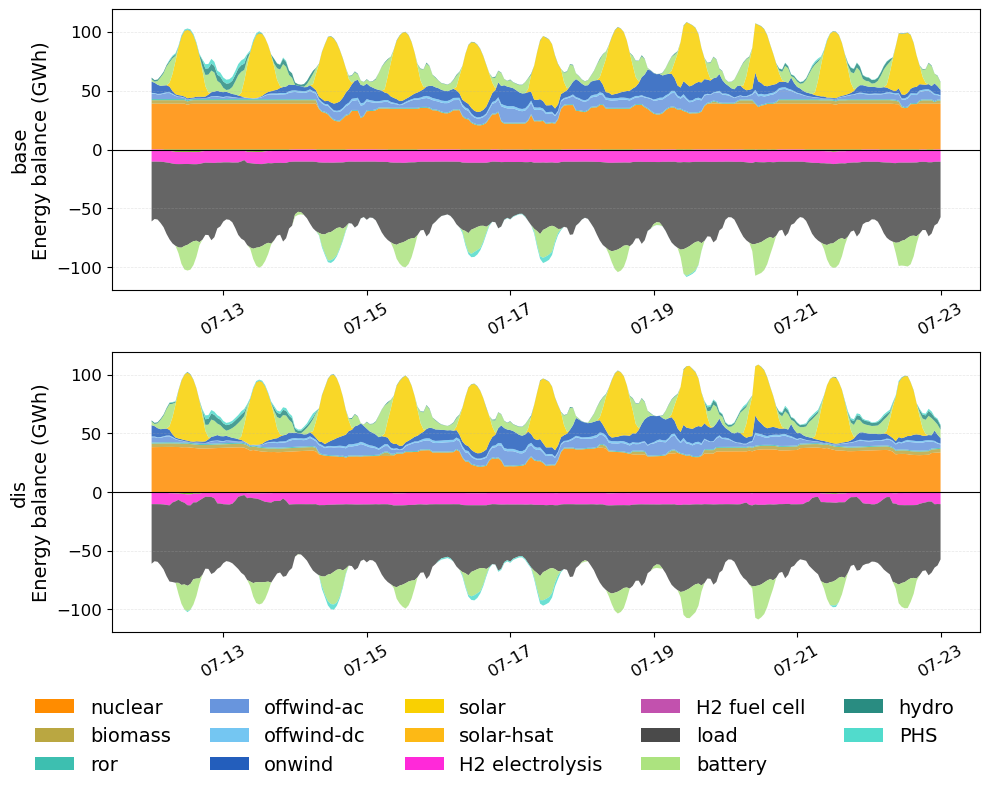

In [219]:
fig, axes = plot_stats_area(
    ts_eb[ts_eb["component"].isin(["Generator", "StorageUnit", "Link", "Store", "Load", "Line"])
        #   & (ts_eb["bus"] == "FR0 4")
          ],
    networks=["base", "dis"],
    bus_carriers=["AC"],
    facet_col="bus_carrier",
    facet_row="network",
    date_range=("2022-07-12", "2022-07-23"),
    aggregate=True,
    carrier_order = carrier_order,
    color_map=color_map,
    multiplier=1e-3,
    title="Energy balance (GWh)",
    figsize=(10, 7),
    show_legend=False
    
)

effective_map = {**color_map}
all_carriers = ts_eb[ts_eb["network"].isin(["base"])]["carrier"].unique()
keep = set(SUP_CARRIERS + CHARGE_CARRIERS + STOR_CARRIERS + ["load"])
handles = [mpatches.Patch(facecolor=effective_map.get(c, "#aaaaaa"), label=c)
           for c in carrier_order if c in all_carriers and c in keep]

fig.legend(handles=handles, loc="upper center",
           bbox_to_anchor=(0.5, 0.02), bbox_transform=fig.transFigure,
           ncol=min(len(handles), 5), frameon=False, fontsize=14)
fig.tight_layout()
plt.show()

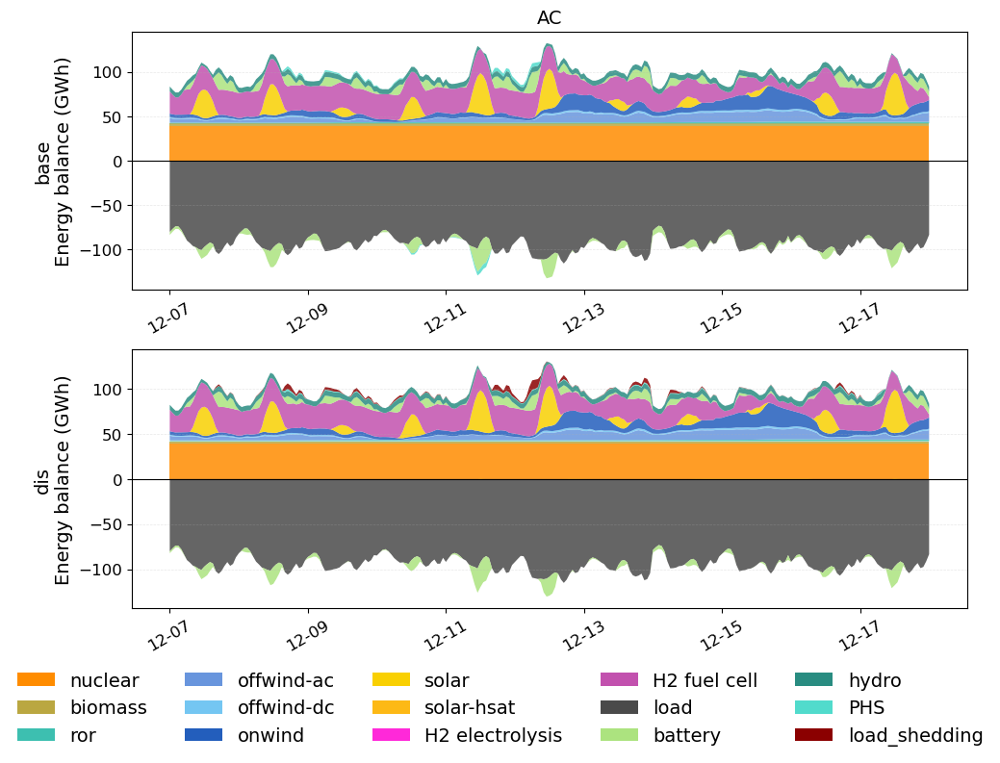

In [214]:

fig, axes = plot_stats_area(
    ts_eb[ts_eb["component"].isin(["Generator", "StorageUnit", "Link", "Store", "Load", "Line"])
        #   & (ts_eb["bus"] == "FR0 4")
          ],
    networks=["base", "dis"],
    bus_carriers=["AC"],
    facet_col="bus_carrier",
    facet_row="network",
    date_range=("2022-12-07", "2022-12-18"),
    aggregate=True,
    carrier_order = carrier_order,
    color_map=color_map,
    multiplier=1e-3,
    title="Energy balance (GWh)",
    figsize=(10, 7),
    show_legend=False
    
)

effective_map = {**color_map, **_CARRIER_COLOR_OVERRIDES}
all_carriers = ts_eb[ts_eb["network"].isin(["base", "dis"])]["carrier"].unique()
keep = set(SUP_CARRIERS + CHARGE_CARRIERS + STOR_CARRIERS + ["load", "load_shedding"])
handles = [mpatches.Patch(facecolor=effective_map.get(c, "#aaaaaa"), label=c)
           for c in carrier_order if c in all_carriers and c in keep]

fig.legend(handles=handles, loc="upper center",
           bbox_to_anchor=(0.5, 0.02), bbox_transform=fig.transFigure,
           ncol=min(len(handles), 5), frameon=False, fontsize=14)
fig.tight_layout()
plt.show()

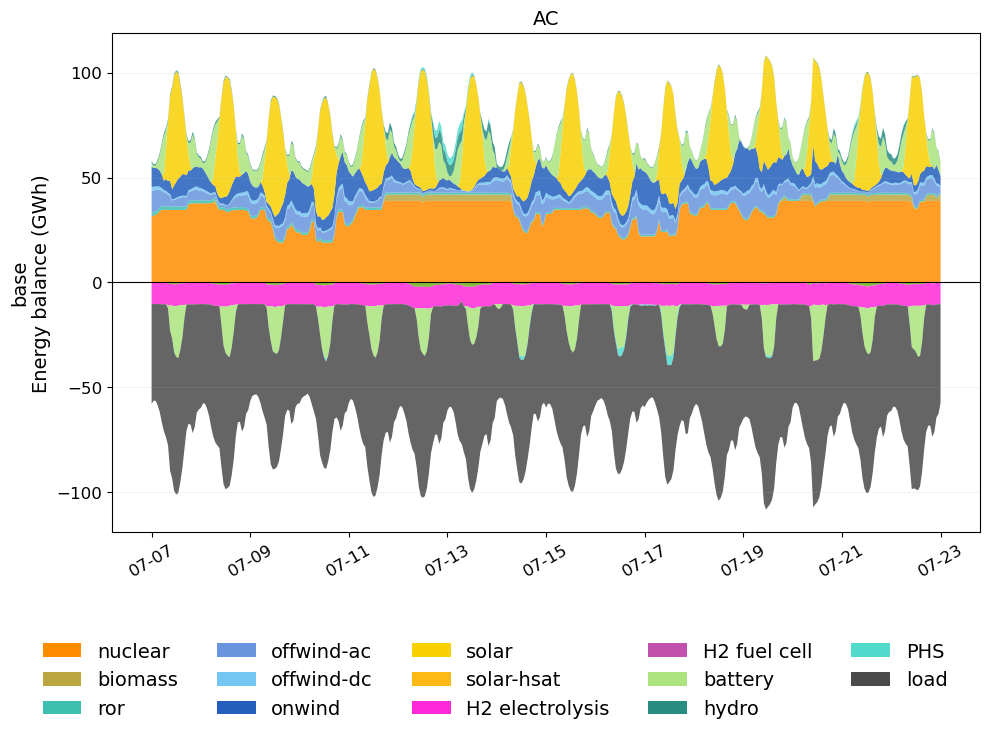

In [35]:
fig, axes = plot_stats_area(
    ts_eb[ts_eb["component"].isin(["Generator", "StorageUnit", "Link", "Store", "Load", "Line"])
        #   & (ts_eb["bus"] == "FR0 0")
          ],
    networks=["base"],
    bus_carriers=["AC"],
    facet_col="bus_carrier",
    facet_row="network",
    date_range=("2022-07-07", "2022-07-23"),
    # date_range=("2022-12-07", "2022-12-20"),
    # date_range=("2023-02-04", "2023-02-15"),
    aggregate=True,
    carrier_order = carrier_order,
    color_map=color_map,
    multiplier=1e-3,
    title="Energy balance (GWh)",
    figsize=(10, 6),
    show_legend=False
)

effective_map = {**color_map}
all_carriers = ts_eb[ts_eb["network"].isin(["base"])]["carrier"].unique()
keep = set(SUP_CARRIERS + CHARGE_CARRIERS + STOR_CARRIERS + ["load"])
handles = [mpatches.Patch(facecolor=effective_map.get(c, "#aaaaaa"), label=c)
           for c in carrier_order if c in all_carriers and c in keep]

if "load" in all_carriers:
    handles.append(mpatches.Patch(facecolor=effective_map.get("load", "#4a4a4a"), label="load"))

fig.legend(handles=handles, loc="upper center",
           bbox_to_anchor=(0.5, -0.05), bbox_transform=fig.transFigure,
           ncol=min(len(handles), 5), frameon=False, fontsize=14)
fig.tight_layout()
plt.show()

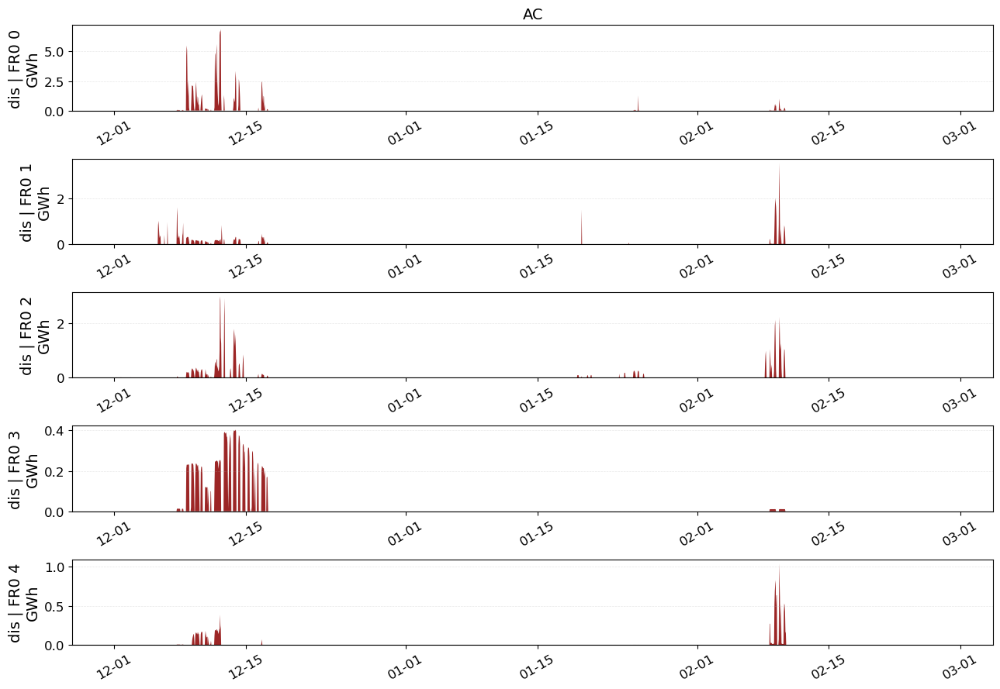

In [86]:
fig, axes = plot_stats_area(
    ts_eb[
        ts_eb["component"].isin(["Generator", "StorageUnit", "Link", "Store", "Load", "Line"]) &
        (ts_eb["carrier"] == "load_shedding")
    ],
    networks=["dis"],
    bus_carriers=["AC"],
    facet_col="bus_carrier",
    facet_row="network",
    date_range=("2022-12-01", "2023-02-28"),
    multiplier=1e-3,
    # aggregate=True,
    color_map=color_map,
    title="GWh",
    show_legend=False,
    figsize=(13, 9),
)


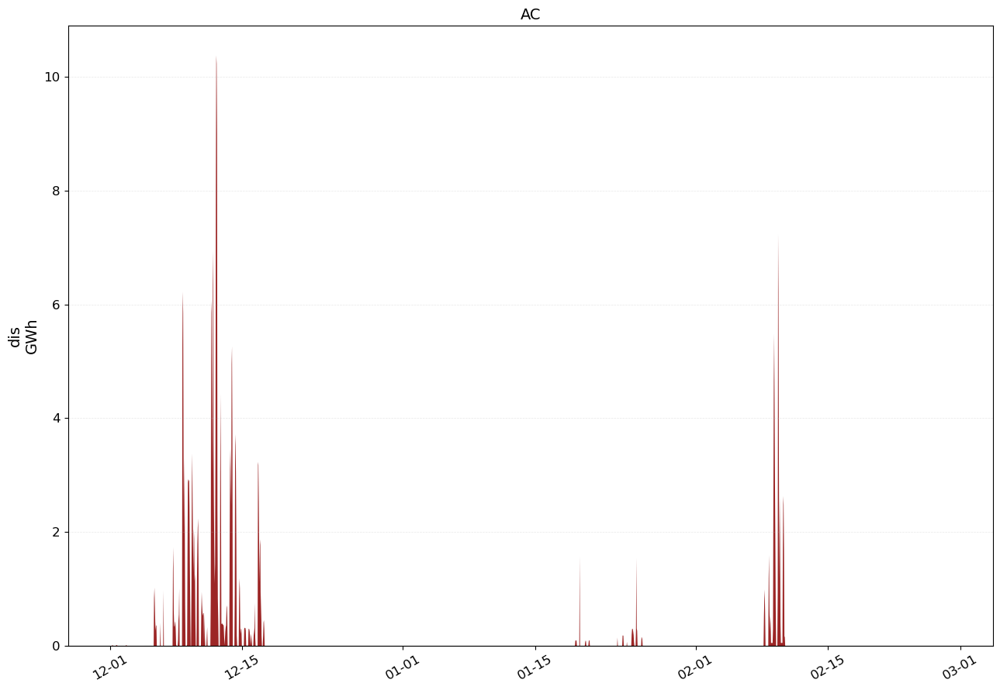

In [87]:
fig, axes = plot_stats_area(
    ts_eb[
        ts_eb["component"].isin(["Generator", "StorageUnit", "Link", "Store", "Load", "Line"]) &
        (ts_eb["carrier"] == "load_shedding")
    ],
    networks=["dis"],
    bus_carriers=["AC"],
    facet_col="bus_carrier",
    facet_row="network",
    date_range=("2022-12-01", "2023-02-28"),
    multiplier=1e-3,
    aggregate=True,
    color_map=color_map,
    title="GWh",
    show_legend=False,
    figsize=(13, 9),
)


In [298]:
base = "base"
scen = "dis"
ts_diff = format_ts_diff_df(networks, stat="energy_balance", base=base)


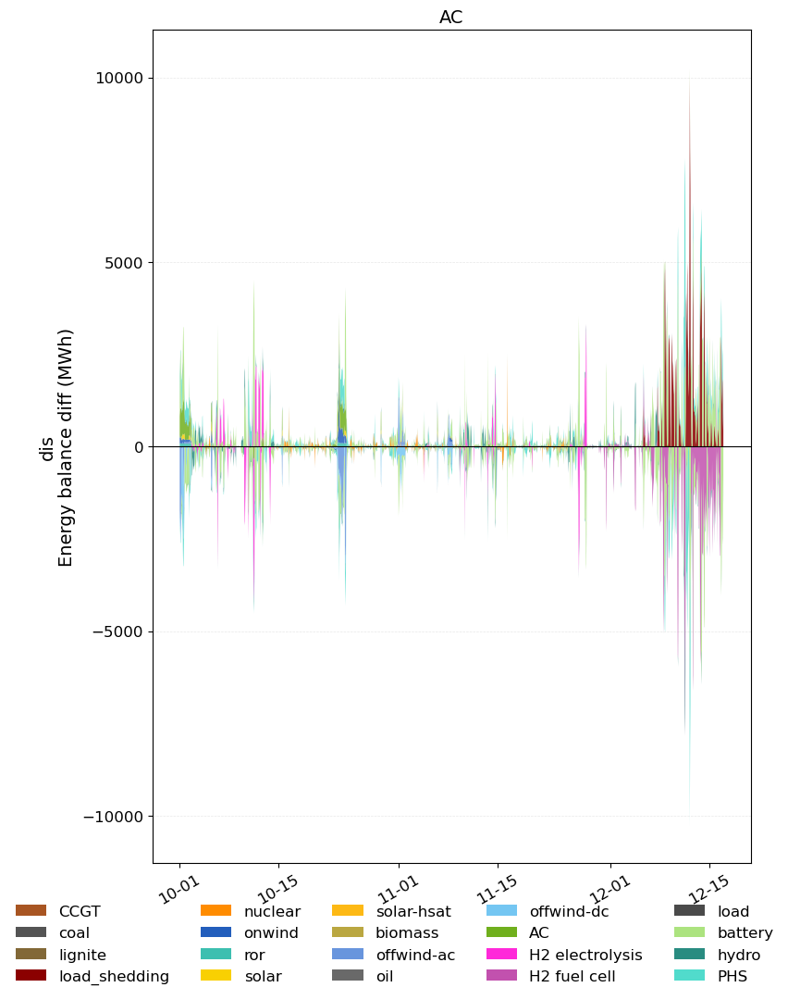

In [299]:
ts_diff_plot = ts_diff.copy()
ts_diff_plot["value"] = ts_diff_plot["value_diff"]

fig, axes = plot_stats_area(
    ts_diff_plot[
        ts_diff_plot["component"].isin(["Generator", "StorageUnit", "Link", "Store", "Load", "Line"])
        # & (ts_diff_plot["bus"] == "FR0 1")
    ],
    networks=["dis"],          # base network diffs will be zero, so only show the scenario
    bus_carriers=["AC"],
    facet_col="bus_carrier",
    facet_row="network",
    date_range=("2022-10-01", "2022-12-17"),
    aggregate=True,
    carrier_order=carrier_order,
    color_map=color_map,
    title="Energy balance diff (MWh)",
    figsize=(8, 10),
)


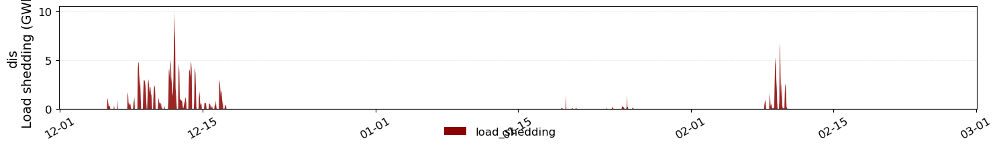

In [300]:
fig, axes = plot_stats_area(
    ts_eb[
        ts_eb["component"].isin(["Generator", "StorageUnit", "Link", "Store", "Load", "Line"]) &
        (ts_eb["carrier"] == "load_shedding")
    ],
    networks=["base_dis", "dis"],
    bus_carriers=["AC"],
    facet_col="bus_carrier",
    facet_row="network",
    date_range=("2022-12-05", "2023-02-25"),
    aggregate=True,
    multiplier=1e-3,
    color_map=color_map,
    title="Load shedding (GWh)",
    figsize=(15, 4),
)


In [57]:
ts_eb.carrier.unique()

array(['nuclear', 'onwind', 'ror', 'solar', 'solar-hsat', 'biomass',
       'offwind-ac', 'offwind-dc', 'load_shedding', 'AC',
       'H2 electrolysis', 'H2 fuel cell', 'load', 'battery', 'hydro',
       'PHS', 'H2'], dtype=object)

In [58]:
ts_eb

,component,network,bus,carrier,bus_carrier,snapshot,value
3,Generator,base,FR0 0,nuclear,AC,2022-06-01 00:00:00,5239.41982
4,Generator,base,FR0 0,onwind,AC,2022-06-01 00:00:00,361.87113
5,Generator,base,FR0 0,ror,AC,2022-06-01 00:00:00,500.47708
6,Generator,base,FR0 0,solar,AC,2022-06-01 00:00:00,NaN
7,Generator,base,FR0 0,solar-hsat,AC,2022-06-01 00:00:00,NaN
...,...,...,...,...,...,...,...
3985795,Store,dis,FR0 0 H2,H2,H2,2023-05-31 23:00:00,-1001.22990
3985796,Store,dis,FR0 1 H2,H2,H2,2023-05-31 23:00:00,-2860.09562
3985797,Store,dis,FR0 2 H2,H2,H2,2023-05-31 23:00:00,-1295.25813
3985798,Store,dis,FR0 3 H2,H2,H2,2023-05-31 23:00:00,-46.50893


In [52]:
ts_eb.component.unique()

array(['Generator', 'Line', 'Link', 'Load', 'StorageUnit', 'Store'],
      dtype=object)

# Energy loss and Time disruption

In [121]:
s = scenarios["dis"]

_cutout_times = pd.DatetimeIndex(cutout_data["lake_s_temp"].time.values)
damage_df_aligned = s["damage_df"].loc[s["damage_df"].index.intersection(_cutout_times)]

bus_df = build_bus_damage_df(
    "FR0 3",
    damage_df_aligned,
    cutout_data,
    s["powerplants_df"],
    mode="aggregate",
)


NameError: name 'build_bus_damage_df' is not defined

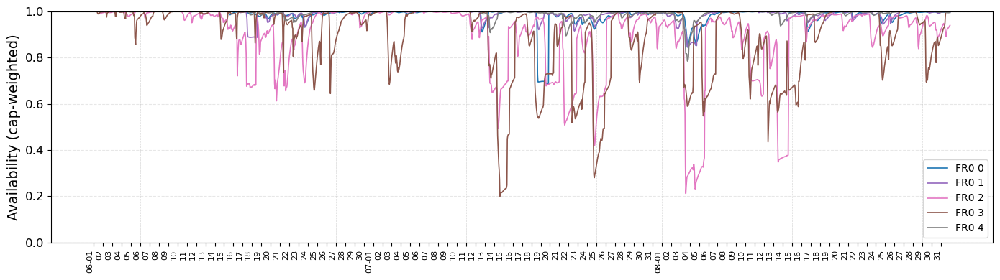

: 

: 

In [ ]:
import matplotlib.pyplot as plt

DATE_RANGE = ("2022-06-01", "2022-08-31")

s = scenarios["dis"]
buses = sorted(s["powerplants_df"]["bus"].unique())

fig, ax = plt.subplots(figsize=(14, 4))

for i, bus in enumerate(buses):
    bus_df = build_bus_damage_df(bus, damage_df_aligned, cutout_data, s["powerplants_df"], mode="aggregate")
    bus_df = bus_df.loc[DATE_RANGE[0]:DATE_RANGE[1]]
    ax.plot(bus_df.index, bus_df["availability"], label=bus,
            linewidth=1.2, color=_DAMAGE_COLORS[i % len(_DAMAGE_COLORS)])

tickvals, ticktext = _compute_day_ticks(bus_df.index)
ax.set_xticks(tickvals)
ax.set_xticklabels(ticktext, rotation=90, ha="right", fontsize=8)

days_until_monday = (7 - bus_df.index[0].weekday()) % 7
first_monday = bus_df.index[0].normalize() + pd.Timedelta(days=days_until_monday)
for d in pd.date_range(first_monday, bus_df.index[-1], freq="7D"):
    ax.axvline(d, color="grey", alpha=0.3, linestyle="--", linewidth=0.5, zorder=0)

ax.set_ylim(0, 1)
ax.set_yticks(np.arange(0, 1.2, 0.2))
ax.grid(True, which="major", axis="y", alpha=0.3, linestyle="--")
ax.set_ylabel("Availability (cap-weighted)")
ax.legend(loc="lower right", fontsize=10)
fig.tight_layout()
plt.show()



In [ ]:
weights = s["powerplants_df"].set_index("Name")["Capacity"]
common_plants = damage_df_aligned.columns.intersection(weights.index)
w = weights.loc[common_plants]

fleet_availability = (
    (1 - damage_df_aligned[common_plants])
    .mul(w, axis=1)
    .sum(axis=1)
    / w.sum()
)


: 

: 

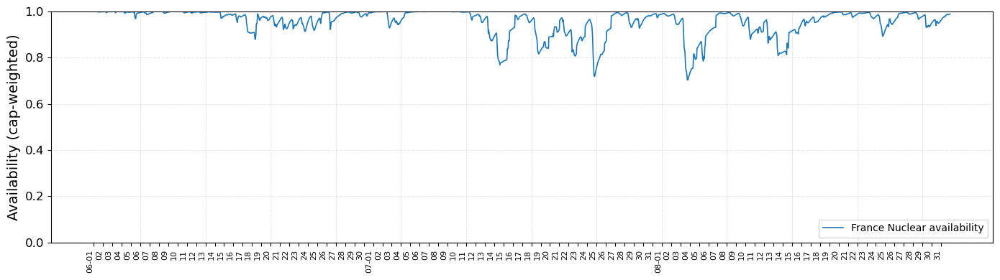

: 

: 

In [ ]:
fig, ax = plt.subplots(figsize=(14, 4))

sliced = fleet_availability.loc[DATE_RANGE[0]:DATE_RANGE[1]]

ax.plot(sliced, linewidth=1.2, color=_DAMAGE_SINGLE_COLOR, label="France Nuclear availability")

tickvals, ticktext = _compute_day_ticks(sliced.index)
ax.set_xticks(tickvals)
ax.set_xticklabels(ticktext, rotation=90, ha="right", fontsize=8)

days_until_monday = (7 - sliced.index[0].weekday()) % 7
first_monday = sliced.index[0].normalize() + pd.Timedelta(days=days_until_monday)
for d in pd.date_range(first_monday, sliced.index[-1], freq="7D"):
    ax.axvline(d, color="grey", alpha=0.3, linestyle="--", linewidth=0.5, zorder=0)

ax.set_ylim(0, 1)
ax.set_yticks(np.arange(0, 1.2, 0.2))
ax.grid(True, which="major", axis="y", alpha=0.3, linestyle="--")
ax.set_ylabel("Availability (cap-weighted)")
ax.legend(loc="lower right", fontsize=10)
fig.tight_layout()
plt.show()



In [93]:
def _aggregate(df: pd.DataFrame, freq: str) -> pd.DataFrame:
    if freq == "h":
        return df
    if freq == "total":
        return pd.DataFrame([df.sum()], index=pd.Index([df.index[0]]))
    return df.resample(freq).sum()


def compute_eoh_nuclear(
    damage_df: pd.DataFrame,
    powerplants_df: pd.DataFrame,
    date_range: tuple | None = None,
    freq: str = "MS",
    granularity: str = "fleet",
) -> pd.DataFrame:
    """
    Equivalent outage hours for nuclear.

    EOH = capacity-weighted sum of hourly damage fractions per period.

    Parameters
    ----------
    damage_df      : plant-level damage fractions (time × plant), values in [0, 1]
    powerplants_df : must have columns Name, bus, Capacity
    date_range     : optional (start, end) ISO strings
    freq           : "h" | "W" | "MS" | "total"
    granularity    : "plant" | "bus" | "fleet"
    """
    pp = powerplants_df[powerplants_df["Name"].isin(damage_df.columns)].copy()
    capacities = pp.set_index("Name")["Capacity"]
    dmg = damage_df[pp["Name"].values].copy()
    if date_range is not None:
        dmg = dmg.loc[date_range[0]:date_range[1]]

    if granularity == "plant":
        return _aggregate(dmg, freq)

    if granularity == "bus":
        bus_map = pp.set_index("Name")["bus"]
        bus_dfs = {}
        for bus, group in pp.groupby("bus"):
            caps = group.set_index("Name")["Capacity"]
            bus_dfs[bus] = dmg[caps.index].mul(caps, axis=1).sum(axis=1) / caps.sum()
        return _aggregate(pd.DataFrame(bus_dfs), freq)

    # fleet
    fleet = dmg.mul(capacities, axis=1).sum(axis=1) / capacities.sum()
    return _aggregate(fleet.rename("fleet").to_frame(), freq)


def compute_potential_energy_loss_nuclear(
    damage_df: pd.DataFrame,
    powerplants_df: pd.DataFrame,
    cf_fixed: float = cf_fixed_factor,
    date_range: tuple | None = None,
    freq: str = "MS",
    granularity: str = "fleet",
) -> pd.DataFrame:
    """
    Potential energy loss (MWh) for nuclear.

    PEL = damage_fraction × cf_fixed × p_nom, aggregated per period.
    cf_fixed is the nuclear equivalent of p_max_pu in the wind formulation.

    Parameters
    ----------
    damage_df      : plant-level damage fractions (time × plant), values in [0, 1]
    powerplants_df : must have columns Name, bus, Capacity
    cf_fixed       : baseline capacity factor (analogous to p_max_pu)
    date_range     : optional (start, end) ISO strings
    freq           : "h" | "W" | "MS" | "total"
    granularity    : "plant" | "bus" | "fleet"
    """
    pp = powerplants_df[powerplants_df["Name"].isin(damage_df.columns)].copy()
    capacities = pp.set_index("Name")["Capacity"]
    dmg = damage_df[pp["Name"].values].copy()
    if date_range is not None:
        dmg = dmg.loc[date_range[0]:date_range[1]]

    pel_plant = dmg.mul(capacities * cf_fixed, axis=1)

    if granularity == "plant":
        return _aggregate(pel_plant, freq)

    if granularity == "bus":
        bus_map = pp.set_index("Name")["bus"]
        pel_bus = pel_plant.T.groupby(bus_map).sum().T
        return _aggregate(pel_bus, freq)

    # fleet
    return _aggregate(pel_plant.sum(axis=1).rename("fleet").to_frame(), freq)


In [40]:
def plot_fleet_metrics(fleet: pd.DataFrame, title: str | None = None) -> tuple:
    x      = np.arange(len(fleet))
    months = [t.strftime("%b %Y") for t in fleet.index]

    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(10, 8), sharex=True)

    ax1.bar(x, fleet["energy_loss_mwh"], color=_DAMAGE_SINGLE_COLOR, alpha=0.8,
            label="Energy loss (MWh)")
    ax1.set_ylabel("Energy loss (MWh)")
    ax1.legend()
    ax1.yaxis.grid(True)
    ax1.set_axisbelow(True)

    ax2.plot(x, fleet["eoh"], marker="o", color="firebrick", label="EOH")
    ax2.set_ylabel("Equivalent outage hours")
    ax2.set_xticks(x)
    ax2.set_xticklabels(months, rotation=45, ha="right", fontsize=8)
    ax2.legend()
    ax2.yaxis.grid(True)
    ax2.set_axisbelow(True)

    if title:
        fig.suptitle(title, fontsize=11)
    fig.tight_layout()
    return fig, (ax1, ax2)


In [73]:
_s = scenarios["dis"]

eoh = compute_eoh_nuclear(
    _s["damage_df"], _s["powerplants_df"], freq="MS"
)
pel = compute_potential_energy_loss_nuclear(
    _s["damage_df"], _s["powerplants_df"], freq="MS"
)

metrics = {
    "fleet": pd.DataFrame({
        "eoh":             compute_eoh_nuclear(_s["damage_df"], _s["powerplants_df"], freq="MS", granularity="fleet")["fleet"],
        "energy_loss_mwh": compute_potential_energy_loss_nuclear(_s["damage_df"], _s["powerplants_df"], freq="MS", granularity="fleet")["fleet"],
    }),
    "by_bus": pd.DataFrame({
        "eoh":             compute_eoh_nuclear(_s["damage_df"], _s["powerplants_df"], freq="MS", granularity="bus").iloc[:, 0],
        "energy_loss_mwh": compute_potential_energy_loss_nuclear(_s["damage_df"], _s["powerplants_df"], freq="MS", granularity="bus").iloc[:, 0],
    }),
}


NameError: name 'compute_eoh_nuclear' is not defined

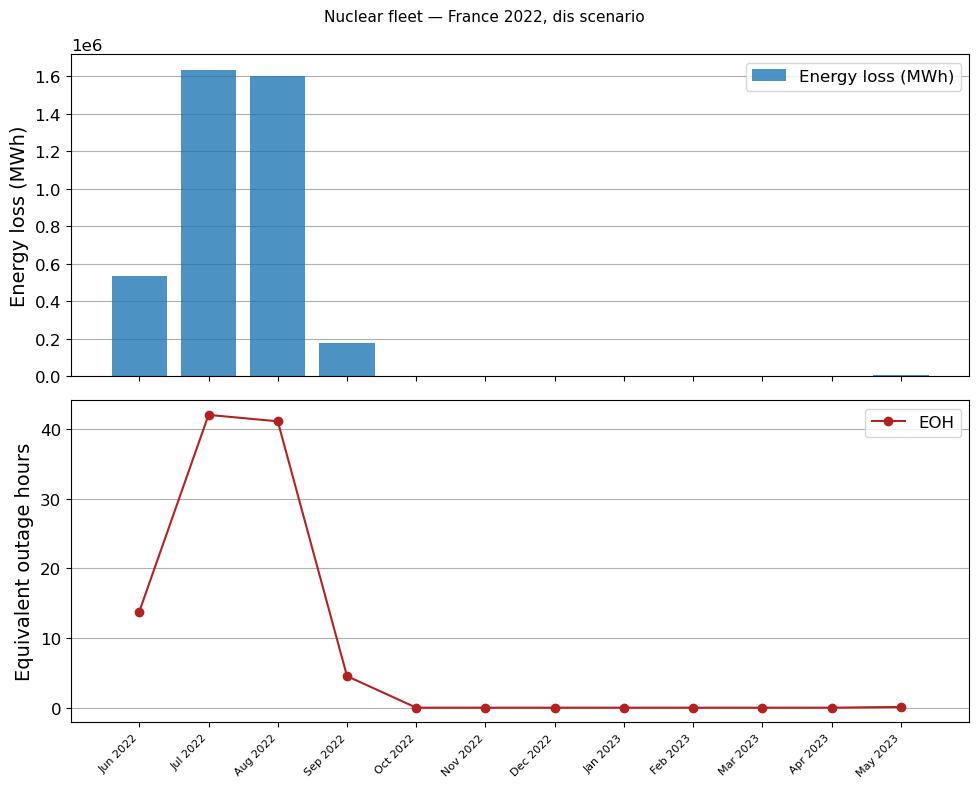

In [72]:
fig, axes = plot_fleet_metrics(
    metrics["fleet"],
    title="Nuclear fleet — France 2022, dis scenario",
)


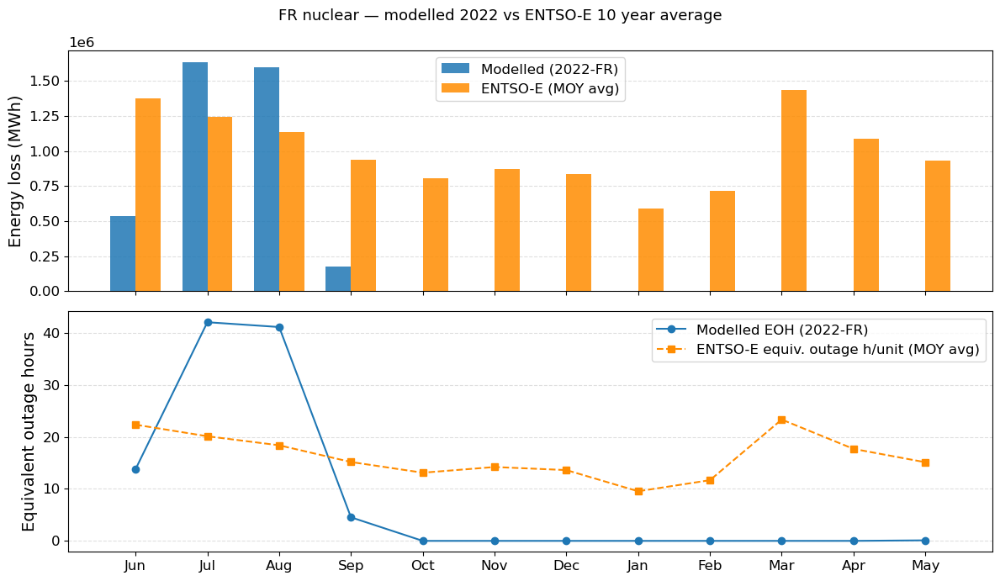

In [74]:
# ── ENTSO-E FR nuclear (month-of-year averages, multi-year) ──────────────────
_kpis_path = (
    pypsa_dmg_root
    / "Jahnke_Ardone"
    / "dataset/kpis_plant_MOY.csv"
)
_kpis = pd.read_csv(_kpis_path, sep=";")

df_entsoe = _kpis[
    (_kpis["country"] == "FR") & (_kpis["plant_type"] == "Nuclear")
].copy()
df_entsoe["month"] = df_entsoe["period_key"].astype(int)
df_entsoe = df_entsoe.sort_values("month").reset_index(drop=True)
df_entsoe["equiv_outage_h_per_unit"] = df_entsoe["wEUOR"] * (df_entsoe["D_h"] / df_entsoe["n_units"])
df_entsoe["energy_loss_mwh_total"]   = df_entsoe["equiv_outage_h_per_unit"] * df_entsoe["cap_total_MW"]

# ── Align ENTSO-E rows to fleet month order ───────────────────────────────────
fleet    = metrics["fleet"]
entsoe_m = df_entsoe.set_index("month").loc[fleet.index.month]

# ── Plot ──────────────────────────────────────────────────────────────────────
x      = np.arange(len(fleet))
w      = 0.35
labels = [t.strftime("%b") for t in fleet.index]

fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 7), sharex=True)

ax1.bar(x - w/2, fleet["energy_loss_mwh"],          width=w, color="#1f77b4",    alpha=0.85, label=f"Modelled ({CONFIG_NAME})")
ax1.bar(x + w/2, entsoe_m["energy_loss_mwh_total"], width=w, color="darkorange", alpha=0.85, label="ENTSO-E (MOY avg)")
ax1.set_ylabel("Energy loss (MWh)")
ax1.legend(); ax1.yaxis.grid(True, linestyle="--", alpha=0.4); ax1.set_axisbelow(True)

ax2.plot(x, fleet["eoh"],                        marker="o", color="#1f77b4",    label=f"Modelled EOH ({CONFIG_NAME})")
ax2.plot(x, entsoe_m["equiv_outage_h_per_unit"], marker="s", color="darkorange", label="ENTSO-E equiv. outage h/unit (MOY avg)", linestyle="--")
ax2.set_ylabel("Equivalent outage hours")
ax2.set_xticks(x); ax2.set_xticklabels(labels)
ax2.legend(); ax2.yaxis.grid(True, linestyle="--", alpha=0.4); ax2.set_axisbelow(True)

fig.suptitle(f"FR nuclear — modelled {YEAR} vs ENTSO-E 10 year average", fontsize=13)
fig.tight_layout()
plt.show()


In [75]:
metrics["by_bus"]

,eoh,energy_loss_mwh
time,,
2022-06-01,4.116159,25254.117717
2022-07-01,16.492007,101184.401863
2022-08-01,11.570775,70990.870248
2022-09-01,0.335205,2056.601234
2022-10-01,0.000000,0.000000
2022-11-01,0.000000,0.000000
2022-12-01,0.000000,0.000000
2023-01-01,0.000000,0.000000
2023-02-01,0.000000,0.000000


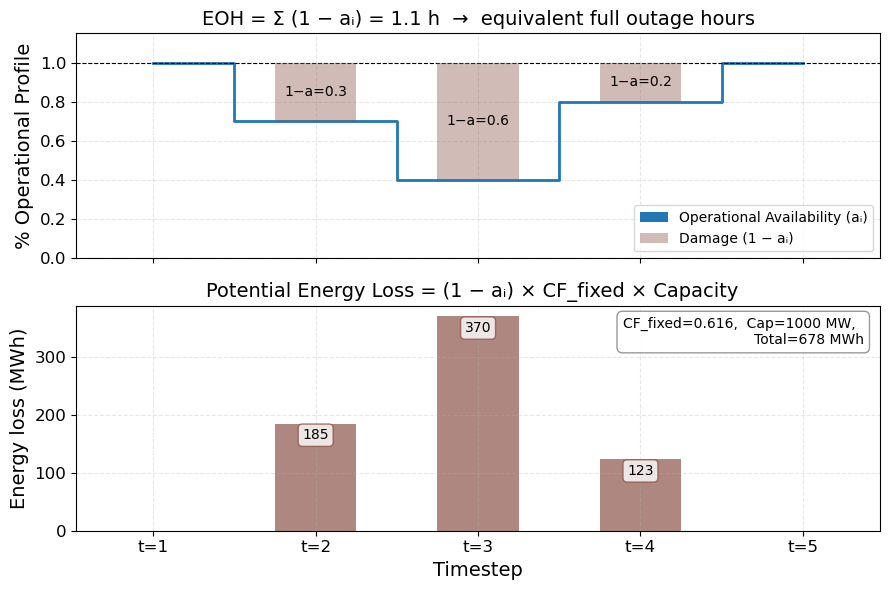

In [41]:

# --- example data ---
t        = np.arange(5)
avail    = np.array([1.0, 0.7, 0.4, 0.8, 1.0])
CF       = 0.616
CAPACITY = 1000   # MW

damage      = 1 - avail
eoh         = damage.sum()
energy_loss = damage * CF * CAPACITY

_DAMAGE_COLOR = _DAMAGE_COLORS[0]   # steel blue
_LOSS_COLOR   = _DAMAGE_COLORS[3]   # chestnut brown — warm, distinct from availability

fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(9, 6), sharex=True)

# ── Panel 1: availability + EOH shading ──────────────────────────────────────
ax1.step(t, avail, where="mid", color=_DAMAGE_SINGLE_COLOR, linewidth=2, label="Availability")
ax1.axhline(1.0, color="black", linewidth=0.8, linestyle="--", label="Full availability (1.0)")

for i in range(len(t)):
    if damage[i] > 0:
        ax1.bar(t[i], damage[i], bottom=avail[i], width=0.5,
                color=_LOSS_COLOR, alpha=0.4, zorder=2)
        ax1.text(t[i], avail[i] + damage[i] / 2,
                 f"1−a={damage[i]:.1f}", ha="center", va="center", fontsize=10)

ax1.set_ylim(0, 1.15)
ax1.set_ylabel("% Operational Profile")
ax1.set_title(f"EOH = Σ (1 − aᵢ) = {eoh:.1f} h  →  equivalent full outage hours")
ax1.legend(handles=[
    mpatches.Patch(facecolor=_DAMAGE_SINGLE_COLOR, label="Operational Availability (aᵢ)"),
    mpatches.Patch(facecolor=_LOSS_COLOR, alpha=0.4, label="Damage (1 − aᵢ)"),
], fontsize=10, loc="lower right")
ax1.grid(True, alpha=0.3, linestyle="--")

# ── Panel 2: energy loss per timestep ────────────────────────────────────────
ax2.bar(t, energy_loss, color=_LOSS_COLOR, alpha=0.7, width=0.5)
for i in range(len(t)):
    if energy_loss[i] > 0:
        ax2.text(t[i], energy_loss[i]-8, f"{energy_loss[i]:.0f}", ha="center", va= "top", fontsize=10,
                bbox=dict(boxstyle="round,pad=0.3", facecolor="white", edgecolor=_LOSS_COLOR, alpha=0.8))


ax2.set_ylabel("Energy loss (MWh)")
ax2.set_xlabel("Timestep")
ax2.set_xticks(t)
ax2.set_xticklabels([f"t={i+1}" for i in t])
ax2.set_title(
    f"Potential Energy Loss = (1 − aᵢ) × CF_fixed × Capacity  "
)
ax2.text(0.98, 0.95,
         f"CF_fixed={CF},  Cap={CAPACITY} MW,  \nTotal={energy_loss.sum():.0f} MWh",
         transform=ax2.transAxes, ha="right", va="top", fontsize=10,
         bbox=dict(boxstyle="round,pad=0.4", facecolor="white", edgecolor="grey", alpha=0.8))
ax2.grid(True, alpha=0.3, linestyle="--")

fig.tight_layout()
plt.show()


# network collection , heatmap

In [259]:
NETWORK_PATHS["dis"]

PosixPath('/home/lois/pypsa-eur/pypsa-eur/results/2022-FR/weather_year_2022_nuc_dis/networks/base_s_5_elec__damaged-dispatch.nc')

In [45]:
from plot_combo import (
    plot_combination_profile,
    format_ts_df, format_ts_diff_df,
    build_eb_diff_by_bus, build_storage_dict,
)


In [42]:
def _pivot(ts_eb, network, carrier, bus_carrier):
    mask = (
        (ts_eb["network"]     == network) &
        (ts_eb["carrier"]     == carrier) &
        (ts_eb["bus_carrier"] == bus_carrier)
    )
    return (
        ts_eb[mask]
        .pivot_table(index="snapshot", columns="bus", values="value", aggfunc="sum")
        .fillna(0)
    )

def get_soc_by_bus(n, carrier):
    store_idx = n.stores.index[n.stores.carrier == carrier]
    if not store_idx.empty:
        df = n.stores_t.e[store_idx].copy()
        df.columns = n.stores.loc[store_idx, "bus"]
        return df.T.groupby(level=0).sum().T
    su_idx = n.storage_units.index[n.storage_units.carrier == carrier]
    if not su_idx.empty:
        df = n.storage_units_t.state_of_charge[su_idx].copy()
        df.columns = n.storage_units.loc[su_idx, "bus"]
        return df.T.groupby(level=0).sum().T
    raise ValueError(f"No Store or StorageUnit found for carrier '{carrier}'")

def _fleet_price(n):
    ac     = n.buses.index[n.buses.carrier == "AC"]
    prices = n.buses_t.marginal_price[ac]
    load_w = n.loads_t.p_set.reindex(columns=ac).fillna(0)
    return (prices * load_w).sum(axis=1) / load_w.sum(axis=1).replace(0, np.nan)


def prepare_combo_data(base, scen, *, nc, scenarios):
    n_base = nc.networks[base]
    n_scen = nc.networks[scen]

    # Energy balance (computed once, shared by all _pivot calls)
    EXCLUDE = ["coal", "ocgt", "ccgt"]
    ts_eb   = format_ts_df(nc, stat="energy_balance")
    ts_eb   = ts_eb[~ts_eb["carrier"].isin(EXCLUDE)]
    ts_diff = format_ts_diff_df(nc.networks, stat="energy_balance", base=base)

    def p(network, carrier, bus_carrier):
        return _pivot(ts_eb, network, carrier, bus_carrier)

    # Load shedding
    ls_df = p(scen, "load_shedding", "AC")
    ls_df[ls_df < 0.001] = 0

    # H2 fuel cell
    fc_df      = p(scen, "H2 fuel cell", "AC")
    fc_diff_df = fc_df - p(base, "H2 fuel cell", "AC")

    # H2 electrolysis
    elec_scen_df = p(scen, "H2 electrolysis", "H2")
    elec_diff_df = elec_scen_df - p(base, "H2 electrolysis", "H2")

    # AC line flow
    line_df      = p(scen, "AC", "AC")
    line_base_df = p(base, "AC", "AC")
    line_diff_df = line_df - line_base_df

    # H2 storage
    soc_scen        = get_soc_by_bus(n_scen, "H2")
    soc_base        = get_soc_by_bus(n_base, "H2")
    soc_diff_df     = soc_scen - soc_base
    h2_e_nom_by_bus = (
        n_scen.stores[n_scen.stores.carrier == "H2"]
        .groupby("bus")["e_nom_opt"]
        .sum()
    )

    # Prices
    price_scen  = _fleet_price(n_scen)
    price_base_ = _fleet_price(n_base)
    price_fleet = price_scen.to_frame("fleet")
    price_diff  = (price_scen - price_base_).to_frame("fleet")

    # Nuclear PEL
    if scenarios is not None and scen in scenarios:
        _s = scenarios[scen]
        pel_dict_nuc = {
            "nuclear": compute_potential_energy_loss_nuclear(
                _s["damage_df"], _s["powerplants_df"], freq="h", granularity="bus",
            )
        }
    else:
        pel_dict_nuc = {}


    # Storage dict (battery + H2 via NetworkCollection)
    storage_dict = build_storage_dict(nc, scen)

    return {
        "ts_diff":         ts_diff,
        "ls_df":           ls_df,
        "fc_df":           fc_df,
        "fc_diff_df":      fc_diff_df,
        "elec_scen_df":    elec_scen_df,
        "elec_diff_df":    elec_diff_df,
        "line_df":         line_df,
        "line_base_df":    line_base_df,
        "line_diff_df":    line_diff_df,
        "soc_scen":        soc_scen,
        "soc_base":        soc_base,
        "soc_diff_df":     soc_diff_df,
        "h2_e_nom_by_bus": h2_e_nom_by_bus,
        "price_fleet":     price_fleet,
        "price_diff":      price_diff,
        "pel_dict_nuc":    pel_dict_nuc,
        "storage_dict":    storage_dict,
    }


In [304]:
ts_eb[ts_eb["carrier"].str.contains("fuel|H2", case=False)]["carrier"].unique()


array(['H2 electrolysis', 'H2 fuel cell', 'H2'], dtype=object)

In [305]:
n = networks["base"]

n.links

,bus0,bus1,type,carrier,efficiency,active,build_year,lifetime,p_nom,p_nom_mod,...,min_up_time,min_down_time,up_time_before,down_time_before,ramp_limit_up,ramp_limit_down,ramp_limit_start_up,ramp_limit_shut_down,p_nom_opt,reversed
name,,,,,,,,,,,,,,,,,,,,,
FR0 0 H2 Electrolysis,FR0 0,FR0 0 H2,,H2 electrolysis,0.6994,True,0,inf,0.0,0.0,...,0,0,1,0,NaN,NaN,1.0,1.0,1431.555363,False
FR0 1 H2 Electrolysis,FR0 1,FR0 1 H2,,H2 electrolysis,0.6994,True,0,inf,0.0,0.0,...,0,0,1,0,NaN,NaN,1.0,1.0,4089.355911,False
FR0 2 H2 Electrolysis,FR0 2,FR0 2 H2,,H2 electrolysis,0.6994,True,0,inf,0.0,0.0,...,0,0,1,0,NaN,NaN,1.0,1.0,1851.956032,False
FR0 3 H2 Electrolysis,FR0 3,FR0 3 H2,,H2 electrolysis,0.6994,True,0,inf,0.0,0.0,...,0,0,1,0,NaN,NaN,1.0,1.0,66.498241,False
FR0 4 H2 Electrolysis,FR0 4,FR0 4 H2,,H2 electrolysis,0.6994,True,0,inf,0.0,0.0,...,0,0,1,0,NaN,NaN,1.0,1.0,2880.388001,False
FR0 0 H2 Fuel Cell,FR0 0 H2,FR0 0,,H2 fuel cell,0.5000,True,0,inf,0.0,0.0,...,0,0,1,0,NaN,NaN,1.0,1.0,6903.737239,False
FR0 1 H2 Fuel Cell,FR0 1 H2,FR0 1,,H2 fuel cell,0.5000,True,0,inf,0.0,0.0,...,0,0,1,0,NaN,NaN,1.0,1.0,23896.175277,False
FR0 2 H2 Fuel Cell,FR0 2 H2,FR0 2,,H2 fuel cell,0.5000,True,0,inf,0.0,0.0,...,0,0,1,0,NaN,NaN,1.0,1.0,11728.346292,False
FR0 3 H2 Fuel Cell,FR0 3 H2,FR0 3,,H2 fuel cell,0.5000,True,0,inf,0.0,0.0,...,0,0,1,0,NaN,NaN,1.0,1.0,262.203865,False


In [306]:
n = networks["dis"]
n.links

,bus0,bus1,type,carrier,efficiency,active,build_year,lifetime,p_nom,p_nom_mod,...,min_up_time,min_down_time,up_time_before,down_time_before,ramp_limit_up,ramp_limit_down,ramp_limit_start_up,ramp_limit_shut_down,p_nom_opt,reversed
name,,,,,,,,,,,,,,,,,,,,,
FR0 0 H2 Electrolysis,FR0 0,FR0 0 H2,,H2 electrolysis,0.6994,True,0,inf,1431.555363,0.0,...,0,0,1,0,NaN,NaN,1.0,1.0,1431.555363,False
FR0 1 H2 Electrolysis,FR0 1,FR0 1 H2,,H2 electrolysis,0.6994,True,0,inf,4089.355911,0.0,...,0,0,1,0,NaN,NaN,1.0,1.0,4089.355911,False
FR0 2 H2 Electrolysis,FR0 2,FR0 2 H2,,H2 electrolysis,0.6994,True,0,inf,1851.956032,0.0,...,0,0,1,0,NaN,NaN,1.0,1.0,1851.956032,False
FR0 3 H2 Electrolysis,FR0 3,FR0 3 H2,,H2 electrolysis,0.6994,True,0,inf,66.498241,0.0,...,0,0,1,0,NaN,NaN,1.0,1.0,66.498241,False
FR0 4 H2 Electrolysis,FR0 4,FR0 4 H2,,H2 electrolysis,0.6994,True,0,inf,2880.388001,0.0,...,0,0,1,0,NaN,NaN,1.0,1.0,2880.388001,False
FR0 0 H2 Fuel Cell,FR0 0 H2,FR0 0,,H2 fuel cell,0.5000,True,0,inf,6903.737239,0.0,...,0,0,1,0,NaN,NaN,1.0,1.0,6903.737239,False
FR0 1 H2 Fuel Cell,FR0 1 H2,FR0 1,,H2 fuel cell,0.5000,True,0,inf,23896.175277,0.0,...,0,0,1,0,NaN,NaN,1.0,1.0,23896.175277,False
FR0 2 H2 Fuel Cell,FR0 2 H2,FR0 2,,H2 fuel cell,0.5000,True,0,inf,11728.346292,0.0,...,0,0,1,0,NaN,NaN,1.0,1.0,11728.346292,False
FR0 3 H2 Fuel Cell,FR0 3 H2,FR0 3,,H2 fuel cell,0.5000,True,0,inf,262.203865,0.0,...,0,0,1,0,NaN,NaN,1.0,1.0,262.203865,False


### During damage plot

In [43]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.gridspec import GridSpec, GridSpecFromSubplotSpec
from matplotlib.ticker import FuncFormatter, FixedLocator
from functools import reduce


def build_storage_dict(nc, network):
    battery = nc.storage_units_t.state_of_charge[network]
    battery.columns = battery.columns.str.rsplit(" ", n=1).str[0]  # "GB0 0"
    battery = battery.T.groupby(level=0).sum().T

    h2 = nc.stores_t.e.filter(like="H2")[network]
    h2.columns = h2.columns.str.rsplit(" ", n=1).str[0]
    h2 = h2.T.groupby(level=0).sum().T

    return {"battery": battery, "H2": h2}


def _apply_carrier_groups(data_dict: dict, carrier_groups: dict) -> dict:
    result = {}
    for label, spec in carrier_groups.items():
        carriers = [spec] if isinstance(spec, str) else spec
        parts = [data_dict[c] for c in carriers if c in data_dict]
        if parts:
            result[label] = reduce(lambda a, b: a.add(b, fill_value=0), parts)
    return result

def format_ts_df(nc, stat="energy_balance", **stat_kwargs):
    result = getattr(nc.statistics, stat)(
        groupby=["bus", "carrier", "bus_carrier"],
        groupby_time=False,
        nice_names=False,
        **stat_kwargs,
    )
    df = result.reset_index()
    meta_cols = [c for c in df.columns if not isinstance(c, pd.Timestamp)]
    ts_cols   = [c for c in df.columns if isinstance(c, pd.Timestamp)]
    df = df.melt(id_vars=meta_cols, value_vars=ts_cols, var_name="snapshot", value_name="value")
    return df

def format_ts_diff_df(networks, stat="energy_balance", base="base", **stat_kwargs):
    if base not in networks:
        raise ValueError(f"Base label {base!r} not found in networks.")
    all_dfs = []
    for label, n in networks.items():
        df = format_ts_df(n, stat=stat, **stat_kwargs)
        df["network"] = label
        all_dfs.append(df)
    combined = pd.concat(all_dfs, ignore_index=True)
    merge_keys = ["bus", "carrier", "bus_carrier", "snapshot"]
    base_vals = (
        combined[combined["network"] == base][merge_keys + ["value"]]
        .rename(columns={"value": "_base_value"})
    )
    combined = combined.merge(base_vals, on=merge_keys, how="left")
    combined["_base_value"] = combined["_base_value"].fillna(0)
    combined["value"]       = combined["value"].fillna(0)
    combined["value_diff"]  = combined["value"] - combined["_base_value"]
    combined.drop(columns="_base_value", inplace=True)
    return combined

def build_eb_diff_by_bus(
    ts_diff: pd.DataFrame,
    carrier: str,
    network: str,
) -> pd.DataFrame:
    """Pivot energy balance diff for one carrier/network to (time × bus)."""
    mask = (
        (ts_diff["carrier"] == carrier) &
        (ts_diff["network"] == network) &
        (ts_diff["bus_carrier"] == "AC")
    )
    raw = ts_diff[mask]
    return raw.pivot_table(index="snapshot", columns="bus", values="value_diff", aggfunc="sum")


def _slice_date(d: dict, date_range) -> dict:
    if date_range is None:
        return d
    s, e = date_range
    return {k: df.loc[s:e] for k, df in d.items()}


def _agg_buses(d: dict) -> dict:
    return {k: df.sum(axis=1).to_frame("fleet") for k, df in d.items()}

def _render_heatmap_row(fig, ax, label, df, norm, cmap, unit="", fontsize=9, label_gap=5):
    if df.empty:
        ax.axis("off")
    else:
        ax.imshow(df.T.values, aspect="auto", cmap=cmap,
                  interpolation="nearest", norm=norm)
        ax.set_yticks(range(len(df.columns)))
        if len(df.columns) > 1:
            ax.set_yticklabels(df.columns, fontsize=fontsize - 1)
        else:
            ax.set_yticklabels([])
        pos = ax.get_position()
        cax = fig.add_axes([0.895, pos.y0 + pos.height * 0.1, 0.015, pos.height * 0.8])
        fig.colorbar(plt.cm.ScalarMappable(cmap=cmap, norm=norm), cax=cax, label=unit)
    ax.set_ylabel("")
    ax.annotate(label, xy=(0, 0.5), xycoords="axes fraction",
                xytext=(-label_gap, 0), textcoords="offset points",
                ha="right", va="center", fontsize=fontsize, annotation_clip=False)



def _render_area_row(ax, label, df, ylim, *,
                     bus_name=None, unit="",
                     color="steelblue", neg_color="salmon", fontsize=9, label_gap=5):
    x = np.arange(len(df))
    y = df.iloc[:, 0].values
    ax.fill_between(x, y, 0, where=(y >= 0), alpha=0.7, color=color)
    ax.fill_between(x, y, 0, where=(y < 0), alpha=0.7, color=neg_color)
    ax.axhline(0, color="black", linewidth=0.5, linestyle="--")
    ax.set_ylim(ylim)

    ax.set_ylabel("")
    ax.annotate(label, xy=(0, 0.5), xycoords="axes fraction",
                xytext=(-label_gap, 0), textcoords="offset points",
                ha="right", va="center", fontsize=fontsize, annotation_clip=False)

    if bus_name is not None:
        ax.annotate(bus_name, xy=(0, 0.5), xycoords="axes fraction",
                    xytext=(-4, 0), textcoords="offset points",
                    ha="right", va="center", fontsize=fontsize - 1, clip_on=False)

    # single tick at max (and min for symmetric), minor at midpoints
    is_sym = ylim[0] < 0
    major_ticks = [ylim[1]] if is_sym else [ylim[1]]
    minor_ticks = [ylim[0] / 2, ylim[1] / 2] if is_sym else [ylim[1] / 2]

    ax.yaxis.tick_right()
    ax.set_yticks(major_ticks)
    ax.yaxis.set_major_formatter(
        FuncFormatter(lambda v, _: f"{v:.3g} {unit}" if unit else f"{v:.3g}")
    )
    ax.yaxis.set_minor_locator(FixedLocator(minor_ticks))
    ax.tick_params(axis="y", labelsize=fontsize - 2)

    ax.grid(True, axis="y", which="major", alpha=0.3, linestyle="--", linewidth=0.5)
    ax.grid(True, axis="y", which="minor", alpha=0.2, linestyle=":",  linewidth=0.4)

def plot_combination_profile(
    carrier_groups: dict,
    components: dict,
    *,
    date_range=None,
    aggregate_buses=False,
    row_height=1.5,
    fig_width=16,
    title=None,
    show_day_ticks=False,
    fontsize=9,
    label_gap=5,
):
    all_carriers = [c for v in carrier_groups.values()
                    for c in ([v] if isinstance(v, str) else v)]

    # ── Step 1: build render specs ────────────────────────────────────────────
    render_specs = []
    for comp_key, comp in components.items():
        ctype  = comp["type"]
        render = comp.get("render", "heatmap")
        cmap   = comp.get("cmap", "YlOrRd")
        sym    = comp.get("symmetric", False)
        rh     = comp.get("row_height", row_height)
        vg             = comp.get("vmax_group")
        unit           = comp.get("unit", "")
        color          = comp.get("color", "steelblue")
        neg_color      = comp.get("neg_color", "salmon")
        vmax_override  = comp.get("vmax")
        multiplier     = comp.get("multiplier", 1.0)
        data           = comp["data"]

        if ctype == "carrier_dict":
            raw     = _slice_date({k: v for k, v in data.items() if k in all_carriers}, date_range)
            grouped = _apply_carrier_groups(raw, carrier_groups)
        elif ctype == "ts_diff":
            raw     = {c: build_eb_diff_by_bus(data, c, comp["network"]) for c in all_carriers}
            raw     = _slice_date(raw, date_range)
            grouped = {k: df for k, df in _apply_carrier_groups(raw, carrier_groups).items()
                       if not df.empty}
        elif ctype == "direct":
            df      = data.loc[date_range[0]:date_range[1]] if date_range else data.copy()
            grouped = {comp_key: df}

        if multiplier != 1.0:
            grouped = {k: df * multiplier for k, df in grouped.items()}

        for group_label, df in grouped.items():
            if aggregate_buses:
                df = df.sum(axis=1).to_frame("fleet")

            row_label  = comp_key if ctype == "direct" else f"{group_label}\n{comp_key}"
            is_per_bus = (render == "area" and not aggregate_buses)

            def _resolve_vmax(vmax_spec, bus=None):
                if isinstance(vmax_spec, (dict, pd.Series)):
                    if bus is not None:
                        return vmax_spec.get(bus)
                    return sum(vmax_spec.values()) if isinstance(vmax_spec, dict) else vmax_spec.sum()
                return vmax_spec

            if not is_per_bus:
                render_specs.append(dict(
                    label=row_label, df=df, render=render,
                    cmap=cmap, symmetric=sym, row_height=rh,
                    vmax_group=vg, unit=unit, per_bus_group=None,
                    color=color, neg_color=neg_color,
                    vmax_override=_resolve_vmax(vmax_override),
                ))
            else:
                group_id = f"{comp_key}__{group_label}"
                for bus in df.columns:
                    render_specs.append(dict(
                        label=f"{row_label}\n{bus}", df=df[[bus]],
                        render="area", cmap=cmap, symmetric=sym, row_height=rh,
                        vmax_group=vg, unit=unit, per_bus_group=group_id,
                        color=color, neg_color=neg_color,
                        vmax_override=_resolve_vmax(vmax_override, bus=bus),
                    ))

    if not render_specs:
        raise ValueError("No data to plot — check carrier_groups and components.")

    # ── Step 2: vmax per group ────────────────────────────────────────────────
    vmax_by_group = {}
    for spec in render_specs:
        vg = spec["vmax_group"]
        if vg is None or spec["df"].empty:
            continue
        vmax_by_group[vg] = max(vmax_by_group.get(vg, 0), spec["df"].abs().values.max())

    def _make_norm(spec):
        vg   = spec["vmax_group"]
        vmax = spec["vmax_override"] or vmax_by_group.get(vg) if vg else spec["vmax_override"]
        if vmax is None:
            vmax = spec["df"].abs().values.max() if not spec["df"].empty else 1.0
        return plt.Normalize(-max(vmax, 1e-6), max(vmax, 1e-6)) if spec["symmetric"] \
               else plt.Normalize(0, max(vmax, 1e-6))

    for spec in render_specs:
        spec["norm"] = _make_norm(spec)

    # ── Step 3: group into layout blocks, tag with position in group ──────────
    blocks = []
    i = 0
    while i < len(render_specs):
        gid = render_specs[i]["per_bus_group"]
        if gid is None:
            blocks.append([render_specs[i]])
            i += 1
        else:
            group = []
            while i < len(render_specs) and render_specs[i]["per_bus_group"] == gid:
                group.append(render_specs[i])
                i += 1
            blocks.append(group)

    for block in blocks:
        n = len(block)
        for idx, spec in enumerate(block):
            spec["_bus_idx"]    = idx
            spec["_block_size"] = n

    # ── Step 4: build figure with nested GridSpec ─────────────────────────────
    outer_heights = [sum(s["row_height"] for s in block) for block in blocks]
    fig      = plt.figure(figsize=(fig_width, sum(outer_heights) + 1))
    outer_gs = GridSpec(len(blocks), 1, figure=fig,
                        height_ratios=outer_heights, hspace=0.35,
                        right=0.88)   # reserve right margin for colorbars


    axes     = []
    first_ax = None
    for block_idx, block in enumerate(blocks):
        if len(block) == 1:
            ax = fig.add_subplot(outer_gs[block_idx], sharex=first_ax)
            if first_ax is None:
                first_ax = ax
            axes.append(ax)
        else:
            inner_gs = GridSpecFromSubplotSpec(
                len(block), 1,
                subplot_spec=outer_gs[block_idx],
                hspace=0,
                height_ratios=[s["row_height"] for s in block],
            )
            for bus_idx in range(len(block)):
                ax = fig.add_subplot(inner_gs[bus_idx], sharex=first_ax)
                if first_ax is None:
                    first_ax = ax
                axes.append(ax)

    for ax in axes[:-1]:
        ax.tick_params(labelbottom=False)

    # ── Step 5: time axis ─────────────────────────────────────────────────────
    first_df     = next(s["df"] for s in render_specs if not s["df"].empty)
    time_index   = first_df.index
    month_ticks  = [i for i in range(len(time_index))
                    if i == 0 or time_index[i].month != time_index[i - 1].month]
    month_labels = [time_index[i].strftime("%b %Y") for i in month_ticks]
    # Monday at hour 0 only — marks the exact start of each week
    week_ticks   = [i for i in range(len(time_index))
                    if time_index[i].weekday() == 0 and time_index[i].hour == 0]
    if show_day_ticks:
        day_ticks  = [i for i in range(len(time_index))
                      if time_index[i].hour == 0]
        day_labels = [time_index[i].strftime("%-d") for i in day_ticks]

    # ── Step 6: render ────────────────────────────────────────────────────────
    for ax, spec in zip(axes, render_specs):
        vmax = spec["norm"].vmax
        ylim = (-vmax, vmax) if spec["symmetric"] else (0, vmax)

        if spec["render"] == "heatmap":
            _render_heatmap_row(fig, ax, spec["label"], spec["df"],
                                spec["norm"], spec["cmap"], spec["unit"],
                                fontsize=fontsize, label_gap=label_gap)
        elif spec["per_bus_group"] is not None:
            group_label, bus_name = spec["label"].rsplit("\n", 1)
            mid   = spec["_block_size"] // 2
            label = group_label if spec["_bus_idx"] == mid else ""
            _render_area_row(ax, label, spec["df"], ylim,
                             bus_name=bus_name, unit=spec["unit"],
                             color=spec["color"], neg_color=spec["neg_color"],
                             fontsize=fontsize, label_gap=label_gap)

        else:
            # single-row area (aggregate or non-grouped)
            _render_area_row(ax, spec["label"], spec["df"], ylim,
                             unit=spec["unit"],
                             color=spec["color"], neg_color=spec["neg_color"],
                             fontsize=fontsize, label_gap=label_gap)

    axes[-1].set_xticks(month_ticks)
    axes[-1].set_xticklabels(month_labels, rotation=45, ha="right", fontsize=fontsize - 1)
    axes[-1].set_xticks(week_ticks, minor=True)
    axes[-1].tick_params(axis="x", which="minor", length=4, width=0.8, labelbottom=False)
    if show_day_ticks:
        for pos, lbl in zip(day_ticks, day_labels):
            axes[-1].text(pos, -0.07, lbl,
                          transform=axes[-1].get_xaxis_transform(),
                          ha="center", va="top", fontsize=6, clip_on=False)
    if title:
        fig.suptitle(title, fontsize=11)

    return fig, axes

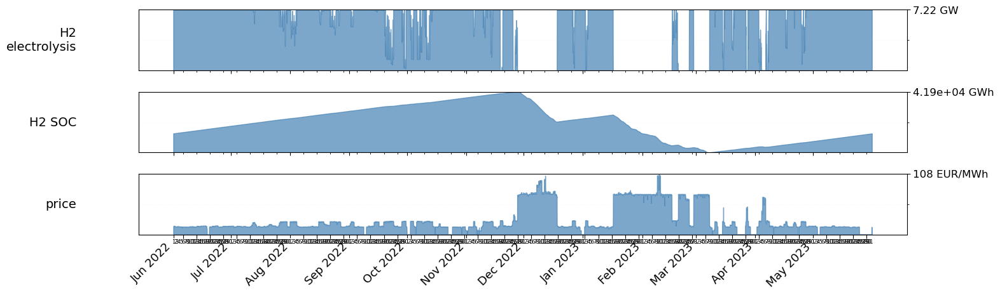

In [44]:
base = "base_dis"
scen = "base_dis"

d = prepare_combo_data(base, scen, nc=nc, scenarios=None)

fig, axes = plot_combination_profile(
    carrier_groups={"nuclear": "nuclear",
                    "biomass": "biomass",
                    "hydro": "hydro",
                    # "battery": "battery",
                    # "PHS": "PHS",
                    # "ror": "ror",
                    # "solar+wind+ror": ["solar","solar-hsat",'offwind-ac','offwind-dc','onwind', 'ror']
                    },
    components={
        # "PEL": {
        #     "type": "carrier_dict", "data": d["pel_dict_nuc"],
        #     "cmap": "YlOrRd", "multiplier": 1e-3, "unit": "GWh", "vmax_group": "nuclear",
        # },
        # "Δ": {
        #     "type": "ts_diff", "data": d["ts_diff"], "network": scen,
        #     "cmap": "RdBu", "symmetric": True, "multiplier": 1e-3, "unit": "GWh", "vmax_group": "nuclear","row_height": 1.2,
        # },
        # "load shedding": {
        #     "type": "direct", "data": d["ls_df"],
        #     "cmap": "Purples", "multiplier": 1e-3, "unit": "GWh",
        # },
        # "H2 FC": {
        #     "type": "direct", "data": d["fc_df"],
        #     "render": "area", "multiplier": 1e-3, "unit": "GW", "row_height": 0.8,
        # },
        "H2\nelectrolysis": {
            "type": "direct", "data": d["elec_scen_df"],
            "render": "area", "multiplier": 1e-3, "unit": "GW", "row_height":1.2,
        },
        # "H2\nelectrolysis Δ": {
        #     "type": "direct", "data": d["elec_diff_df"],
        #     "render": "area", "symmetric": True,
        #     "color": "steelblue", "neg_color": "salmon",
        #     "multiplier": 1e-3,"unit": "GW", "row_height": 1.2,
        # },
        "H2 SOC": {
            "type": "direct", "data": d["soc_scen"],
            "render": "area", "symmetric": False,
            "vmax": d["h2_e_nom_by_bus"]*1e-3,
            "multiplier": 1e-3,"unit": "GWh", "color": "steelblue", "row_height": 1.2,
        },
        # "H2 SOC Δ ": {
        #     "type": "direct", "data": d["soc_diff_df"],
        #     "render": "area", "symmetric": True,
        #     # "vmax": d["h2_e_nom_by_bus"],
        #     "multiplier": 1e-3,"unit": "GWh", "color": "steelblue", "neg_color": "salmon", "row_height": 1.2,
        # },
        "price": {
            "type": "direct", "data": d["price_fleet"],
            "render": "area", "unit": "EUR/MWh", "row_height": 1.2,
        },
        # "price Δ": {
        #     "type": "direct", "data": d["price_diff"],
        #     "render": "heatmap", "cmap": "RdBu_r",
        #     "symmetric": True, "unit": "EUR/MWh", "row_height": 1.2,
        # },
    },
    aggregate_buses=True,
    date_range=(f"{YEAR}-06-01", f"{YEAR+1}-05-31"),
    show_day_ticks=True,
    title=None,
    fontsize=14,   # component names = 11, bus labels = 10, x ticks = 10, y ticks = 9
    label_gap=70,
    # fig_width= 25
)

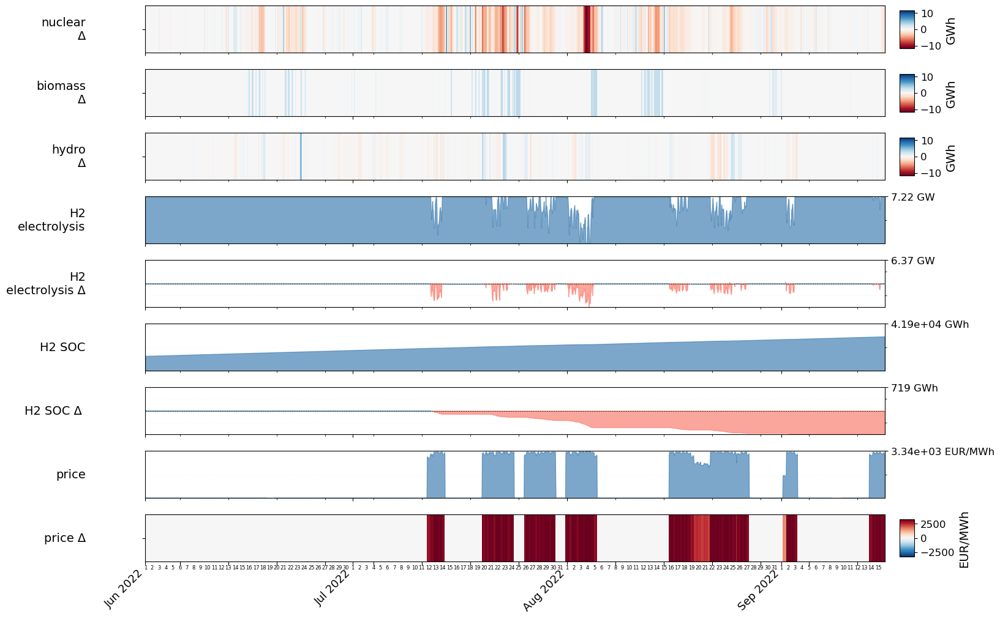

In [95]:
base = "base_dis"
scen = "dis"

d = prepare_combo_data(base, scen, nc=nc, scenarios=scenarios)

fig, axes = plot_combination_profile(
    carrier_groups={"nuclear": "nuclear",
                    "biomass": "biomass",
                    "hydro": "hydro",
                    # "battery": "battery",
                    # "PHS": "PHS",
                    # "ror": "ror",
                    # "solar+wind+ror": ["solar","solar-hsat",'offwind-ac','offwind-dc','onwind', 'ror']
                    },
    components={
        # "PEL": {
        #     "type": "carrier_dict", "data": d["pel_dict_nuc"],
        #     "cmap": "YlOrRd", "multiplier": 1e-3, "unit": "GWh", "vmax_group": "nuclear",
        # },
        "Δ": {
            "type": "ts_diff", "data": d["ts_diff"], "network": scen,
            "cmap": "RdBu", "symmetric": True, "multiplier": 1e-3, "unit": "GWh", "vmax_group": "nuclear","row_height": 1.2,
        },
        # "load shedding": {
        #     "type": "direct", "data": d["ls_df"],
        #     "cmap": "Purples", "multiplier": 1e-3, "unit": "GWh",
        # },
        # "H2 FC": {
        #     "type": "direct", "data": d["fc_df"],
        #     "render": "area", "multiplier": 1e-3, "unit": "GW", "row_height": 0.8,
        # },
        "H2\nelectrolysis": {
            "type": "direct", "data": d["elec_scen_df"],
            "render": "area", "multiplier": 1e-3, "unit": "GW", "row_height":1.2,
        },
        "H2\nelectrolysis Δ": {
            "type": "direct", "data": d["elec_diff_df"],
            "render": "area", "symmetric": True,
            "color": "steelblue", "neg_color": "salmon",
            "multiplier": 1e-3,"unit": "GW", "row_height": 1.2,
        },
        "H2 SOC": {
            "type": "direct", "data": d["soc_scen"],
            "render": "area", "symmetric": False,
            "vmax": d["h2_e_nom_by_bus"]*1e-3,
            "multiplier": 1e-3,"unit": "GWh", "color": "steelblue", "row_height": 1.2,
        },
        "H2 SOC Δ ": {
            "type": "direct", "data": d["soc_diff_df"],
            "render": "area", "symmetric": True,
            # "vmax": d["h2_e_nom_by_bus"],
            "multiplier": 1e-3,"unit": "GWh", "color": "steelblue", "neg_color": "salmon", "row_height": 1.2,
        },
        "price": {
            "type": "direct", "data": d["price_fleet"],
            "render": "area", "unit": "EUR/MWh", "row_height": 1.2,
        },
        "price Δ": {
            "type": "direct", "data": d["price_diff"],
            "render": "heatmap", "cmap": "RdBu_r",
            "symmetric": True, "unit": "EUR/MWh", "row_height": 1.2,
        },
    },
    aggregate_buses=True,
    date_range=(f"{YEAR}-06-01", f"{YEAR}-09-15"),
    show_day_ticks=True,
    title=None,
    fontsize=14,   # component names = 11, bus labels = 10, x ticks = 10, y ticks = 9
    label_gap=70,
    # fig_width= 25
)

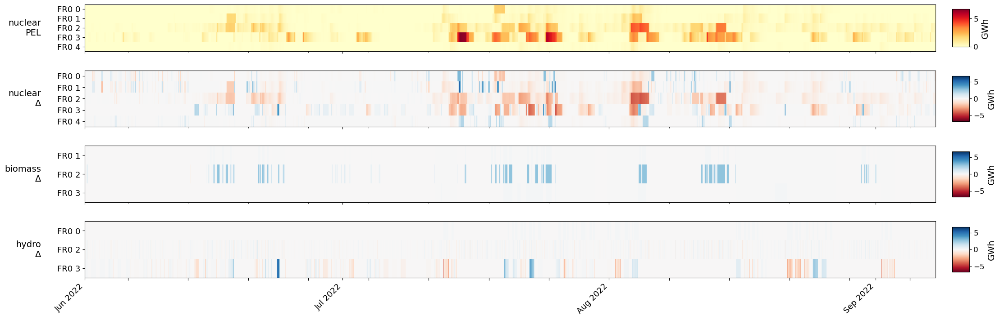

In [97]:
base = "base"
scen = "dis"

d = prepare_combo_data(base, scen, nc=nc, scenarios=scenarios)

fig, axes = plot_combination_profile(
    carrier_groups={"nuclear": "nuclear",
                    "biomass": "biomass",
                    "hydro": "hydro",
                    # "battery": "battery",
                    # "PHS": "PHS",
                    # "ror": "ror",
                    # "solar+wind+ror": ["solar","solar-hsat",'offwind-ac','offwind-dc','onwind', 'ror']
                    },
        components={
            "PEL": {
                "type": "carrier_dict", "data": d["pel_dict_nuc"],
                "cmap": "YlOrRd", "multiplier": 1e-3, "unit": "GWh", "vmax_group": "nuclear",
            },
            "Δ": {
                "type": "ts_diff", "data": d["ts_diff"], "network": scen,
                "cmap": "RdBu", "symmetric": True, "multiplier": 1e-3, "unit": "GWh", "vmax_group": "nuclear", "row_height": 1.8,
            },
            # "load shedding": {
            #     "type": "direct", "data": d["ls_df"],
            #     "cmap": "Purples", "multiplier": 1e-3, "unit": "GWh",
            # },
            # "H2 FC": {
            #     "type": "direct", "data": d["fc_df"],
            #     "render": "area", "multiplier": 1e-3, "unit": "GW", "row_height": 0.8,
            # },
            # "H2\nelectrolysis": {
            #     "type": "direct", "data": d["elec_scen_df"],
            #     "render": "area", "multiplier": 1e-3, "unit": "GW", "row_height": 0.8,
            # },
            # "H2 elec diff": {
            #     "type": "direct", "data": d["elec_diff_df"],
            #     "render": "area", "symmetric": True,
            #     "color": "steelblue", "neg_color": "salmon",
            #     "multiplier": 1e-3, "unit": "GWh", "row_height": 0.6,
            # },
            # "H2 SOC": {
            #     "type": "direct", "data": d["soc_scen"],
            #     "render": "area", "symmetric": False,
            #     "vmax": d["h2_e_nom_by_bus"] * 1e-3,
            #     "multiplier": 1e-3, "unit": "GWh", "color": "steelblue", "row_height": 0.6,
            # },
            # "H2 SOC Δ": {
            #     "type": "direct", "data": d["soc_diff_df"],
            #     "render": "area", "symmetric": True,
            #     "multiplier": 1e-3, "unit": "GWh", "color": "steelblue", "neg_color": "salmon", "row_height": 1.2,
            # },
            # "price": {
            #     "type": "direct", "data": d["price_fleet"],
            #     "render": "area", "unit": "EUR/MWh", "row_height": 0.6,
            # },
            # "price Δ": {
            #     "type": "direct", "data": d["price_diff"],
            #     "render": "heatmap", "cmap": "RdBu_r",
            #     "symmetric": True, "unit": "EUR/MWh", "row_height": 1.2,
            # },
    },
    aggregate_buses=False,
    date_range=(f"{YEAR}-06-01", f"{YEAR}-09-07"),
    title=None,
    fontsize=14,   # component names = 11, bus labels = 10, x ticks = 10, y ticks = 9
    label_gap=70,
    fig_width= 25
)

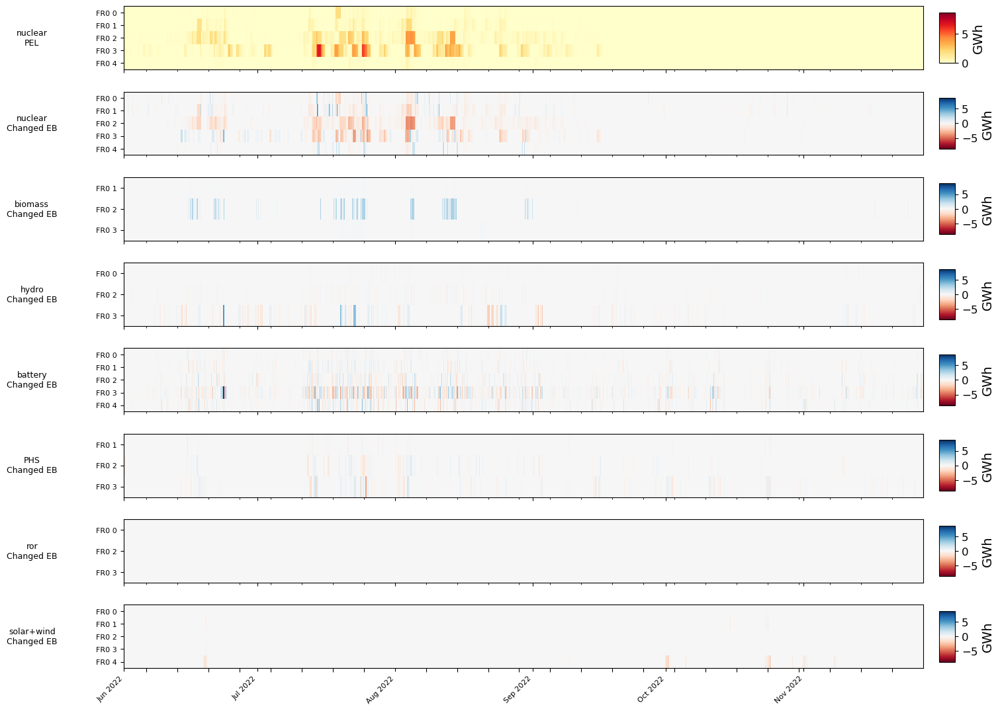

In [87]:
#Nuclear damage, change in dispatch, load shedding, H2 storage — France {YEAR}
base = "base"
scen = "dis"

d = prepare_combo_data(base, scen, nc=nc, scenarios=scenarios)

fig, axes = plot_combination_profile(
    carrier_groups={"nuclear": "nuclear",
                    "biomass": "biomass",
                    "hydro": "hydro",
                    "battery": "battery",
                    "PHS": "PHS",
                    "ror": "ror",
                    "solar+wind": ["solar","solar-hsat",'offwind-ac','offwind-dc','onwind']
                    },
    components={
        "PEL": {
            "type": "carrier_dict", "data": d["pel_dict_nuc"],
            "cmap": "YlOrRd", "multiplier": 1e-3, "unit": "GWh", "vmax_group": "nuclear",
        },
        "Changed EB": {
            "type": "ts_diff", "data": d["ts_diff"], "network": scen,
            "cmap": "RdBu", "symmetric": True, "multiplier": 1e-3, "unit": "GWh", "vmax_group": "nuclear",
        },
        # "load shedding": {
        #     "type": "direct", "data": d["ls_df"],
        #     "cmap": "Purples", "unit": "MWh",
        # },
        # "H2 FC": {
        #     "type": "direct", "data": d["fc_df"],
        #     "render": "area", "unit": "MW", "row_height": 0.6,
        # },
        # "H2 elec ": {
        #     "type": "direct", "data": d["elec_scen_df"],
        #     "render": "area", "unit": "MW", "row_height": 0.6,
        # },
        # "H2 elec base": {
        #     "type": "direct", "data": d["elec_base_df"],  # not returned — add to prepare_combo_data if needed
        #     "render": "area", "unit": "MW", "row_height": 0.6,
        # },
        # "H2 SOC": {
        #     "type": "direct", "data": d["soc_scen"],
        #     "render": "area", "symmetric": False,
        #     "vmax": d["h2_e_nom_by_bus"],
        #     "unit": "MWh", "color": "steelblue", "row_height": 0.8,
        # },
        # "H2 SOC diff": {
        #     "type": "direct", "data": d["soc_diff_df"],
        #     "render": "area", "symmetric": True,
        #     "color": "steelblue", "neg_color": "salmon",
        #     "unit": "MWh", "row_height": 0.6,
        # },
        # "price": {
        #     "type": "direct", "data": d["price_fleet"],
        #     "render": "area", "unit": "EUR/MWh", "row_height": 0.8,
        # },
        # "price diff": {
        #     "type": "direct", "data": d["price_diff"],
        #     "render": "heatmap", "cmap": "YlOrRd",
        #     "unit": "EUR/MWh", "row_height": 0.8,
        # },
    },
    aggregate_buses=False,
    date_range=(f"{YEAR}-06-01", f"{YEAR}-11-27"),
    title=f"",
    # fontsize=11,   # component names = 11, bus labels = 10, x ticks = 10, y ticks = 9

)


In [269]:
10000*eta_elec*eta_fc

np.float64(3497.0)

<Axes: xlabel='snapshot'>

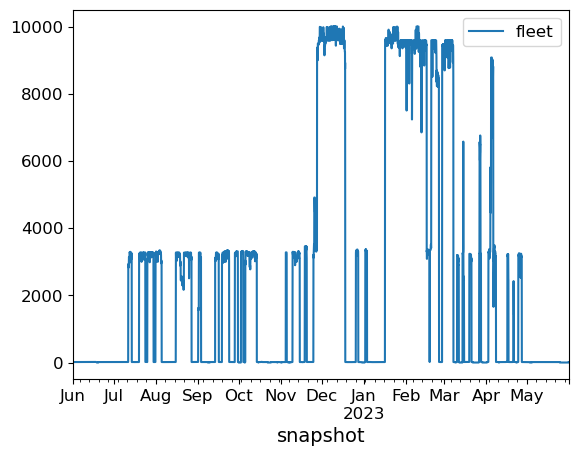

In [266]:
d["price_fleet"].plot()

### During Load shedding plot

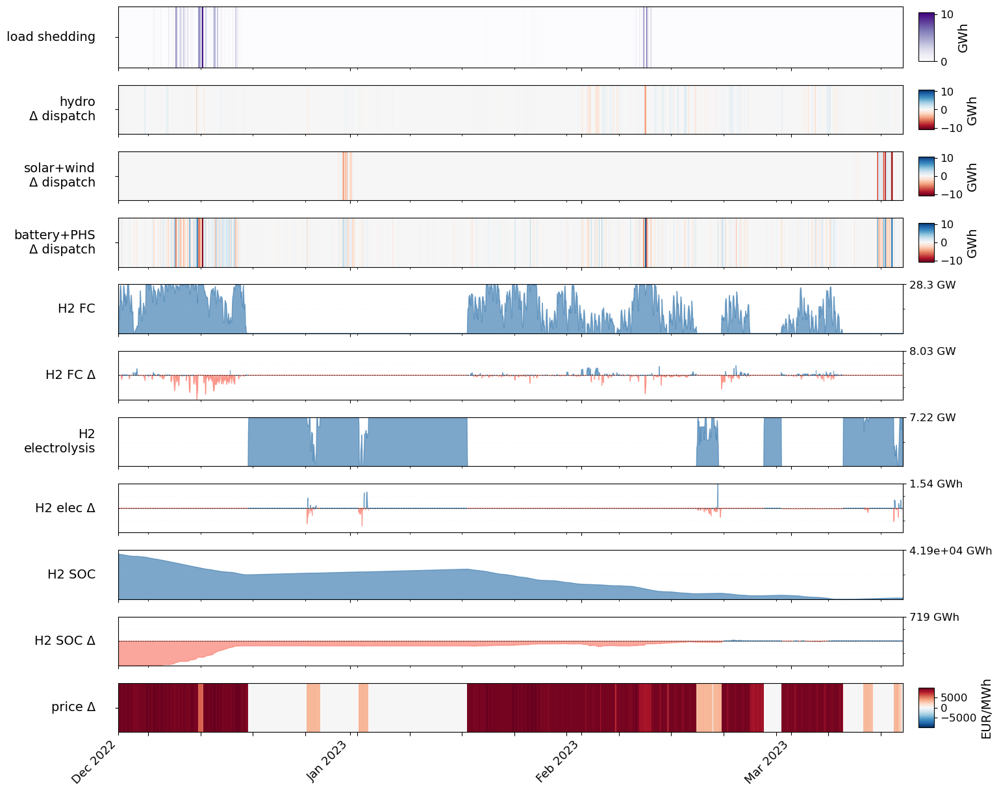

In [115]:
base = "base"
scen = "dis"

d = prepare_combo_data(base, scen, nc=nc, scenarios=scenarios)

fig, axes = plot_combination_profile(
    carrier_groups={
                    # "All Generators": ["nuclear", "biomass", "hydro", "ror", "solar", "solar-hsat", "offwind-ac", "offwind-dc", "onwind"],
                    # "nuclear": "nuclear",
                    # "biomass": "biomass",
                    "hydro": "hydro",
                    # "battery": "battery",
                    # "PHS": "PHS",
                    # "ror": "ror",
                    "solar+wind": ["solar","solar-hsat",'offwind-ac','offwind-dc','onwind'],
                    "battery+PHS": ["battery", "PHS"],
                    },
        components={
            # "PEL": {
            #     "type": "carrier_dict", "data": d["pel_dict_nuc"],
            #     "cmap": "YlOrRd", "multiplier": 1e-3, "unit": "GWh", "vmax_group": "nuclear",
            # },
            "load shedding": {
                "type": "direct", "data": d["ls_df"],
                "cmap": "Purples", "multiplier": 1e-3, "unit": "GWh",
            },
            "Δ dispatch": {
                "type": "ts_diff", "data": d["ts_diff"], "network": scen,
                "cmap": "RdBu", "symmetric": True, "multiplier": 1e-3, "unit": "GWh", "vmax_group": "nuclear", "row_height": 1.2,
            },
            "H2 FC": {
                "type": "direct", "data": d["fc_df"],
                "render": "area", "multiplier": 1e-3, "unit": "GW", "row_height": 1.2,
            },
            "H2 FC Δ": {
                "type": "direct", "data": d["fc_diff_df"],
                "render": "area", "symmetric": True,
                "color": "steelblue", "neg_color": "salmon",
                "multiplier": 1e-3, "unit": "GW", "row_height": 1.2,
            },
            "H2\nelectrolysis": {
                "type": "direct", "data": d["elec_scen_df"],
                "render": "area", "multiplier": 1e-3, "unit": "GW", "row_height": 1.2,
            },
            "H2 elec Δ": {
                "type": "direct", "data": d["elec_diff_df"],
                "render": "area", "symmetric": True,
                "color": "steelblue", "neg_color": "salmon",
                "multiplier": 1e-3, "unit": "GWh", "row_height": 1.2,
            },
            "H2 SOC": {
                "type": "direct", "data": d["soc_scen"],
                "render": "area", "symmetric": False,
                "vmax": d["h2_e_nom_by_bus"] * 1e-3,
                "multiplier": 1e-3, "unit": "GWh", "color": "steelblue", "row_height": 1.2,
            },
            "H2 SOC Δ": {
                "type": "direct", "data": d["soc_diff_df"],
                "render": "area", "symmetric": True,
                "multiplier": 1e-3, "unit": "GWh", "color": "steelblue", "neg_color": "salmon", "row_height": 1.2,
            },
            # "price": {
            #     "type": "direct", "data": d["price_fleet"],
            #     "render": "area", "unit": "EUR/MWh", "row_height": 0.6,
            # },
            "price Δ": {
                "type": "direct", "data": d["price_diff"],
                "render": "heatmap", "cmap": "RdBu_r",
                "symmetric": True, "unit": "EUR/MWh", "row_height": 1.2,
        },
    },
    aggregate_buses=True,
    date_range=(f"{YEAR}-12-01", f"{YEAR+1}-03-15"),
    title=None,
    fontsize=14,   # component names = 11, bus labels = 10, x ticks = 10, y ticks = 9
    label_gap=25,
    # fig_width= 25
)

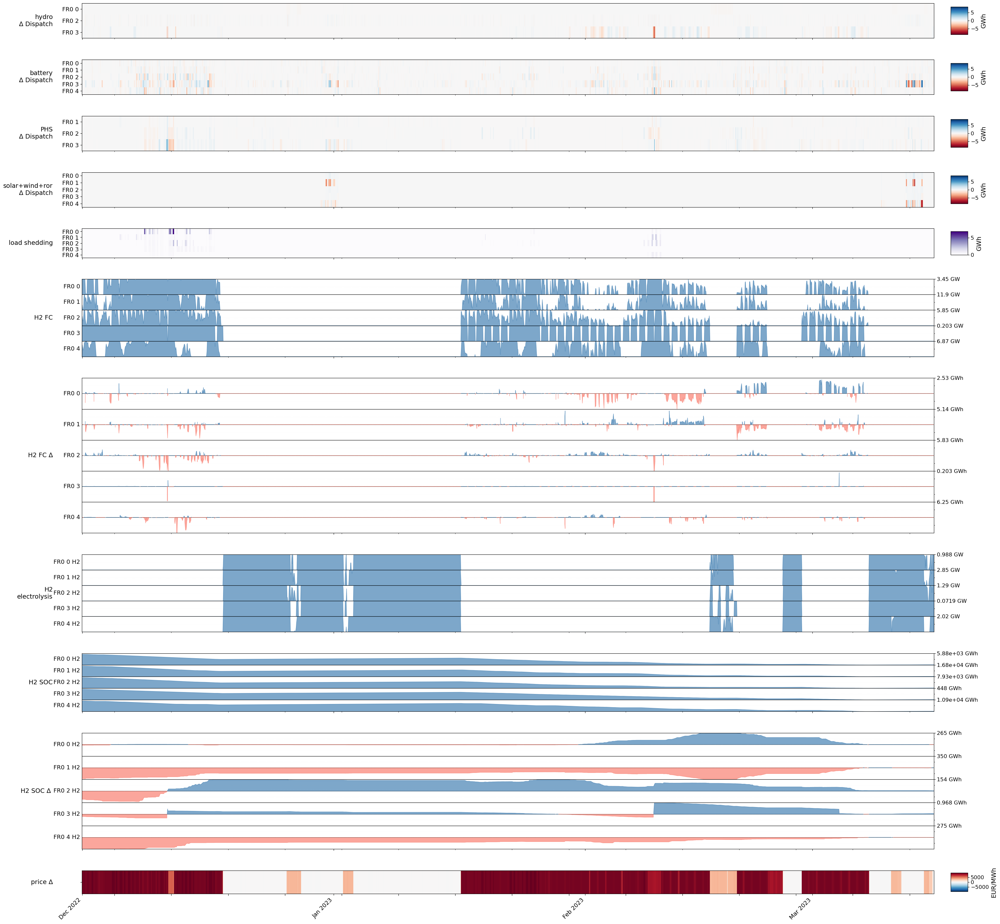

In [103]:
base = "base"
scen = "dis"

d = prepare_combo_data(base, scen, nc=nc, scenarios=scenarios)

fig, axes = plot_combination_profile(
    carrier_groups={
                    # "All Generators": ["nuclear", "biomass", "hydro", "ror", "solar", "solar-hsat", "offwind-ac", "offwind-dc", "onwind"],
                    # "nuclear": "nuclear",
                    # "biomass": "biomass",
                    "hydro": "hydro",
                    "battery": "battery",
                    "PHS": "PHS",
                    # "ror": "ror",
                    "solar+wind+ror": ["solar","solar-hsat",'offwind-ac','offwind-dc','onwind', 'ror']
                    },
    components={
        "Δ Dispatch": {
            "type": "ts_diff", "data": d["ts_diff"], "network": scen,
            "cmap": "RdBu", "symmetric": True, "multiplier": 1e-3, "unit": "GWh", "vmax_group": "nuclear", "row_height": 1.8,
        },
        "load shedding": {
            "type": "direct", "data": d["ls_df"],
            "cmap": "Purples", "multiplier": 1e-3, "unit": "GWh",
        },
        "H2 FC": {
            "type": "direct", "data": d["fc_df"],
            "render": "area", "multiplier": 1e-3, "unit": "GW", "row_height": 0.8,
        },
        "H2 FC Δ": {
            "type": "direct", "data": d["fc_diff_df"],
            "render": "area", "symmetric": True,
            "color": "steelblue", "neg_color": "salmon",
            "multiplier": 1e-3, "unit": "GWh", "row_height": 1.6,
        },
        "H2\nelectrolysis": {
            "type": "direct", "data": d["elec_scen_df"],
            "render": "area", "multiplier": 1e-3, "unit": "GW", "row_height": 0.8,
        },
        "H2 SOC": {
            "type": "direct", "data": d["soc_scen"],
            "render": "area", "symmetric": False,
            "vmax": d["h2_e_nom_by_bus"] * 1e-3,
            "multiplier": 1e-3, "unit": "GWh", "color": "steelblue", "row_height": 0.6,
        },
        "H2 SOC Δ ": {
            "type": "direct", "data": d["soc_diff_df"],
            "render": "area", "symmetric": True,
            "multiplier": 1e-3, "unit": "GWh", "color": "steelblue", "neg_color": "salmon", "row_height": 1.2,
        },
        "price Δ": {
            "type": "direct", "data": d["price_diff"],
            "render": "heatmap", "cmap": "RdBu_r",
            "symmetric": True, "unit": "EUR/MWh", "row_height": 1.2,
        },
    },
    aggregate_buses=False,
    date_range=(f"{YEAR}-12-01", f"{YEAR+1}-03-15"),
    title=None,
    fontsize=14,   # component names = 11, bus labels = 10, x ticks = 10, y ticks = 9
    label_gap=65,
    fig_width= 35
)

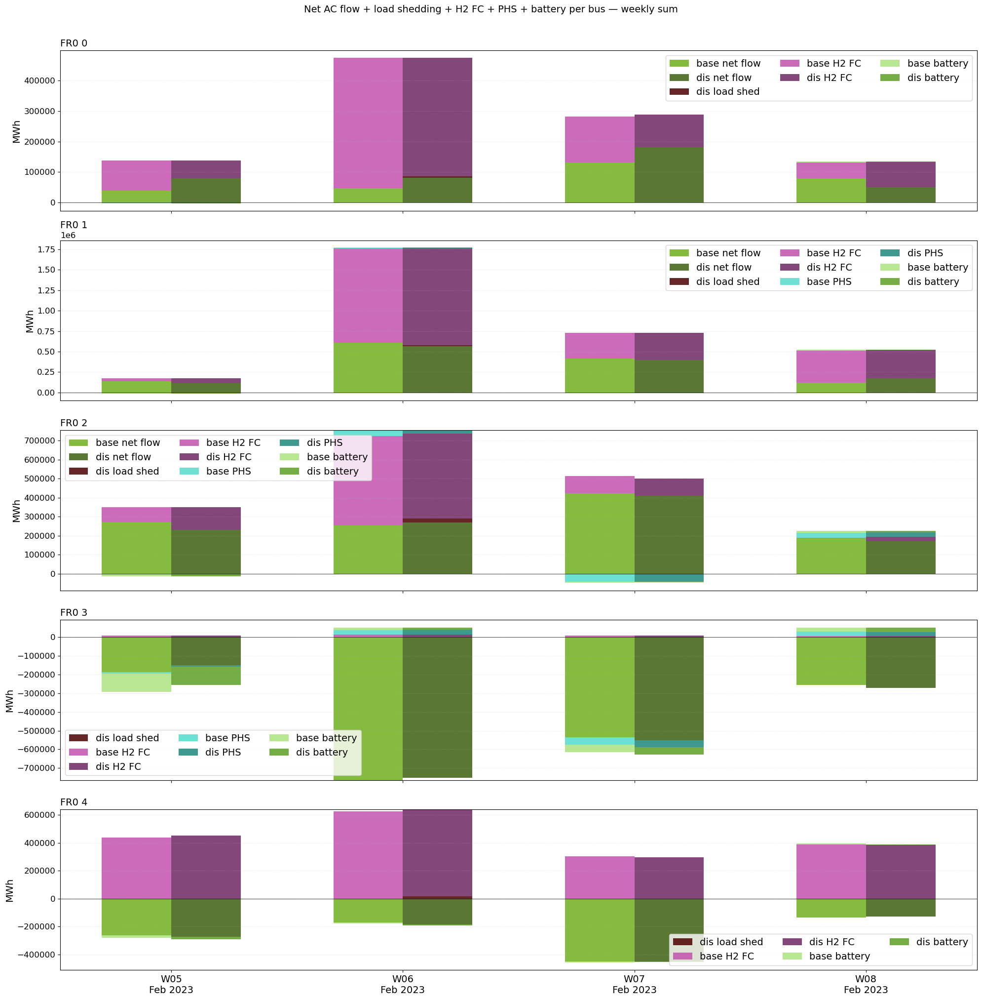

In [81]:
from styles import _darken_hex
import matplotlib.colors as mcolors

def _load_shedding_weekly(n, date_start, date_end):
    shed_gens = n.generators[n.generators.carrier.str.lower().str.contains("load")].index
    if shed_gens.empty:
        return pd.DataFrame()
    p = n.generators_t.p[shed_gens].loc[date_start:date_end]
    p = p.rename(columns=n.generators.loc[shed_gens, "bus"].to_dict())
    return p.T.groupby(level=0).sum().T.resample("W").sum()

def _h2fc_weekly(n, date_start, date_end):
    fc_links = n.links[n.links.carrier == "H2 fuel cell"].index
    if fc_links.empty:
        return pd.DataFrame()
    p = -n.links_t.p1[fc_links].loc[date_start:date_end]
    p = p.rename(columns=n.links.loc[fc_links, "bus1"].to_dict())
    return p.T.groupby(level=0).sum().T.resample("W").sum()

def _phs_weekly(n, date_start, date_end):
    phs_sus = n.storage_units[n.storage_units.carrier == "PHS"].index
    if phs_sus.empty:
        return pd.DataFrame()
    p = n.storage_units_t.p[phs_sus].loc[date_start:date_end]
    p = p.rename(columns=n.storage_units.loc[phs_sus, "bus"].to_dict())
    return p.T.groupby(level=0).sum().T.resample("W").sum()

def _battery_weekly(n, date_start, date_end):
    bat_sus = n.storage_units[n.storage_units.carrier == "battery"].index
    if bat_sus.empty:
        return pd.DataFrame()
    p = n.storage_units_t.p[bat_sus].loc[date_start:date_end]
    p = p.rename(columns=n.storage_units.loc[bat_sus, "bus"].to_dict())
    return p.T.groupby(level=0).sum().T.resample("W").sum()

def _get(df, bus):
    return df[bus].values if (not df.empty and bus in df.columns) else np.zeros(n_weeks)

# ── Colors ────────────────────────────────────────────────────────────────────
_cc = nc.networks[scen].carriers.color.replace("", None).dropna().to_dict()
_fallbacks = {
    "AC":            "#999999",
    "load_shedding": "#d62728",
    "H2 fuel cell":  "#17becf",
    "PHS":           "#51dbcc",
    "battery":       "#ff7f0e",
}
def _c(carrier):
    raw = _cc.get(carrier, _fallbacks.get(carrier, "#aaaaaa"))
    return mcolors.to_hex(raw)

COLORS = {
    carrier: (_c(carrier), _darken_hex(_c(carrier)))
    for carrier in ["AC", "load_shedding", "H2 fuel cell", "PHS", "battery"]
}

# ── Data ──────────────────────────────────────────────────────────────────────
line_df      = d["line_df"]
line_base_df = d["line_base_df"]

# date_start = "2022-12-01"
# date_end   = "2022-12-22"
date_start = "2023-02-01"
date_end   = "2023-02-22"

line_weekly_base = line_base_df.loc[date_start:date_end].resample("W").sum()
line_weekly_scen = line_df.loc[date_start:date_end].resample("W").sum()
shed_weekly_base = _load_shedding_weekly(nc.networks[base], date_start, date_end)
shed_weekly_scen = _load_shedding_weekly(nc.networks[scen], date_start, date_end)
h2fc_weekly_base = _h2fc_weekly(nc.networks[base], date_start, date_end)
h2fc_weekly_scen = _h2fc_weekly(nc.networks[scen], date_start, date_end)
phs_weekly_base  = _phs_weekly(nc.networks[base],  date_start, date_end)
phs_weekly_scen  = _phs_weekly(nc.networks[scen],  date_start, date_end)
bat_weekly_base  = _battery_weekly(nc.networks[base], date_start, date_end)
bat_weekly_scen  = _battery_weekly(nc.networks[scen], date_start, date_end)

# ── Plot ──────────────────────────────────────────────────────────────────────
buses   = line_df.columns.tolist()
n_weeks = len(line_weekly_scen)
x       = np.arange(n_weeks)
width   = 0.3

fig, axes = plt.subplots(len(buses), 1, figsize=(20, 4 * len(buses)), sharex=True)
if len(buses) == 1:
    axes = [axes]

LAYERS = [
    ("AC",            "net flow", line_weekly_base, line_weekly_scen),
    ("load_shedding", "load shed", shed_weekly_base, shed_weekly_scen),
    ("H2 fuel cell",  "H2 FC",    h2fc_weekly_base, h2fc_weekly_scen),
    ("PHS",           "PHS",      phs_weekly_base,  phs_weekly_scen),
    ("battery",       "battery",  bat_weekly_base,  bat_weekly_scen),
]

for ax, bus in zip(axes, buses):
    pb = np.zeros(n_weeks); nb = np.zeros(n_weeks)
    ps = np.zeros(n_weeks); ns = np.zeros(n_weeks)

    for carrier, label, base_df, scen_df in LAYERS:
        c, cd = COLORS[carrier]
        vb = _get(base_df, bus)
        vs = _get(scen_df, bus)

        vb_pos = np.where(vb > 0, vb, 0); vb_neg = np.where(vb < 0, vb, 0)
        vs_pos = np.where(vs > 0, vs, 0); vs_neg = np.where(vs < 0, vs, 0)

        if vb_pos.any():
            ax.bar(x - width/2, vb_pos, width, color=c,  alpha=0.85, bottom=pb, label=f"{base} {label}")
        if vb_neg.any():
            ax.bar(x - width/2, vb_neg, width, color=c,  alpha=0.85, bottom=nb)
        pb += vb_pos; nb += vb_neg

        if vs_pos.any():
            ax.bar(x + width/2, vs_pos, width, color=cd, alpha=0.85, bottom=ps, label=f"{scen} {label}")
        if vs_neg.any():
            ax.bar(x + width/2, vs_neg, width, color=cd, alpha=0.85, bottom=ns)
        ps += vs_pos; ns += vs_neg

    ax.axhline(0, color="k", linewidth=0.5)
    ax.set_title(bus, fontsize=14, loc="left")
    ax.set_ylabel("MWh")
    ax.legend(fontsize=14, ncol=3)
    ax.grid(True, axis="y", alpha=0.3, linestyle="--", linewidth=0.5)

week_labels = [t.strftime("W%V\n%b %Y") for t in line_weekly_scen.index]
axes[-1].set_xticks(x)
axes[-1].set_xticklabels(week_labels, fontsize=14)
fig.suptitle("Net AC flow + load shedding + H2 FC + PHS + battery per bus — weekly sum", fontsize=14, y=1.01)
plt.tight_layout()
plt.show()


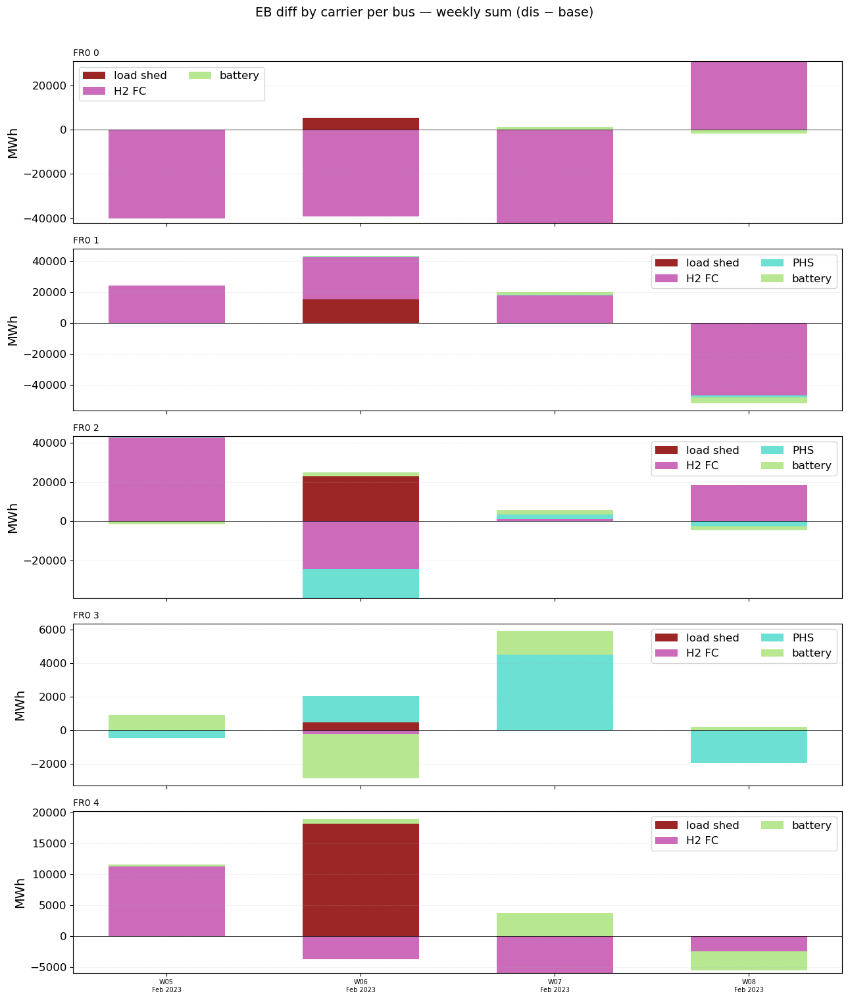

In [80]:
def _phs_weekly(n, date_start, date_end):
    phs_sus = n.storage_units[n.storage_units.carrier == "PHS"].index
    if phs_sus.empty:
        return pd.DataFrame()
    p = n.storage_units_t.p[phs_sus].loc[date_start:date_end]
    p = p.rename(columns=n.storage_units.loc[phs_sus, "bus"].to_dict())
    return p.T.groupby(level=0).sum().T.resample("W").sum()

COLORS["PHS"] = (_c("PHS"), _darken_hex(_c("PHS")))

date_start = "2023-02-01"
date_end   = "2023-02-22"

shed_diff = (
    _load_shedding_weekly(nc.networks[scen], date_start, date_end)
    .sub(_load_shedding_weekly(nc.networks[base], date_start, date_end), fill_value=0)
)
h2fc_diff = (
    _h2fc_weekly(nc.networks[scen], date_start, date_end)
    .sub(_h2fc_weekly(nc.networks[base], date_start, date_end), fill_value=0)
)
phs_diff = (
    _phs_weekly(nc.networks[scen], date_start, date_end)
    .sub(_phs_weekly(nc.networks[base], date_start, date_end), fill_value=0)
)
bat_diff = (
    _battery_weekly(nc.networks[scen], date_start, date_end)
    .sub(_battery_weekly(nc.networks[base], date_start, date_end), fill_value=0)
)

LAYERS = [
    ("load_shedding", "load shed", shed_diff),
    ("H2 fuel cell",  "H2 FC",    h2fc_diff),
    ("PHS",           "PHS",      phs_diff),
    ("battery",       "battery",  bat_diff),
]

buses   = line_df.columns.tolist()
n_weeks = len(bat_diff) if not bat_diff.empty else len(h2fc_diff)
x       = np.arange(n_weeks)
width   = 0.6

fig, axes = plt.subplots(len(buses), 1, figsize=(13, 3 * len(buses)), sharex=True)
if len(buses) == 1:
    axes = [axes]

for ax, bus in zip(axes, buses):
    pos_bottom = np.zeros(n_weeks)
    neg_bottom = np.zeros(n_weeks)

    for carrier, label, diff_df in LAYERS:
        if diff_df.empty or bus not in diff_df.columns:
            vals = np.zeros(n_weeks)
        else:
            vals = diff_df[bus].reindex(diff_df.index).values
        color = COLORS[carrier][0]
        pos_vals = np.where(vals > 0, vals, 0)
        neg_vals = np.where(vals < 0, vals, 0)
        if pos_vals.any():
            ax.bar(x, pos_vals, width, bottom=pos_bottom, color=color, alpha=0.85, label=label)
            pos_bottom += pos_vals
        if neg_vals.any():
            ax.bar(x, neg_vals, width, bottom=neg_bottom, color=color, alpha=0.85)
            neg_bottom += neg_vals

    ax.axhline(0, color="k", linewidth=0.5)
    ax.set_title(bus, fontsize=10, loc="left")
    ax.set_ylabel("MWh")
    ax.legend(fontsize=12, ncol=2)
    ax.grid(True, axis="y", alpha=0.3, linestyle="--", linewidth=0.5)

ref_index = next(df.index for _, _, df in LAYERS if not df.empty)
week_labels = [t.strftime("W%V\n%b %Y") for t in ref_index]
axes[-1].set_xticks(x)
axes[-1].set_xticklabels(week_labels, fontsize=7)
fig.suptitle(f"EB diff by carrier per bus — weekly sum ({scen} − {base})", fontsize=14, y=1.01)
plt.tight_layout()
plt.show()


<Axes: xlabel='snapshot'>

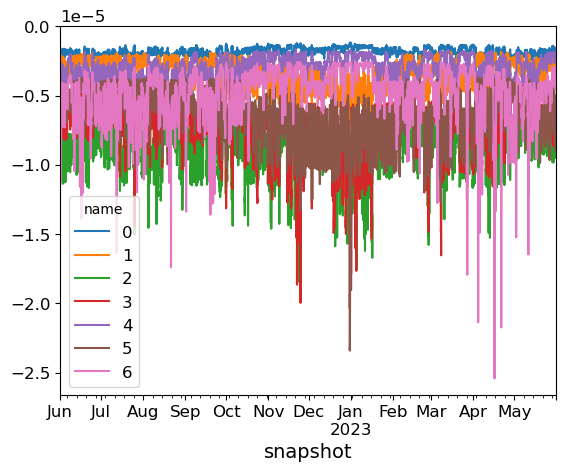

In [273]:
n = networks["dis"]

# Congestion rent (shadow price on line capacity constraint)
# n.lines_t.mu_lower  # binding at lower bound
n.lines_t.mu_upper.plot()  # binding at upper bound (congested)



In [22]:
ts_eb["carrier"].unique()

array(['CCGT', 'lignite', 'nuclear', 'onwind', 'ror', 'solar',
       'solar-hsat', 'biomass', 'offwind-ac', 'oil', 'offwind-dc',
       'load_shedding', 'AC', 'H2 electrolysis', 'H2 fuel cell', 'load',
       'battery', 'hydro', 'PHS', 'H2'], dtype=object)

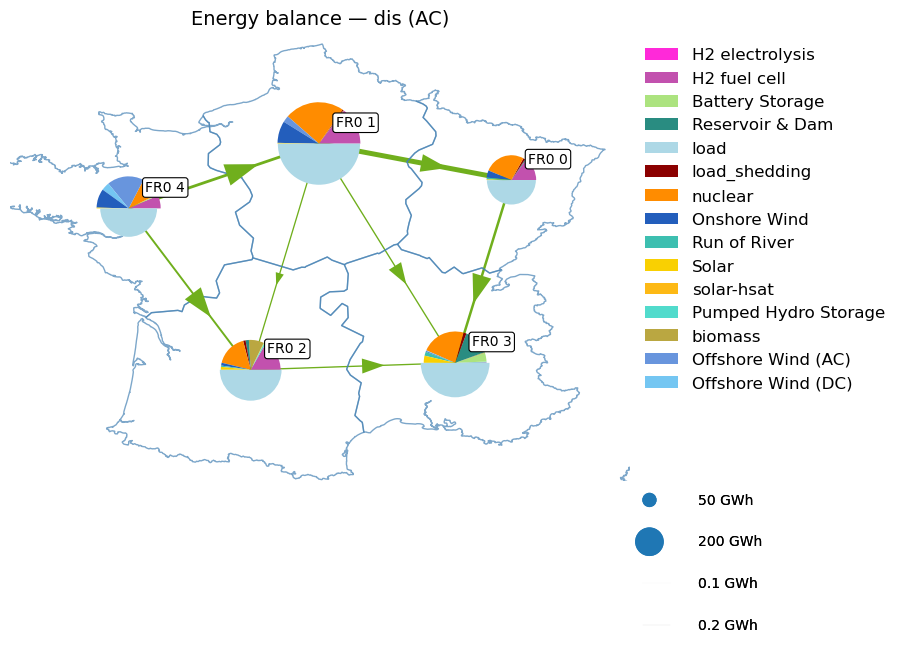

In [95]:
n = networks["dis"]

fig, ax = plot_network_map(
    n, regions,
    stat="energy_balance",
    snapshots=slice("2022-12-13", "2022-12-14"),
    legend_circles=[50_000, 200_000],
    legend_lines=[100, 200],
    legend_unit="GWh",
    legend_multiplier=1e-3,
    legend_spacing = 2,
    title="Energy balance — dis (AC)",
)


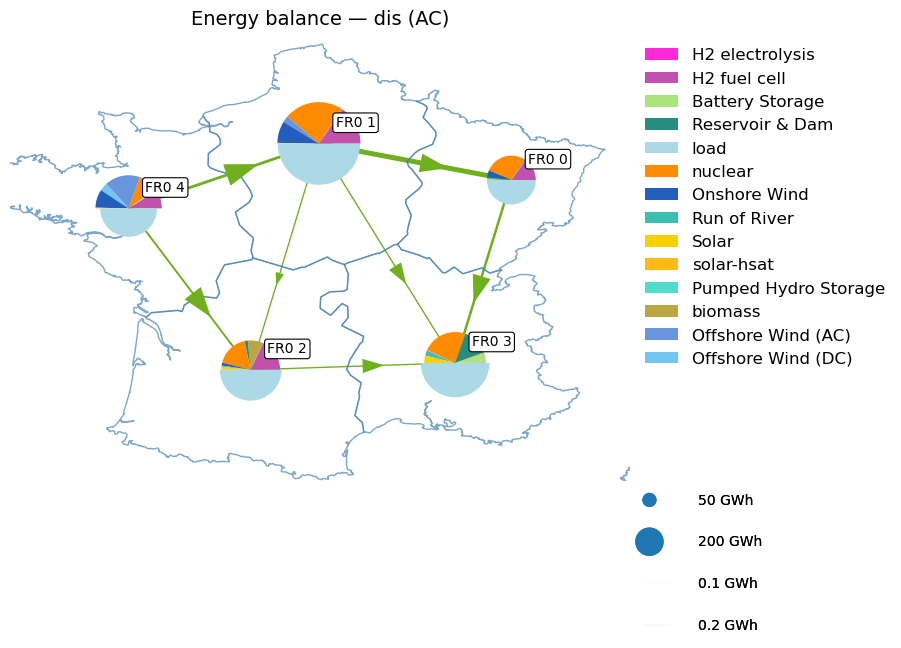

In [96]:
n = networks["base"]

fig, ax = plot_network_map(
    n, regions,
    stat="energy_balance",
    snapshots=slice("2022-12-13", "2022-12-14"),
    legend_circles=[50_000, 200_000],
    legend_lines=[100, 200],
    legend_unit="GWh",
    legend_multiplier=1e-3,
    legend_spacing = 2,
    title="Energy balance — dis (AC)",
)


In [365]:
n = networks["base_cap"]

n.links

,bus0,bus1,type,carrier,efficiency,active,build_year,lifetime,p_nom,p_nom_mod,...,min_up_time,min_down_time,up_time_before,down_time_before,ramp_limit_up,ramp_limit_down,ramp_limit_start_up,ramp_limit_shut_down,p_nom_opt,reversed
name,,,,,,,,,,,,,,,,,,,,,
FR0 0 H2 Electrolysis,FR0 0,FR0 0 H2,,H2 electrolysis,0.6994,True,0,inf,0.0,0.0,...,0,0,1,0,NaN,NaN,1.0,1.0,1428.443848,False
FR0 1 H2 Electrolysis,FR0 1,FR0 1 H2,,H2 electrolysis,0.6994,True,0,inf,0.0,0.0,...,0,0,1,0,NaN,NaN,1.0,1.0,4089.743508,False
FR0 2 H2 Electrolysis,FR0 2,FR0 2 H2,,H2 electrolysis,0.6994,True,0,inf,0.0,0.0,...,0,0,1,0,NaN,NaN,1.0,1.0,1851.079921,False
FR0 3 H2 Electrolysis,FR0 3,FR0 3 H2,,H2 electrolysis,0.6994,True,0,inf,0.0,0.0,...,0,0,1,0,NaN,NaN,1.0,1.0,72.809067,False
FR0 4 H2 Electrolysis,FR0 4,FR0 4 H2,,H2 electrolysis,0.6994,True,0,inf,0.0,0.0,...,0,0,1,0,NaN,NaN,1.0,1.0,2878.316973,False
FR0 0 H2 Fuel Cell,FR0 0 H2,FR0 0,,H2 fuel cell,0.5000,True,0,inf,0.0,0.0,...,0,0,1,0,NaN,NaN,1.0,1.0,6904.861136,False
FR0 1 H2 Fuel Cell,FR0 1 H2,FR0 1,,H2 fuel cell,0.5000,True,0,inf,0.0,0.0,...,0,0,1,0,NaN,NaN,1.0,1.0,23893.758335,False
FR0 2 H2 Fuel Cell,FR0 2 H2,FR0 2,,H2 fuel cell,0.5000,True,0,inf,0.0,0.0,...,0,0,1,0,NaN,NaN,1.0,1.0,11724.626038,False
FR0 3 H2 Fuel Cell,FR0 3 H2,FR0 3,,H2 fuel cell,0.5000,True,0,inf,0.0,0.0,...,0,0,1,0,NaN,NaN,1.0,1.0,287.123921,False


# aggregation check

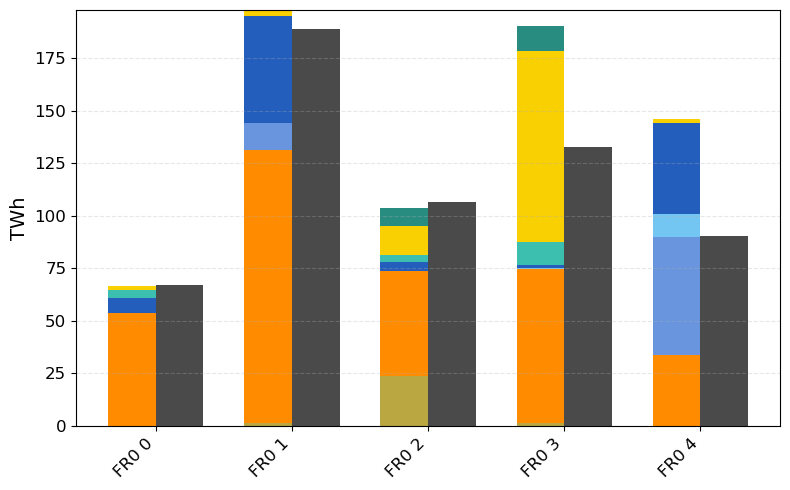

In [306]:
n = networks["base"]

# ── Available generation per carrier per bus (generators) ─────────────────────
gens = n.generators[~n.generators["carrier"].isin(["CCGT", "coal", "oil", "lignite", "load_shedding"])]

varying_idx = gens.index.intersection(n.generators_t.p_max_pu.columns)
static_idx  = gens.index.difference(varying_idx)

p_max_pu_sum = pd.Series(dtype=float)
if not varying_idx.empty:
    p_max_pu_sum = pd.concat([p_max_pu_sum, n.generators_t.p_max_pu[varying_idx].sum()])
if not static_idx.empty:
    p_max_pu_sum = pd.concat([p_max_pu_sum, gens.loc[static_idx, "p_max_pu"] * len(n.snapshots)])

avail_by_carrier_bus = (
    (gens["p_nom_opt"] * p_max_pu_sum)
    .rename("available_MWh")
    .to_frame()
    .assign(carrier=gens["carrier"], bus=gens["bus"])
    .groupby(["carrier", "bus"])["available_MWh"]
    .sum()
    .unstack("bus")
    .fillna(0)
) * 1e-6  # TWh

# ── Hydro available energy from inflow (efficiency-adjusted) ──────────────────
hydro_sus = n.storage_units.index[n.storage_units.carrier == "hydro"]
if not hydro_sus.empty:
    eta    = n.storage_units.loc[hydro_sus, "efficiency_dispatch"]
    inflow = (n.storage_units_t.inflow[hydro_sus] * eta).sum()
    hydro_avail = (
        inflow
        .rename("available_MWh")
        .to_frame()
        .assign(bus=n.storage_units.loc[hydro_sus, "bus"])
        .groupby("bus")["available_MWh"]
        .sum()
    ) * 1e-6  # TWh
    avail_by_carrier_bus.loc["hydro"] = hydro_avail.reindex(avail_by_carrier_bus.columns, fill_value=0)

# ── Load per bus ───────────────────────────────────────────────────────────────
load_by_bus = (
    n.loads_t.p_set.sum()
    .rename("load_MWh")
    .to_frame()
    .assign(bus=n.loads["bus"])
    .groupby("bus")["load_MWh"]
    .sum()
) * 1e-6  # TWh

# ── Add Total column so _plot can be reused ───────────────────────────────────
avail_plot = avail_by_carrier_bus.copy()
avail_plot["Total"] = avail_plot.sum(axis=1)
load_plot = load_by_bus.copy()
load_plot["Total"] = load_by_bus.sum()

color_map = n.carriers.color.to_dict()
carriers  = avail_plot.index.tolist()

def _plot(ax, buses):
    x      = np.arange(len(buses))
    width  = 0.35
    bottom = np.zeros(len(buses))
    for carrier in carriers:
        vals  = avail_plot.loc[carrier, buses].values
        color = color_map.get(carrier, "#aaaaaa")
        ax.bar(x - width/2, vals, width, bottom=bottom, label=carrier, color=color)
        bottom += vals
    ax.bar(x + width/2, load_plot.reindex(buses).values, width,
           label="load", color=color_map.get("load", "#4a4a4a"))
    ax.set_xticks(x)
    ax.set_xticklabels(buses, rotation=45, ha="right")
    ax.set_ylabel("TWh")
    ax.grid(True, axis="y", alpha=0.3, linestyle="--")

per_bus_cols = avail_by_carrier_bus.columns.tolist()

# ── Plot 1: per bus ────────────────────────────────────────────────────────────
fig1, ax1 = plt.subplots(figsize=(8, 5))
_plot(ax1, per_bus_cols)
# ax1.legend(bbox_to_anchor=(1.01, 1), loc="upper left", fontsize=9)
plt.tight_layout()
plt.show()


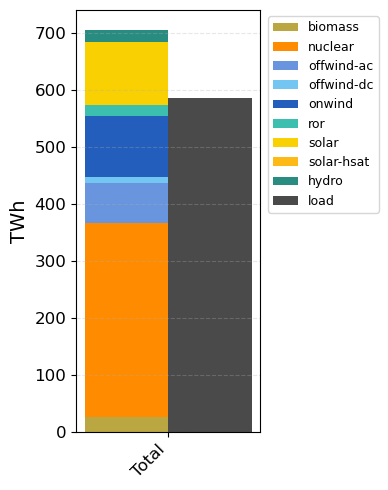

In [307]:
# ── Plot 2: total — reuses _plot ───────────────────────────────────────────────
fig2, ax2 = plt.subplots(figsize=(4, 5))
_plot(ax2, ["Total"])
ax2.legend(bbox_to_anchor=(1.01, 1), loc="upper left", fontsize=9)
plt.tight_layout()
plt.show()

## Aggregate Potential energy damaged network, whole year

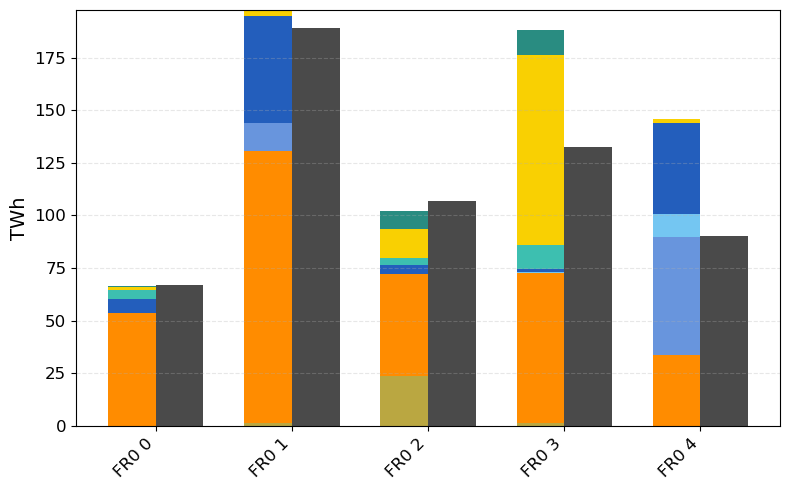

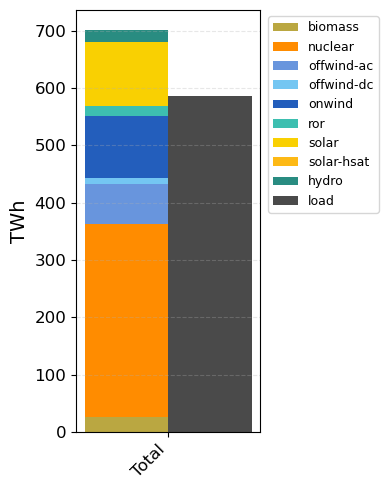

In [304]:
n = networks["dis"]

# ── Available generation per carrier per bus (generators) ─────────────────────
gens = n.generators[~n.generators["carrier"].isin(["CCGT", "coal", "oil", "lignite", "load_shedding"])]

varying_idx = gens.index.intersection(n.generators_t.p_max_pu.columns)
static_idx  = gens.index.difference(varying_idx)

p_max_pu_sum = pd.Series(dtype=float)
if not varying_idx.empty:
    p_max_pu_sum = pd.concat([p_max_pu_sum, n.generators_t.p_max_pu[varying_idx].sum()])
if not static_idx.empty:
    p_max_pu_sum = pd.concat([p_max_pu_sum, gens.loc[static_idx, "p_max_pu"] * len(n.snapshots)])

avail_by_carrier_bus = (
    (gens["p_nom_opt"] * p_max_pu_sum)
    .rename("available_MWh")
    .to_frame()
    .assign(carrier=gens["carrier"], bus=gens["bus"])
    .groupby(["carrier", "bus"])["available_MWh"]
    .sum()
    .unstack("bus")
    .fillna(0)
) * 1e-6  # TWh

# ── Hydro available energy from inflow (efficiency-adjusted) ──────────────────
hydro_sus = n.storage_units.index[n.storage_units.carrier == "hydro"]
if not hydro_sus.empty:
    eta    = n.storage_units.loc[hydro_sus, "efficiency_dispatch"]
    inflow = (n.storage_units_t.inflow[hydro_sus] * eta).sum()
    hydro_avail = (
        inflow
        .rename("available_MWh")
        .to_frame()
        .assign(bus=n.storage_units.loc[hydro_sus, "bus"])
        .groupby("bus")["available_MWh"]
        .sum()
    ) * 1e-6  # TWh
    avail_by_carrier_bus.loc["hydro"] = hydro_avail.reindex(avail_by_carrier_bus.columns, fill_value=0)

# ── Load per bus ───────────────────────────────────────────────────────────────
load_by_bus = (
    n.loads_t.p_set.sum()
    .rename("load_MWh")
    .to_frame()
    .assign(bus=n.loads["bus"])
    .groupby("bus")["load_MWh"]
    .sum()
) * 1e-6  # TWh

# ── Add Total column so _plot can be reused ───────────────────────────────────
avail_plot = avail_by_carrier_bus.copy()
avail_plot["Total"] = avail_plot.sum(axis=1)
load_plot = load_by_bus.copy()
load_plot["Total"] = load_by_bus.sum()

color_map = n.carriers.color.to_dict()
carriers  = avail_plot.index.tolist()

def _plot(ax, buses):
    x      = np.arange(len(buses))
    width  = 0.35
    bottom = np.zeros(len(buses))
    for carrier in carriers:
        vals  = avail_plot.loc[carrier, buses].values
        color = color_map.get(carrier, "#aaaaaa")
        ax.bar(x - width/2, vals, width, bottom=bottom, label=carrier, color=color)
        bottom += vals
    ax.bar(x + width/2, load_plot.reindex(buses).values, width,
           label="load", color=color_map.get("load", "#4a4a4a"))
    ax.set_xticks(x)
    ax.set_xticklabels(buses, rotation=45, ha="right")
    ax.set_ylabel("TWh")
    ax.grid(True, axis="y", alpha=0.3, linestyle="--")

per_bus_cols = avail_by_carrier_bus.columns.tolist()

# ── Plot 1: per bus ────────────────────────────────────────────────────────────
fig1, ax1 = plt.subplots(figsize=(8, 5))
_plot(ax1, per_bus_cols)
# ax1.legend(bbox_to_anchor=(1.01, 1), loc="upper left", fontsize=9)
plt.tight_layout()
plt.show()

# ── Plot 2: total — reuses _plot ───────────────────────────────────────────────
fig2, ax2 = plt.subplots(figsize=(4, 5))
_plot(ax2, ["Total"])
ax2.legend(bbox_to_anchor=(1.01, 1), loc="upper left", fontsize=9)
plt.tight_layout()
plt.show()


In [248]:
# ── Table: buses as rows, carriers + load as columns ─────────────────────────
table = avail_by_carrier_bus.T.copy()
table["total gen"] = table.sum(axis=1)
table["load"]      = load_by_bus
table["gen/load"]  = (table["total gen"] / table["load"]).round(2)

# Totals row
totals = table.sum(numeric_only=True)
totals["gen/load"] = (totals["total gen"] / totals["load"]).round(2)
table.loc["Total"] = totals

table

carrier,biomass,nuclear,offwind-ac,offwind-dc,onwind,ror,solar,solar-hsat,hydro,total gen,load,gen/load
bus,,,,,,,,,,,,
FR0 0,0.000000,53.546268,0.000000,0.000000,6.999107,3.918034,1.779387,0.000551,0.368950,66.612297,66.907248,1.00
FR0 1,1.297057,129.497197,12.915826,0.000000,51.093737,0.000000,2.803624,0.000416,0.000000,197.607857,189.125627,1.04
FR0 2,23.668863,48.592619,0.094101,0.000000,4.273609,3.334271,13.666380,0.002875,9.601204,103.233921,106.705425,0.97
FR0 3,1.314078,71.258100,0.184671,0.464096,1.555092,10.984561,90.633771,0.003227,13.254718,189.652313,132.556067,1.43
FR0 4,0.000000,33.813557,56.033462,10.914953,43.298179,0.000000,1.993367,0.000528,0.000000,146.054046,90.430784,1.62
Total,26.279998,336.707741,69.228059,11.379050,107.219723,18.236865,110.876529,0.007597,23.224872,703.160435,585.725152,1.20


## Aggregate line flows

In [281]:
def _line_flow_by_bus(network, col="value"):
    mask = (
        (d["ts_diff"]["carrier"] == "AC") &
        (d["ts_diff"]["network"] == network) &
        (d["ts_diff"]["bus_carrier"] == "AC")
        # & (d["ts_diff"]["snapshot"] <= CUTOFF)
    )
    return d["ts_diff"][mask].groupby("bus")[col].sum() / 1e3

line_base = _line_flow_by_bus(base, "value").rename("net line flow base (GWh)")
line_scen = _line_flow_by_bus(scen, "value").rename("net line flow scen (GWh)")
line_diff = _line_flow_by_bus(scen, "value_diff").rename("net line flow diff (GWh)")

line_flows = pd.concat([line_base, line_scen, line_diff], axis=1)
line_flows.loc["Total"] = line_flows.sum()

line_flows


,net line flow base (GWh),net line flow scen (GWh),net line flow diff (GWh)
bus,,,
FR0 0,13443.214710,13347.377034,-95.837676
FR0 1,27754.537057,27326.741680,-427.795377
FR0 2,28882.805131,29196.090756,313.285625
FR0 3,-40196.779340,-39929.289408,267.489933
FR0 4,-34078.636113,-33744.583098,334.053015
Total,-4194.858555,-3803.663036,391.195519


## Check PEL vs change in nuclear

## Total year

In [67]:
pel_by_bus = d["pel_dict_nuc"]["nuclear"].sum(axis=0).rename("PEL (GWh)")

nuc_mask = (
    (d["ts_diff"]["carrier"] == "nuclear") &
    (d["ts_diff"]["bus_carrier"] == "AC")
)

eb_diff_by_bus = (
    d["ts_diff"][nuc_mask & (d["ts_diff"]["network"] == scen)]
    .groupby("bus")["value_diff"]
    .sum()
    .rename("EB diff (GWh)")
)

base_eb_by_bus = (
    d["ts_diff"][nuc_mask & (d["ts_diff"]["network"] == base)]
    .groupby("bus")["value"]
    .sum()
    .rename("base EB (GWh)")
)

per_bus = pd.concat([pel_by_bus, eb_diff_by_bus, base_eb_by_bus], axis=1) / 1e3
per_bus["EB diff / PEL (%)"]     = (per_bus["EB diff (GWh)"].abs() / per_bus["PEL (GWh)"]) * 100
per_bus["EB diff / base EB (%)"] = (per_bus["EB diff (GWh)"].abs() / per_bus["base EB (GWh)"].abs()) * 100

total = per_bus.sum(numeric_only=True).to_frame("Total").T
total["EB diff / PEL (%)"]     = (total["EB diff (GWh)"].abs() / total["PEL (GWh)"]) * 100
total["EB diff / base EB (%)"] = (total["EB diff (GWh)"].abs() / total["base EB (GWh)"].abs()) * 100

total


,PEL (GWh),EB diff (GWh),base EB (GWh),EB diff / PEL (%),EB diff / base EB (%)
Total,3951.839584,-1718.218848,291274.178718,43.478962,0.589897


In [69]:
print(per_bus)

         PEL (GWh)  EB diff (GWh)  base EB (GWh)  EB diff / PEL (%)  \
bus                                                                   
FR0 0   199.485991     170.296174   46824.278412          85.367485   
FR0 1   388.374237    -280.269274  112344.209854          72.164744   
FR0 2  1321.860555   -1177.423467   45814.304782          89.073198   
FR0 3  1967.791138    -544.765606   58796.636478          27.684117   
FR0 4    74.327662     113.943325   27494.749193         153.298680   

       EB diff / base EB (%)  
bus                           
FR0 0               0.363692  
FR0 1               0.249474  
FR0 2               2.569991  
FR0 3               0.926525  
FR0 4               0.414418  


In [70]:
print(total)

         PEL (GWh)  EB diff (GWh)  base EB (GWh)  EB diff / PEL (%)  \
Total  3951.839584   -1718.218848  291274.178718          43.478962   

       EB diff / base EB (%)  
Total               0.589897  


In [59]:
scen

'dis'

In [180]:
n_base = nc.networks[base]
n_scen = nc.networks[scen]
CUTOFF = pd.Timestamp("2022-11-27 15:00:00")

def _eb_sum_by_bus(n, carriers, cutoff):
    eb = n.statistics.energy_balance(
        groupby=["bus", "carrier", "bus_carrier"],
        groupby_time=False,
        nice_names=False,
    )
    ts_cols = [c for c in eb.columns if isinstance(c, pd.Timestamp)]
    eb_sum  = eb[ts_cols].sum(axis=1).reset_index()
    eb_sum.columns = list(eb_sum.columns[:-1]) + ["value"]
    eb_sum  = eb_sum[(eb_sum["bus_carrier"] == "AC") & (eb_sum["carrier"].isin(carriers))]
    return eb_sum.groupby(["bus", "carrier"])["value"].sum().unstack("carrier")

eb_base = _eb_sum_by_bus(n_base, SUP_CARRIERS + CHARGE_CARRIERS, CUTOFF)
eb_scen = _eb_sum_by_bus(n_scen, SUP_CARRIERS + CHARGE_CARRIERS, CUTOFF)
eb_diff = (eb_scen - eb_base) / 1e3  # GWh

pel_by_bus = d["pel_dict_nuc"]["nuclear"].loc[:CUTOFF].sum(axis=0).rename("PEL (GWh)") / 1e3

per_bus = pd.concat([pel_by_bus, eb_diff], axis=1)
per_bus["nuclear EB diff / PEL (%)"] = (per_bus["nuclear"].abs() / per_bus["PEL (GWh)"]) * 100

total = per_bus.sum(numeric_only=True).to_frame("Total").T
total["nuclear EB diff / PEL (%)"] = (total["nuclear"].abs() / total["PEL (GWh)"]) * 100

total


,PEL (GWh),H2 electrolysis,H2 fuel cell,PHS,battery,biomass,hydro,load_shedding,nuclear,offwind-ac,offwind-dc,onwind,ror,solar,solar-hsat,nuclear EB diff / PEL (%)
Total,3947.814463,1076.479537,-376.444926,76.310165,52.710511,593.58411,26.898326,0.0,-1712.659138,-644.723371,-225.758626,223.369329,71.065798,105.852747,0.109667,43.382463


In [57]:
eta_elec  = n.links.loc[n.links["carrier"] == "H2 electrolysis", "efficiency"].iloc[0]
eta_fc    = n.links.loc[n.links["carrier"] == "H2 fuel cell",    "efficiency"].iloc[0]

## storage check

In [178]:
for name, n in networks.items():
    h2 = n.stores.index[n.stores.carrier == "H2"]
    soc = n.stores_t.e[h2]
    print(f"{name}  start: {soc.iloc[0].sum():.1f} MWh  end: {soc.iloc[-1].sum():.1f} MWh")


base  start: 13136033.5 MWh  end: 13128814.5 MWh
base_cap  start: 13134811.3 MWh  end: 13127593.6 MWh
base_dis  start: 13134851.3 MWh  end: 13127633.1 MWh
cap  start: 13373489.1 MWh  end: 13366128.2 MWh
cap_op  start: 13367630.6 MWh  end: 13360268.6 MWh
dis  start: 13136033.5 MWh  end: 13128814.5 MWh


In [179]:
for name, n in networks.items():
    print(f"\n── {name} ──")

    # H2 stores
    h2_idx = n.stores.index[n.stores.carrier == "H2"]
    if len(h2_idx):
        soc = n.stores_t.e[h2_idx]
        print(f"  H2      start: {soc.iloc[0].sum():.1f} MWh  end: {soc.iloc[-1].sum():.1f} MWh  max: {soc.sum(axis=1).max():.1f} MWh  min: {soc.sum(axis=1).min():.1f} MWh")

    # StorageUnits (battery, PHS, hydro)
    for carrier in ["battery", "PHS", "hydro"]:
        idx = n.storage_units.index[n.storage_units.carrier == carrier]
        if len(idx):
            soc = n.storage_units_t.state_of_charge[idx]
            print(f"  {carrier:<8} start: {soc.iloc[0].sum():.1f} MWh  end: {soc.iloc[-1].sum():.1f} MWh  max: {soc.sum(axis=1).max():.1f} MWh  min: {soc.sum(axis=1).min():.1f} MWh")



── base ──
  H2      start: 13136033.5 MWh  end: 13128814.5 MWh  max: 41903001.4 MWh  min: 0.1 MWh
  battery  start: 167383.5 MWh  end: 173807.3 MWh  max: 174148.6 MWh  min: 0.0 MWh
  PHS      start: 81755.4 MWh  end: 81958.7 MWh  max: 82486.1 MWh  min: 0.0 MWh
  hydro    start: 5994513.0 MWh  end: 5998374.5 MWh  max: 6066657.4 MWh  min: 3683670.4 MWh

── base_cap ──
  H2      start: 13134811.3 MWh  end: 13127593.6 MWh  max: 41899556.2 MWh  min: 0.0 MWh
  battery  start: 167752.6 MWh  end: 174087.1 MWh  max: 174240.9 MWh  min: 0.0 MWh
  PHS      start: 81948.3 MWh  end: 82208.7 MWh  max: 82486.1 MWh  min: 0.0 MWh
  hydro    start: 5994142.8 MWh  end: 5998038.6 MWh  max: 6067337.7 MWh  min: 3683897.3 MWh

── base_dis ──
  H2      start: 13134851.3 MWh  end: 13127633.1 MWh  max: 41899555.4 MWh  min: 0.2 MWh
  battery  start: 168098.0 MWh  end: 174235.0 MWh  max: 174240.9 MWh  min: 0.0 MWh
  PHS      start: 81978.7 MWh  end: 82479.1 MWh  max: 82486.2 MWh  min: 0.0 MWh
  hydro    start: 5

In [50]:
base = "base"
scen = "dis"

d = prepare_combo_data(base, scen, nc=nc, scenarios=scenarios)

soc_utilisation = pd.DataFrame({
    "e_nom_opt (MWh)":    d["h2_e_nom_by_bus"],
    "max SOC base (MWh)": d["soc_base"].max(),
    "max SOC base at":    d["soc_base"].idxmax(),
    "max SOC scen (MWh)": d["soc_scen"].max(),
    "max SOC scen at":    d["soc_scen"].idxmax(),
    "min SOC base (MWh)": d["soc_base"].min(),
    "min SOC base at":    d["soc_base"].idxmin(),
    "min SOC scen (MWh)": d["soc_scen"].min(),
    "min SOC scen at":    d["soc_scen"].idxmin(),
})
soc_utilisation["utilisation base (%)"] = (
    soc_utilisation["max SOC base (MWh)"] / soc_utilisation["e_nom_opt (MWh)"] * 100
).round(1)
soc_utilisation["utilisation scen (%)"] = (
    soc_utilisation["max SOC scen (MWh)"] / soc_utilisation["e_nom_opt (MWh)"] * 100
).round(1)
soc_utilisation["max SOC diff (MWh)"] = (
    soc_utilisation["max SOC scen (MWh)"] - soc_utilisation["max SOC base (MWh)"]
).round(1)

soc_utilisation
soc_utilisation.to_csv(root.parent.parent.parent / "results" / f"h2_soc_utilisation_FR-{YEAR}.csv")


In [51]:
soc_utilisation

,e_nom_opt (MWh),max SOC base (MWh),max SOC base at,max SOC scen (MWh),max SOC scen at,min SOC base (MWh),min SOC base at,min SOC scen (MWh),min SOC scen at,utilisation base (%),utilisation scen (%),max SOC diff (MWh)
bus,,,,,,,,,,,,
FR0 0 H2,5.879036e+06,5.879036e+06,2022-11-27 15:00:00,5.852165e+06,2022-11-27 15:00:00,0.017062,2023-03-07 23:00:00,0.033931,2023-03-07 23:00:00,100.0,99.5,-26870.7
FR0 1 H2,1.677335e+07,1.677335e+07,2022-11-27 15:00:00,1.643678e+07,2022-11-27 15:00:00,0.016036,2023-03-07 23:00:00,0.088238,2023-03-07 23:00:00,100.0,98.0,-336569.3
FR0 2 H2,7.927152e+06,7.927152e+06,2022-11-27 15:00:00,7.824944e+06,2022-11-27 15:00:00,0.014370,2023-03-07 23:00:00,6977.452977,2023-03-07 23:00:00,100.0,98.7,-102207.6
FR0 3 H2,4.481308e+05,4.481308e+05,2022-11-27 15:00:00,4.481308e+05,2022-11-27 15:00:00,0.015858,2023-03-07 23:00:00,0.013636,2023-03-07 23:00:00,100.0,100.0,-0.0
FR0 4 H2,1.087533e+07,1.087533e+07,2022-11-27 15:00:00,1.061124e+07,2022-11-27 15:00:00,0.018624,2023-03-07 23:00:00,0.029263,2023-03-07 23:00:00,100.0,97.6,-264095.2


In [52]:
eta_fc = nc.networks[scen].links.loc[
    nc.networks[scen].links["carrier"] == "H2 fuel cell", "efficiency"
].iloc[0]

soc_diff_sum = soc_utilisation["max SOC diff (MWh)"].sum()
print(f"Sum of max SOC diff:             {soc_diff_sum:,.1f} MWh (H2)")
print(f"Sum of max SOC diff × η_fc:      {soc_diff_sum * eta_fc:,.1f} MWh (AC equivalent)")


Sum of max SOC diff:             -729,742.8 MWh (H2)
Sum of max SOC diff × η_fc:      -364,871.4 MWh (AC equivalent)


In [53]:
n_base = nc.networks[base]
n_scen = nc.networks[scen]

def _storage_soc_table(carrier):
    idx_base = n_base.storage_units[n_base.storage_units.carrier == carrier].index
    idx_scen = n_scen.storage_units[n_scen.storage_units.carrier == carrier].index

    soc_base = n_base.storage_units_t.state_of_charge[idx_base]
    soc_scen = n_scen.storage_units_t.state_of_charge[idx_scen]

    e_nom = (n_scen.storage_units["p_nom_opt"] * n_scen.storage_units["max_hours"])\
            .loc[idx_scen]

    df = pd.DataFrame({
        "e_nom_opt (MWh)":    e_nom.values,
        "max SOC base (MWh)": soc_base.max().values,
        "max SOC base at":    soc_base.idxmax().values,
        "max SOC scen (MWh)": soc_scen.max().values,
        "max SOC scen at":    soc_scen.idxmax().values,
        "min SOC base (MWh)": soc_base.min().values,
        "min SOC scen (MWh)": soc_scen.min().values,
    }, index=idx_scen)

    df["utilisation base (%)"] = (df["max SOC base (MWh)"] / df["e_nom_opt (MWh)"] * 100).round(1)
    df["utilisation scen (%)"] = (df["max SOC scen (MWh)"] / df["e_nom_opt (MWh)"] * 100).round(1)
    df["max SOC diff (MWh)"]   = (df["max SOC scen (MWh)"] - df["max SOC base (MWh)"]).round(1)
    return df

battery_soc = _storage_soc_table("battery")
phs_soc     = _storage_soc_table("PHS")

print("Battery:"); display(battery_soc)
print("PHS:");     display(phs_soc)


Battery:


,e_nom_opt (MWh),max SOC base (MWh),max SOC base at,max SOC scen (MWh),max SOC scen at,min SOC base (MWh),min SOC scen (MWh),utilisation base (%),utilisation scen (%),max SOC diff (MWh)
name,,,,,,,,,,
FR0 0 battery,4094.737057,4094.734263,2023-02-08 16:00:00,4094.737209,2023-02-27 16:00:00,0.003230,0.000023,100.0,100.0,0.0
FR0 1 battery,8839.199515,8839.196499,2023-02-08 16:00:00,8839.199654,2023-01-16 16:00:00,0.002940,0.000025,100.0,100.0,0.0
FR0 2 battery,13558.121091,13558.119783,2022-12-11 15:00:00,13558.121239,2023-02-27 16:00:00,0.003061,0.000029,100.0,100.0,0.0
FR0 3 battery,125030.300168,125030.298801,2022-12-11 15:00:00,125030.300330,2023-02-27 16:00:00,0.001452,0.000032,100.0,100.0,0.0
FR0 4 battery,22626.290298,22626.287405,2022-12-11 15:00:00,22626.290446,2023-02-27 16:00:00,0.002002,0.000031,100.0,100.0,0.0


PHS:


,e_nom_opt (MWh),max SOC base (MWh),max SOC base at,max SOC scen (MWh),max SOC scen at,min SOC base (MWh),min SOC scen (MWh),utilisation base (%),utilisation scen (%),max SOC diff (MWh)
name,,,,,,,,,,
FR0 1 PHS,4503.000000,4502.996065,2022-12-07 15:00:00,4503.000149,2023-02-27 16:00:00,0.007134,0.000025,100.0,100.0,0.0
FR0 2 PHS,36400.000000,36399.992450,2022-11-27 15:00:00,36400.000129,2023-02-27 16:00:00,0.011447,0.000041,100.0,100.0,0.0
FR0 3 PHS,41583.153523,41583.129313,2023-02-27 16:00:00,41583.153685,2023-02-27 16:00:00,0.008477,0.000050,100.0,100.0,0.0


## before winter

In [73]:
CUTOFF = pd.Timestamp("2022-11-27 15:00:00")

pel_by_bus = d["pel_dict_nuc"]["nuclear"].loc[:CUTOFF].sum(axis=0).rename("PEL (GWh)") / 1e3

def _eb_diff_by_bus(carrier):
    mask = (
        (d["ts_diff"]["carrier"] == carrier) &
        (d["ts_diff"]["network"] == scen) &
        (d["ts_diff"]["bus_carrier"] == "AC") &
        (d["ts_diff"]["snapshot"] <= CUTOFF)
    )
    return d["ts_diff"][mask].groupby("bus")["value_diff"].sum().rename(carrier)

eb_cols = pd.concat(
    [_eb_diff_by_bus(c) for c in SUP_CARRIERS + CHARGE_CARRIERS],
    axis=1,
) / 1e3

per_bus = pd.concat([pel_by_bus, eb_cols], axis=1)
# per_bus["nuclear EB diff / PEL (%)"] = (per_bus["nuclear"].abs() / per_bus["PEL (GWh)"]) * 100

total = per_bus.sum(numeric_only=True).to_frame("Total").T
# total["nuclear EB diff / PEL (%)"] = (total["nuclear"].abs() / total["PEL (GWh)"]) * 100


In [55]:
STOR_CARRIERS

['H2 fuel cell']

In [167]:
CHARGE_CARRIERS

['H2 electrolysis', 'H2 fuel cell', 'battery', 'PHS']

In [238]:
soc_diff_sum

np.float64(-733971.4)

In [257]:
soc_diff_sum/eta_elec

np.float64(-1049411.781527023)

In [71]:
soc_diff_sum

np.float64(-729742.8)

In [197]:
eta_elec

np.float64(0.6994)

In [75]:
# missing charged energy
((soc_diff_sum))/((eta_elec)*1000)

np.float64(-1043.384043465828)

In [74]:
# for storage units, sum of discharging (+) and charging (-) energy over the period, in MWh
# value_diff > 0 → scenario discharges more (or charges less) than base
# value_diff < 0 → scenario charges more (or discharges less) than base

total

,PEL (GWh),biomass,nuclear,offwind-ac,offwind-dc,onwind,solar,solar-hsat,load_shedding,ror,hydro,H2 electrolysis,H2 fuel cell,battery,PHS
Total,3947.814463,583.345511,-1716.808257,15.538789,13.707632,-175.590141,13.731725,0.677195,0.000931,20.835808,38.017185,1044.637258,-0.438163,15.550082,-3.461075


In [181]:
SUP_CARRIERS + CHARGE_CARRIERS

['biomass',
 'nuclear',
 'offwind-ac',
 'offwind-dc',
 'onwind',
 'solar',
 'solar-hsat',
 'load_shedding',
 'ror',
 'hydro',
 'H2 electrolysis',
 'H2 fuel cell',
 'battery',
 'PHS']

In [ ]:
generators_+_storage = [
    'offwind-ac',
    'offwind-dc',
    'onwind',
    'solar',
    'solar-hsat',
    'ror',
    'hydro',
    'battery', 
    'PHS', 
    'H2 fuel cell'
    ]

In [64]:
1194.892778- 150.264403

1044.628375

In [63]:
total[total.columns.intersection(
['biomass',
 'nuclear',
 'offwind-ac',
 'offwind-dc',
 'onwind',
 'solar',
 'solar-hsat',
 'load_shedding',
 'ror',
 'hydro'
 ] 
 + ['battery', 'PHS','H2 fuel cell']
 )].sum(axis=1)

Total   -1194.892778
dtype: float64

In [62]:
def _line_flow_by_bus(network, col="value"):
    mask = (
        (d["ts_diff"]["carrier"] == "AC") &
        (d["ts_diff"]["network"] == network) &
        (d["ts_diff"]["bus_carrier"] == "AC") &
        (d["ts_diff"]["snapshot"] <= CUTOFF)
    )
    return d["ts_diff"][mask].groupby("bus")[col].sum() / 1e3

line_base = _line_flow_by_bus(base, "value").rename("net line flow base (GWh)")
line_scen = _line_flow_by_bus(scen, "value").rename("net line flow scen (GWh)")
line_diff = _line_flow_by_bus(scen, "value_diff").rename("net line flow diff (GWh)")

line_flows = pd.concat([line_base, line_scen, line_diff], axis=1)
line_flows.loc["Total"] = line_flows.sum()

line_flows


,net line flow base (GWh),net line flow scen (GWh),net line flow diff (GWh)
bus,,,
FR0 0,6934.977826,6770.454392,-164.523434
FR0 1,15846.526368,15570.951247,-275.575121
FR0 2,14071.215496,14548.860397,477.644900
FR0 3,-26345.496165,-25837.638908,507.857257
FR0 4,-12627.724990,-13022.864189,-395.139199
Total,-2120.501465,-1970.237062,150.264403


In [65]:
print(line_flows)

       net line flow base (GWh)  net line flow scen (GWh)  \
bus                                                         
FR0 0               6934.977826               6770.454392   
FR0 1              15846.526368              15570.951247   
FR0 2              14071.215496              14548.860397   
FR0 3             -26345.496165             -25837.638908   
FR0 4             -12627.724990             -13022.864189   
Total              -2120.501465              -1970.237062   

       net line flow diff (GWh)  
bus                              
FR0 0               -164.523434  
FR0 1               -275.575121  
FR0 2                477.644900  
FR0 3                507.857257  
FR0 4               -395.139199  
Total                150.264403  


In [253]:
CUTOFF = pd.Timestamp("2022-11-27 15:00:00")

pel_by_bus = d["pel_dict_nuc"]["nuclear"].loc[:CUTOFF].sum(axis=0).rename("PEL (GWh)") / 1e3

def _eb_diff_by_bus(carrier, bus_carrier="AC"):
    mask = (
        (d["ts_diff"]["carrier"] == carrier) &
        (d["ts_diff"]["network"] == scen) &
        (d["ts_diff"]["bus_carrier"] == bus_carrier) &
        (d["ts_diff"]["snapshot"] <= CUTOFF)
    )
    return d["ts_diff"][mask].groupby("bus")["value_diff"].sum().rename(carrier)

# AC bus carriers
ac_carriers = SUP_CARRIERS + CHARGE_CARRIERS
eb_ac = pd.concat([_eb_diff_by_bus(c, "AC") for c in ac_carriers], axis=1) / 1e3

# H2 bus carriers — discover from ts_diff what carriers appear at H2 buses
h2_carriers = (
    d["ts_diff"][d["ts_diff"]["bus_carrier"] == "H2"]["carrier"].unique().tolist()
)
eb_h2 = pd.concat([_eb_diff_by_bus(c, "H2") for c in h2_carriers], axis=1) / 1e3

# Per-bus tables
per_bus_ac = pd.concat([pel_by_bus, eb_ac], axis=1)
per_bus_ac["nuclear EB diff / PEL (%)"] = (per_bus_ac["nuclear"].abs() / per_bus_ac["PEL (GWh)"]) * 100

per_bus_h2 = pd.concat([pel_by_bus, eb_h2], axis=1)

# Totals
total_ac = per_bus_ac.sum(numeric_only=True).to_frame("Total").T
total_ac["nuclear EB diff / PEL (%)"] = (total_ac["nuclear"].abs() / total_ac["PEL (GWh)"]) * 100

total_h2 = per_bus_h2.sum(numeric_only=True).to_frame("Total").T

print("── AC bus carriers ──")
display(per_bus_ac.round(2))
display(total_ac.round(2))

print("\n── H2 bus carriers ──")
display(per_bus_h2.round(2))
display(total_h2.round(2))


── AC bus carriers ──


,PEL (GWh),biomass,nuclear,offwind-ac,offwind-dc,onwind,solar,solar-hsat,load_shedding,ror,hydro,H2 electrolysis,H2 fuel cell,battery,PHS,nuclear EB diff / PEL (%)
bus,,,,,,,,,,,,,,,,
FR0 0,199.49,NaN,-41.15,NaN,NaN,3.48,1.51,0.05,0.0,3.43,30.57,41.63,-0.05,0.72,NaN,20.63
FR0 1,388.37,25.30,-83.76,-10.26,NaN,5.18,1.65,0.04,0.0,NaN,NaN,583.35,-0.05,0.98,4.52,21.57
FR0 2,1317.93,554.22,-1184.84,-0.06,NaN,2.95,2.20,0.06,0.0,3.23,3.96,150.50,-0.05,4.23,-4.27,89.90
FR0 3,1967.69,22.23,-506.64,-0.12,-0.57,3.15,2.94,0.07,0.0,4.58,0.30,0.17,-0.06,4.79,-9.67,25.75
FR0 4,74.33,NaN,95.47,-32.83,-83.06,11.39,2.32,0.05,0.0,NaN,NaN,274.53,-0.06,2.73,NaN,128.45


,PEL (GWh),biomass,nuclear,offwind-ac,offwind-dc,onwind,solar,solar-hsat,load_shedding,ror,hydro,H2 electrolysis,H2 fuel cell,battery,PHS,nuclear EB diff / PEL (%)
Total,3947.81,601.74,-1720.93,-43.28,-83.63,26.14,10.63,0.28,0.0,11.25,34.83,1050.19,-0.27,13.44,-9.42,43.59



── H2 bus carriers ──


,PEL (GWh),H2 fuel cell,H2 electrolysis,H2,load_shedding
bus,,,,,
FR0 0,199.49,NaN,NaN,NaN,NaN
FR0 1,388.37,NaN,NaN,NaN,NaN
FR0 2,1317.93,NaN,NaN,NaN,NaN
FR0 3,1967.69,NaN,NaN,NaN,NaN
FR0 4,74.33,NaN,NaN,NaN,NaN
FR0 0 H2,NaN,0.11,-29.12,29.01,0.0
FR0 1 H2,NaN,0.10,-408.00,407.89,0.0
FR0 2 H2,NaN,0.10,-105.26,105.16,0.0
FR0 3 H2,NaN,0.12,-0.12,0.00,0.0


,PEL (GWh),H2 fuel cell,H2 electrolysis,H2,load_shedding
Total,3947.81,0.54,-734.5,733.96,0.0


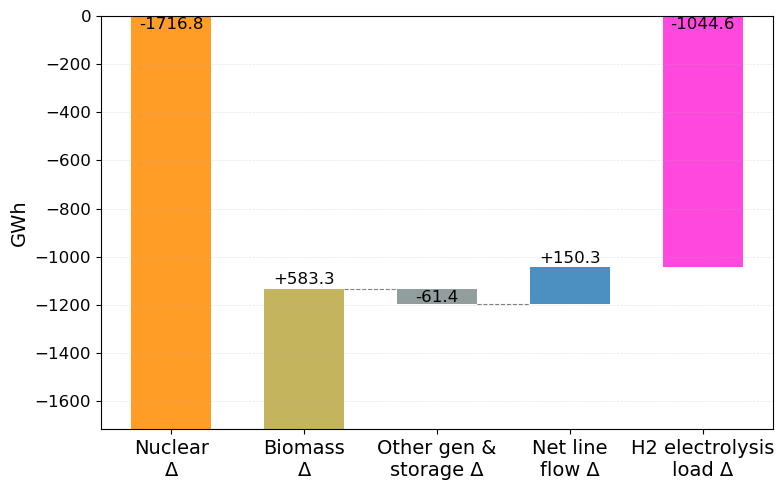

In [66]:
generators_and_storage = [
    'offwind-ac', 'offwind-dc', 'onwind', 'solar', 'solar-hsat',
    'ror', 'hydro', 'battery', 'PHS', 'H2 fuel cell'
]

def _eb_diff_total(carriers):
    mask = (
        d["ts_diff"]["carrier"].isin(carriers) &
        (d["ts_diff"]["network"] == scen) &
        (d["ts_diff"]["bus_carrier"] == "AC") &
        (d["ts_diff"]["snapshot"] <= CUTOFF)
    )
    return d["ts_diff"][mask]["value_diff"].sum() / 1e3

nuclear_diff  = _eb_diff_total(["nuclear"])
biomass_diff  = _eb_diff_total(["biomass"])
gen_stor_diff = _eb_diff_total(generators_and_storage)
line_diff_val = _line_flow_by_bus(scen, "value_diff").sum()
h2_elec_diff  = -_eb_diff_total(["H2 electrolysis"])

# (label, amount, color, standalone)
steps = [
    ("Nuclear\nΔ",    nuclear_diff,  color_map.get("nuclear",         "#e8a090"), False),
    ("Biomass\nΔ",    biomass_diff,  color_map.get("biomass",          "#5d8a5e"), False),
    ("Other gen &\nstorage Δ", gen_stor_diff, "#7f8c8d",                                   False),
    ("Net line\nflow Δ", line_diff_val, "#2c7bb6",                                   False),
    ("H2 electrolysis\nload Δ",  h2_elec_diff,  color_map.get("H2 electrolysis", "#9b59b6"), True),
]

wf = pd.DataFrame(steps, columns=["label", "amount", "color", "standalone"])
wf["running"] = wf["amount"].cumsum()
wf["shifted"] = wf["running"].shift(1).fillna(0)
wf["bottom"]  = wf.apply(lambda r: 0 if r["standalone"] else r["shifted"], axis=1)

fig, ax = plt.subplots(figsize=(8, 5))
x = np.arange(len(wf))

ax.bar(x, wf["amount"], bottom=wf["bottom"], color=wf["color"], width=0.6, alpha=0.85)

# connector lines — skip into standalone bars
for i in range(1, len(wf)):
    if wf["standalone"].iloc[i]:
        continue
    ax.plot([i - 0.7, i - 0.3], [wf["running"].iloc[i - 1]] * 2,
            color="gray", linestyle="--", linewidth=0.8)

# value labels
for i, row in wf.iterrows():
    if row["standalone"]:
        y_pos  = row["amount"] if row["amount"] >= 0 else 0
        offset = -8 if row["amount"] >= 0 else -4
    else:
        y_pos  = row["running"] if row["amount"] >= 0 else row["shifted"]
        offset = 8 if row["amount"] >= 0 else -4
    ax.text(i, y_pos + offset, f"{row['amount']:+.1f}", ha="center",
            va="bottom" if row["amount"] >= 0 else "top", fontsize=12)

ax.axhline(0, color="black", linewidth=0.6)
ax.set_xticks(x)
ax.set_xticklabels(wf["label"], fontsize=14)
ax.set_ylabel("GWh")
ax.grid(True, axis="y", alpha=0.3, linestyle="--", linewidth=0.5)
plt.tight_layout()
plt.show()


## diff in storage throughput for short storage

In [265]:
CUTOFF = pd.Timestamp("2022-11-27 15:00:00")

def _storage_throughput(n, carrier, mask=None):
    idx = n.storage_units[n.storage_units.carrier == carrier].index
    p = n.storage_units_t.p[idx]
    if mask is not None:
        p = p[mask]
    return pd.Series({
        "discharge (GWh)": p.clip(lower=0).sum().sum() / 1e3,
        "charge (GWh)":    abs(p.clip(upper=0).sum().sum()) / 1e3,
    })

rows = []
for carrier in ["battery", "PHS"]:
    for period, mask_fn in [
        ("≤ cutoff", lambda n: n.storage_units_t.p.index <= CUTOFF),
        ("> cutoff", lambda n: n.storage_units_t.p.index >  CUTOFF),
    ]:
        b = _storage_throughput(n_base, carrier, mask_fn(n_base)).add_prefix("base ")
        s = _storage_throughput(n_scen, carrier, mask_fn(n_scen)).add_prefix("scen ")
        diff = pd.Series({
            "diff discharge (GWh)": s["scen discharge (GWh)"] - b["base discharge (GWh)"],
            "diff charge (GWh)":    s["scen charge (GWh)"]    - b["base charge (GWh)"],
        })
        rows.append({"carrier": carrier, "period": period, **b, **s, **diff})

throughput = pd.DataFrame(rows).set_index(["carrier", "period"])

# Sum of differences per period
diff_total = throughput[["diff discharge (GWh)", "diff charge (GWh)"]].groupby("period").sum()
diff_total.index = pd.MultiIndex.from_tuples([("TOTAL", p) for p in diff_total.index])
period_order = ["≤ cutoff", "> cutoff"]
diff_total = diff_total.loc[pd.MultiIndex.from_tuples([("TOTAL", p) for p in period_order])]

display(throughput.round(2))
display(diff_total.round(2))


base discharge (GWh)  base charge (GWh)  \
carrier period                                              
battery ≤ cutoff              21621.31           22529.61   
        > cutoff              19716.58           20576.04   
PHS     ≤ cutoff               1246.77            1673.44   
        > cutoff               1198.92            1668.95   

                  scen discharge (GWh)  scen charge (GWh)  \
carrier period                                              
battery ≤ cutoff              21427.50           22322.24   
        > cutoff              19547.94           20368.25   
PHS     ≤ cutoff               1305.07            1741.09   
        > cutoff               1141.86            1526.21   

                  diff discharge (GWh)  diff charge (GWh)  
carrier period                                             
battery ≤ cutoff               -193.81            -207.37  
        > cutoff               -168.64            -207.79  
PHS     ≤ cutoff                 58.30              67.66  
        > cutoff                -57.07            -142.74

diff discharge (GWh)  diff charge (GWh)
TOTAL ≤ cutoff               -135.51            -139.71
      > cutoff               -225.71            -350.53

In [266]:
for carrier in ["battery", "PHS"]:
    idx = n_scen.storage_units[n_scen.storage_units.carrier == carrier].index
    p = n_scen.storage_units_t.p[idx]
    charge    = abs(p.clip(upper=0).sum().sum()) / 1e3
    discharge = p.clip(lower=0).sum().sum() / 1e3
    soc       = n_scen.storage_units_t.state_of_charge[idx]
    delta_soc = (soc.iloc[-1].sum() - soc.iloc[0].sum()) / 1e3
    loss = charge - discharge - delta_soc
    print(f"{carrier}: charge={charge:.2f}, discharge={discharge:.2f}, ΔSOC={delta_soc:.2f}, loss≈{loss:.2f} GWh")


battery: charge=42690.49, discharge=40975.44, ΔSOC=5.89, loss≈1709.16 GWh
PHS: charge=3267.30, discharge=2446.93, ΔSOC=0.77, loss≈819.60 GWh


In [267]:
for carrier in ["battery", "PHS"]:
    for label, n in [("base", n_base), ("scen", n_scen)]:
        idx = n.storage_units[n.storage_units.carrier == carrier].index
        soc = n.storage_units_t.state_of_charge[idx]
        start   = soc.iloc[0].sum() / 1e3
        at_cut  = soc.loc[:CUTOFF].iloc[-1].sum() / 1e3
        print(f"{carrier} | {label}:  start={start:.2f} GWh  at cutoff={at_cut:.2f} GWh  Δ={at_cut - start:.2f} GWh")
    print()


battery | base:  start=167.85 GWh  at cutoff=174.32 GWh  Δ=6.47 GWh
battery | scen:  start=168.42 GWh  at cutoff=174.32 GWh  Δ=5.90 GWh

PHS | base:  start=82.00 GWh  at cutoff=82.49 GWh  Δ=0.49 GWh
PHS | scen:  start=81.70 GWh  at cutoff=82.49 GWh  Δ=0.78 GWh



In [187]:
for label, n in [("base", n_base), ("scen", n_scen)]:
    idx = n.storage_units[n.storage_units.carrier == "hydro"].index
    soc = n.storage_units_t.state_of_charge[idx]
    start  = soc.iloc[0].sum() / 1e3
    at_cut = soc.loc[:CUTOFF].iloc[-1].sum() / 1e3
    print(f"hydro | {label}:  start={start:.2f} GWh  at cutoff={at_cut:.2f} GWh  Δ={at_cut - start:.2f} GWh")


hydro | base:  start=5993.96 GWh  at cutoff=6052.26 GWh  Δ=58.30 GWh
hydro | scen:  start=6014.25 GWh  at cutoff=6038.72 GWh  Δ=24.47 GWh


In [ ]:
for carrier in ["battery", "PHS"]:
    su = n_base.storage_units[n_base.storage_units.carrier == carrier][["efficiency_store", "efficiency_dispatch"]].drop_duplicates()
    su["roundtrip (%)"] = (su["efficiency_store"] * su["efficiency_dispatch"] * 100).round(1)
    print(f"\n{carrier}:")
    print(su.to_string())



battery:
               efficiency_store  efficiency_dispatch  roundtrip (%)
name                                                               
FR0 0 battery          0.979796             0.979796           96.0

PHS:
           efficiency_store  efficiency_dispatch  roundtrip (%)
name                                                           
FR0 1 PHS          0.866025             0.866025           75.0


## during winter

In [107]:
CUTOFF = pd.Timestamp("2022-11-27 15:00:00")
CUTEND = pd.Timestamp("2023-03-07 23:00:00")
                      
# pel_by_bus = d["pel_dict_nuc"]["nuclear"].loc[:CUTOFF].sum(axis=0).rename("PEL (GWh)") / 1e3

def _eb_diff_by_bus(carrier):
    mask = (
        (d["ts_diff"]["carrier"] == carrier) &
        (d["ts_diff"]["network"] == scen) &
        (d["ts_diff"]["bus_carrier"] == "AC") &
        (d["ts_diff"]["snapshot"] > CUTOFF) &
        (d["ts_diff"]["snapshot"] <= CUTEND)
    )
    return d["ts_diff"][mask].groupby("bus")["value_diff"].sum().rename(carrier)

eb_cols = pd.concat(
    [_eb_diff_by_bus(c) for c in SUP_CARRIERS + CHARGE_CARRIERS],
    axis=1,
) / 1e3

per_bus = pd.concat([eb_cols], axis=1)
# per_bus["nuclear EB diff / PEL (%)"] = (per_bus["nuclear"].abs() / per_bus["PEL (GWh)"]) * 100

total = per_bus.sum(numeric_only=True).to_frame("Total").T
# total["nuclear EB diff / PEL (%)"] = (total["nuclear"].abs() / total["PEL (GWh)"]) * 100


In [110]:
soc_diff_sum

np.float64(-729742.8)

In [108]:
soc_diff_sum*eta_fc

np.float64(-364871.4)

In [113]:
((soc_diff_sum/1000) 9 6.98)*eta_fc

np.float64(-369.8571142857143)

In [78]:
total

,biomass,nuclear,offwind-ac,offwind-dc,onwind,solar,solar-hsat,load_shedding,ror,hydro,H2 electrolysis,H2 fuel cell,battery,PHS
Total,-2.480437,-1.764614,12.246435,9.987708,-86.219442,5.094781,0.053217,337.264202,7.505395,-8.878035,10.846428,-372.153087,11.58414,16.509782


In [80]:
337.264202/1716

0.19654091025641027

In [114]:
10000*0.69*0.5

3449.9999999999995

In [ ]:
generators_+_storage = [
    'biomass',
    'nuclear',
    'offwind-ac',
    'offwind-dc',
    'onwind',
    'solar',
    'solar-hsat',
    'ror',
    'hydro',
    'battery', 
    'PHS', 
    'H2 electrolysis'
    ]

In [ ]:
-368.3614

In [104]:
337.26 -25.51 + 60

371.75

In [105]:
total[total.columns.intersection(
    ['biomass',
 'nuclear',
 'offwind-ac',
 'offwind-dc',
 'onwind',
 'solar',
 'solar-hsat',
#  'load_shedding',
 'ror',
 'hydro'
 ] 
 + ['battery', 'PHS', 'H2 electrolysis']
 )].sum(axis=1)

Total   -25.514642
dtype: float64

In [112]:
def _line_flow_by_bus(network, col="value"):
    mask = (
        (d["ts_diff"]["carrier"] == "AC") &
        (d["ts_diff"]["network"] == network) &
        (d["ts_diff"]["bus_carrier"] == "AC")
        & (d["ts_diff"]["snapshot"] > CUTOFF)
        & (d["ts_diff"]["snapshot"] <= CUTEND)
    )
    return d["ts_diff"][mask].groupby("bus")[col].sum() / 1e3

line_base = _line_flow_by_bus(base, "value").rename("net line flow base (GWh)")
line_scen = _line_flow_by_bus(scen, "value").rename("net line flow scen (GWh)")
line_diff = _line_flow_by_bus(scen, "value_diff").rename("net line flow diff (GWh)")

line_flows = pd.concat([line_base, line_scen, line_diff], axis=1)
line_flows.loc["Total"] = line_flows.sum()

line_flows


,net line flow base (GWh),net line flow scen (GWh),net line flow diff (GWh)
bus,,,
FR0 0,2629.085451,2465.651440,-163.434012
FR0 1,3208.395130,3409.410295,201.015164
FR0 2,7741.881199,7682.381695,-59.499504
FR0 3,-298.039863,-346.538787,-48.498924
FR0 4,-14099.238951,-13968.413458,130.825493
Total,-817.917033,-757.508816,60.408217


In [293]:
n = nc.networks[base]

cap0 = n.lines.groupby("bus0")["s_nom_opt"].sum()
cap1 = n.lines.groupby("bus1")["s_nom_opt"].sum()
line_capacity = cap0.add(cap1, fill_value=0).rename("line capacity (MW)").sort_index()
print(line_capacity)


FR0 0    39492.057451
FR0 1    55020.758966
FR0 2    24130.931851
FR0 3    27482.450164
FR0 4    24912.952791
Name: line capacity (MW), dtype: float64


In [294]:
BUS = "FR0 2"

connected = n.lines[(n.lines["bus0"] == BUS) | (n.lines["bus1"] == BUS)].copy()
connected["other_bus"] = connected.apply(
    lambda r: r["bus1"] if r["bus0"] == BUS else r["bus0"], axis=1
)

capacity_to = (
    connected.groupby("other_bus")["s_nom_opt"]
    .sum()
    .rename("capacity (MW)")
)
print(capacity_to)


other_bus
FR0 1     6870.612541
FR0 3     7094.047095
FR0 4    10166.272215
Name: capacity (MW), dtype: float64


In [ ]:
n_base = nc.networks[base]
FEB_SLICE = slice("2023-02-01 00:00", "2023-02-01 02:00")  # 3 hourly timesteps

# H2 store energy content (MWh H2)
h2_soc = n_base.stores_t.e.filter(like="H2").loc[FEB_SLICE]

# H2 fuel cell discharge to AC bus (positive = delivering to AC)
fc_idx = n_base.links[n_base.links.carrier == "H2 fuel cell"].index
h2_fc  = (-n_base.links_t.p1[fc_idx]).loc[FEB_SLICE]


H2 Store SOC (MWh H2):
name                     FR0 0 H2      FR0 1 H2      FR0 2 H2       FR0 3 H2  \
snapshot                                                                       
2023-02-01 00:00:00  1.664042e+06  4.897602e+06  1.865874e+06  114950.650597   
2023-02-01 01:00:00  1.664040e+06  4.897599e+06  1.861736e+06  114689.211256   
2023-02-01 02:00:00  1.664038e+06  4.897596e+06  1.859966e+06  114427.752833   

name                     FR0 4 H2  
snapshot                           
2023-02-01 00:00:00  4.618642e+06  
2023-02-01 01:00:00  4.613400e+06  
2023-02-01 02:00:00  4.611206e+06  

H2 Fuel Cell output to AC (MWh):
name                 FR0 0 H2 Fuel Cell  FR0 1 H2 Fuel Cell  \
snapshot                                                      
2023-02-01 00:00:00            1.112771            1.529679   
2023-02-01 01:00:00            1.049157            1.382309   
2023-02-01 02:00:00            1.111874            1.405407   

name                 FR0 2 H2 Fuel Cell  FR0 3

In [ ]:
h2_soc

name,FR0 0 H2,FR0 1 H2,FR0 2 H2,FR0 3 H2,FR0 4 H2
snapshot,,,,,
2023-02-01 00:00:00,1.664042e+06,4.897602e+06,1.865874e+06,114950.650597,4.618642e+06
2023-02-01 01:00:00,1.664040e+06,4.897599e+06,1.861736e+06,114689.211256,4.613400e+06
2023-02-01 02:00:00,1.664038e+06,4.897596e+06,1.859966e+06,114427.752833,4.611206e+06


In [ ]:
h2_soc_diff = h2_soc.diff()
h2_soc_diff

name,FR0 0 H2,FR0 1 H2,FR0 2 H2,FR0 3 H2,FR0 4 H2
snapshot,,,,,
2023-02-01 00:00:00,NaN,NaN,NaN,NaN,NaN
2023-02-01 01:00:00,-2.095932,-2.761574,-4138.388180,-261.439341,-5242.571589
2023-02-01 02:00:00,-2.221328,-2.807672,-1769.563371,-261.458422,-2193.236609


In [112]:
d["h2_e_nom_by_bus"]

bus
FR0 0 H2    5.965864e+06
FR0 1 H2    1.683544e+07
FR0 2 H2    7.952221e+06
FR0 3 H2    2.904579e+05
FR0 4 H2    1.085399e+07
Name: e_nom_opt, dtype: float64

change this plot to be
stacked generation
 drop candle for charge withdrawal (ac)?
 dropcande up for discharge supply (ac) 

In [102]:
d["h2_e_nom_by_bus"]

bus
FR0 0 H2    5.965864e+06
FR0 1 H2    1.683544e+07
FR0 2 H2    7.952221e+06
FR0 3 H2    2.904579e+05
FR0 4 H2    1.085399e+07
Name: e_nom_opt, dtype: float64

In [215]:
n_scen = nc.networks[scen]
print("H2 Stores:", n_scen.stores.index[n_scen.stores.carrier == "H2"].tolist())
print("H2 StorageUnits:", n_scen.storage_units.index[n_scen.storage_units.carrier == "H2"].tolist())


H2 Stores: ['FR0 0 H2', 'FR0 1 H2', 'FR0 2 H2', 'FR0 3 H2', 'FR0 4 H2']
H2 StorageUnits: []


# Damaged Capacity

In [181]:
base = "base"
scen = "cap"

d = prepare_combo_data(base, scen, nc=nc, scenarios=scenarios)

soc_utilisation = pd.DataFrame({
    "e_nom_opt (MWh)":    d["h2_e_nom_by_bus"],
    "max SOC base (MWh)": d["soc_base"].max(),
    "max SOC base at":    d["soc_base"].idxmax(),
    "max SOC scen (MWh)": d["soc_scen"].max(),
    "max SOC scen at":    d["soc_scen"].idxmax(),
    "min SOC base (MWh)": d["soc_base"].min(),
    "min SOC base at":    d["soc_base"].idxmin(),
    "min SOC scen (MWh)": d["soc_scen"].min(),
    "min SOC scen at":    d["soc_scen"].idxmin(),
})
soc_utilisation["utilisation base (%)"] = (
    soc_utilisation["max SOC base (MWh)"] / soc_utilisation["e_nom_opt (MWh)"] * 100
).round(1)
soc_utilisation["utilisation scen (%)"] = (
    soc_utilisation["max SOC scen (MWh)"] / soc_utilisation["e_nom_opt (MWh)"] * 100
).round(1)
soc_utilisation["max SOC diff (MWh)"] = (
    soc_utilisation["max SOC scen (MWh)"] - soc_utilisation["max SOC base (MWh)"]
).round(1)

soc_utilisation
# soc_utilisation.to_csv(root.parent.parent.parent / "results" / f"h2_soc_utilisation_FR-{YEAR}.csv")


,e_nom_opt (MWh),max SOC base (MWh),max SOC base at,max SOC scen (MWh),max SOC scen at,min SOC base (MWh),min SOC base at,min SOC scen (MWh),min SOC scen at,utilisation base (%),utilisation scen (%),max SOC diff (MWh)
bus,,,,,,,,,,,,
FR0 0 H2,5.770415e+06,5.879036e+06,2022-11-27 15:00:00,5.770415e+06,2022-11-27 15:00:00,0.017062,2023-03-07 23:00:00,0.038382,2023-03-07 23:00:00,101.9,100.0,-108621.4
FR0 1 H2,1.682891e+07,1.677335e+07,2022-11-27 15:00:00,1.682891e+07,2022-11-27 15:00:00,0.016036,2023-03-07 23:00:00,0.030208,2023-03-07 23:00:00,99.7,100.0,55565.6
FR0 2 H2,7.905641e+06,7.927152e+06,2022-11-27 15:00:00,7.905641e+06,2022-11-27 15:00:00,0.014370,2023-03-07 23:00:00,0.027940,2023-03-07 23:00:00,100.3,100.0,-21511.2
FR0 3 H2,3.832139e+05,4.481308e+05,2022-11-27 15:00:00,3.832138e+05,2022-11-27 15:00:00,0.015858,2023-03-07 23:00:00,0.033997,2023-03-07 23:00:00,116.9,100.0,-64916.9
FR0 4 H2,1.091052e+07,1.087533e+07,2022-11-27 15:00:00,1.091052e+07,2022-11-27 15:00:00,0.018624,2023-03-07 23:00:00,0.030902,2023-03-07 23:00:00,99.7,100.0,35182.6


## Total year

In [182]:
pel_by_bus = d["pel_dict_nuc"]["nuclear"].sum(axis=0).rename("PEL (GWh)")

nuc_mask = (
    (d["ts_diff"]["carrier"] == "nuclear") &
    (d["ts_diff"]["bus_carrier"] == "AC")
)

eb_diff_by_bus = (
    d["ts_diff"][nuc_mask & (d["ts_diff"]["network"] == scen)]
    .groupby("bus")["value_diff"]
    .sum()
    .rename("EB diff (GWh)")
)

base_eb_by_bus = (
    d["ts_diff"][nuc_mask & (d["ts_diff"]["network"] == base)]
    .groupby("bus")["value"]
    .sum()
    .rename("base EB (GWh)")
)

per_bus = pd.concat([pel_by_bus, eb_diff_by_bus, base_eb_by_bus], axis=1) / 1e3
per_bus["EB diff / PEL (%)"]     = (per_bus["EB diff (GWh)"].abs() / per_bus["PEL (GWh)"]) * 100
per_bus["EB diff / base EB (%)"] = (per_bus["EB diff (GWh)"].abs() / per_bus["base EB (GWh)"].abs()) * 100

total = per_bus.sum(numeric_only=True).to_frame("Total").T
total["EB diff / PEL (%)"]     = (total["EB diff (GWh)"].abs() / total["PEL (GWh)"]) * 100
total["EB diff / base EB (%)"] = (total["EB diff (GWh)"].abs() / total["base EB (GWh)"].abs()) * 100

total


,PEL (GWh),EB diff (GWh),base EB (GWh),EB diff / PEL (%),EB diff / base EB (%)
Total,3951.839584,-952.839914,291274.178718,24.1113,0.327128


In [183]:
per_bus

,PEL (GWh),EB diff (GWh),base EB (GWh),EB diff / PEL (%),EB diff / base EB (%)
bus,,,,,
FR0 0,199.485991,26.624970,46824.278412,13.346787,0.056861
FR0 1,388.374237,323.249262,112344.209854,83.231386,0.287731
FR0 2,1321.860555,-1113.450396,45814.304782,84.233575,2.430355
FR0 3,1967.791138,-370.818822,58796.636478,18.844420,0.630680
FR0 4,74.327662,181.555072,27494.749193,244.263126,0.660326


# Prices

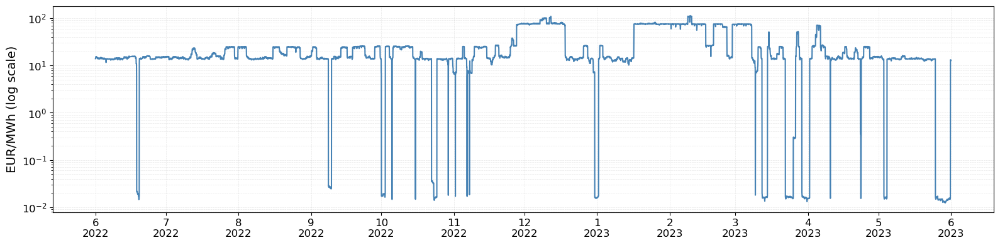

In [339]:
n_base = nc.networks["base_dis"]
price_base = _fleet_price(n_base)

fig, ax = plt.subplots(figsize=(16, 4))
ax.semilogy(price_base.index, price_base.values, linewidth=1.5, color="steelblue")  # increase linewidth here
ax.set_ylabel("EUR/MWh (log scale)")
ax.grid(True, which="both", alpha=0.3, linestyle="--", linewidth=0.5)
ax.xaxis.set_major_locator(mdates.MonthLocator())
ax.xaxis.set_major_formatter(mdates.DateFormatter("%-m\n%Y"))
ax.tick_params(axis="x", rotation=0)
fig.tight_layout()
plt.show()


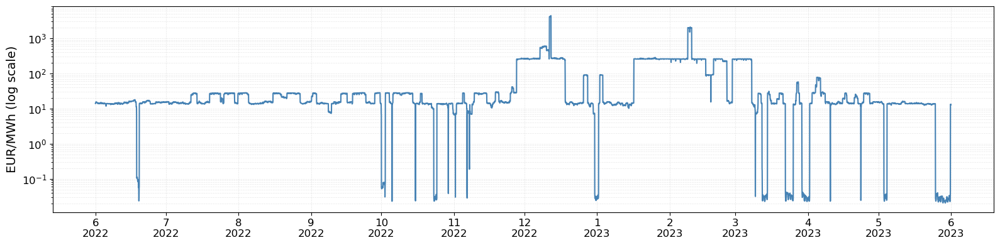

In [118]:
n_base = nc.networks["cap"]
price_base = _fleet_price(n_base)

fig, ax = plt.subplots(figsize=(16, 4))
ax.semilogy(price_base.index, price_base.values, linewidth=1.5, color="steelblue")  # increase linewidth here
ax.set_ylabel("EUR/MWh (log scale)")
ax.grid(True, which="both", alpha=0.3, linestyle="--", linewidth=0.5)
ax.xaxis.set_major_locator(mdates.MonthLocator())
ax.xaxis.set_major_formatter(mdates.DateFormatter("%-m\n%Y"))
ax.tick_params(axis="x", rotation=0)
fig.tight_layout()
plt.show()


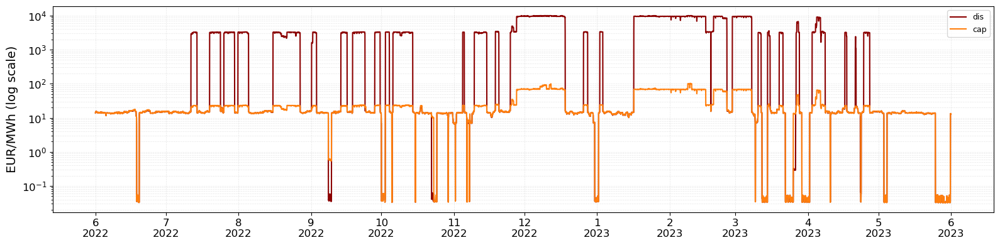

In [177]:
plot_networks = {
    "dis": nc.networks["dis"],
    "cap": nc.networks["cap_op"],
}
colors = {
    "dis": "darkred",
    "cap": "#ff7f0e",
}

fig, ax = plt.subplots(figsize=(16, 4))
for label, n in plot_networks.items():
    price = _fleet_price(n)
    ax.semilogy(price.index, price.values, linewidth=1.5, label=label, color=colors[label])
ax.set_ylabel("EUR/MWh (log scale)")
ax.legend(fontsize=9)
ax.grid(True, which="both", alpha=0.3, linestyle="--", linewidth=0.5)
ax.xaxis.set_major_locator(mdates.MonthLocator())
ax.xaxis.set_major_formatter(mdates.DateFormatter("%-m\n%Y"))
ax.tick_params(axis="x", rotation=0)
fig.tight_layout()
plt.show()


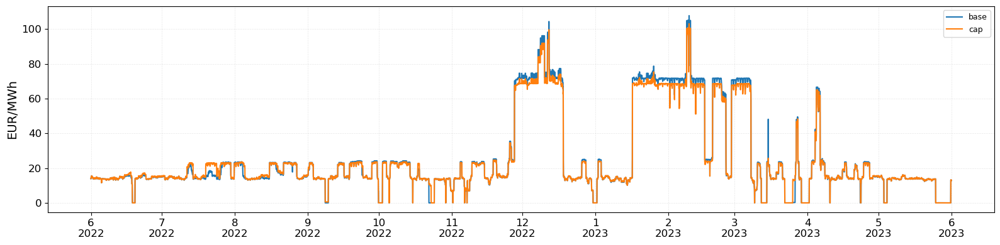

In [175]:
plot_networks = {
    # "base": nc.networks["base_dis"],
    "base": nc.networks["base_dis"],
    "cap": nc.networks["cap_op"],
}

fig, ax = plt.subplots(figsize=(16, 4))
for label, n in plot_networks.items():
    price = _fleet_price(n)
    ax.plot(price.index, price.values, linewidth=1.5, label=label)
ax.set_ylabel("EUR/MWh")
ax.legend(fontsize=9)
ax.grid(True, which="both", alpha=0.3, linestyle="--", linewidth=0.5)
ax.xaxis.set_major_locator(mdates.MonthLocator())
ax.xaxis.set_major_formatter(mdates.DateFormatter("%-m\n%Y"))
ax.tick_params(axis="x", rotation=0)
fig.tight_layout()
plt.show()


In [172]:
def _load_weighted_avg_price(n):
    ac_buses  = n.buses.index[n.buses.carrier == "AC"]
    prices    = n.buses_t.marginal_price[ac_buses]

    # aggregate all loads by bus
    load_idx  = n.loads[n.loads.bus.isin(ac_buses)].index
    load_p    = n.loads_t.p_set[load_idx]
    load_by_bus = load_p.T.groupby(n.loads.loc[load_idx, "bus"]).sum().T
    load_by_bus = load_by_bus.reindex(columns=ac_buses, fill_value=0)

    total_cost = (prices * load_by_bus).values.sum()
    total_load = load_by_bus.values.sum()
    return total_cost / total_load   # EUR/MWh

print(f"dis:    {_load_weighted_avg_price(nc.networks['dis']):.2f} EUR/MWh")
print(f"cap_op: {_load_weighted_avg_price(nc.networks['cap_op']):.2f} EUR/MWh")
print(f"base: {_load_weighted_avg_price(nc.networks['base_dis']):.2f} EUR/MWh")



dis:    2976.82 EUR/MWh
cap_op: 28.65 EUR/MWh
base: 29.25 EUR/MWh


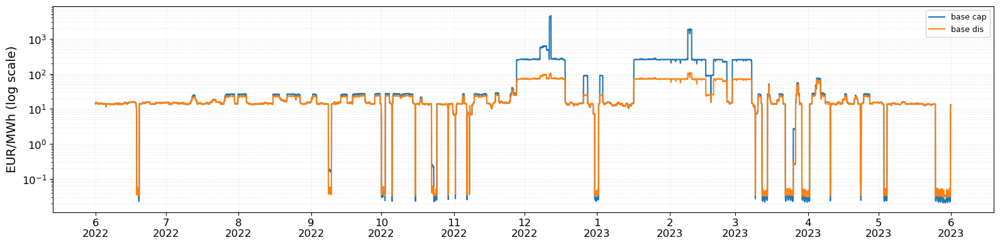

In [125]:
plot_networks = {
    "base cap": nc.networks["base_cap"],
    # "cap": nc.networks["cap"],
    "base dis": nc.networks["base_dis"],
    # "dis": nc.networks["dis"],
}

fig, ax = plt.subplots(figsize=(16, 4))
for label, n in plot_networks.items():
    price = _fleet_price(n)
    ax.semilogy(price.index, price.values, linewidth=1.5, label=label)
ax.set_ylabel("EUR/MWh (log scale)")
ax.legend(fontsize=9)
ax.grid(True, which="both", alpha=0.3, linestyle="--", linewidth=0.5)
ax.xaxis.set_major_locator(mdates.MonthLocator())
ax.xaxis.set_major_formatter(mdates.DateFormatter("%-m\n%Y"))
ax.tick_params(axis="x", rotation=0)
fig.tight_layout()
plt.show()


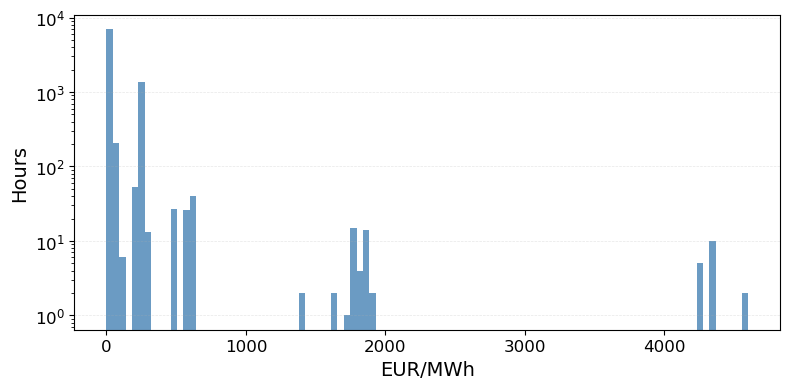

In [219]:
fig, ax = plt.subplots(figsize=(8, 4))
ax.hist(price_base.values, bins=100, color="steelblue", alpha=0.8, edgecolor="none")
ax.set_xlabel("EUR/MWh")
ax.set_ylabel("Hours")
ax.set_yscale("log")
ax.grid(True, axis="y", alpha=0.3, linestyle="--", linewidth=0.5)
fig.tight_layout()
plt.show()


In [ ]:

n = networks["base_cap"]
ac_price  = n.buses_t.marginal_price["FR0 0"]
h2_price  = n.buses_t.marginal_price["FR0 0 H2"]

print("Electrolysis floor:", (ac_price / eta_elec).describe())
print("Fuel cell ceiling:", (ac_price * eta_fc).describe())
print("H2 price:", h2_price.describe())


Electrolysis floor: count    8760.000000
mean      112.850013
std       349.891126
min         0.017721
25%        20.036017
50%        21.732907
75%        39.361244
max      6752.449708
Name: FR0 0, dtype: float64
Fuel cell ceiling: count    8760.000000
mean       39.463650
std       122.356927
min         0.006197
25%         7.006595
50%         7.599998
75%        13.764627
max      2361.331663
Name: FR0 0, dtype: float64
H2 price: count    8760.000000
mean       63.950269
std        39.927246
min        39.367026
25%        39.367743
50%        39.368890
75%       128.803545
max       128.804662
Name: FR0 0 H2, dtype: float64


In [390]:
mp = networks["base_dis"].buses_t.marginal_price
top_idx = mp["FR0 0"].nlargest(10).index
mp.loc[top_idx]



name,FR0 0,FR0 1,FR0 2,FR0 3,FR0 4,FR0 0 H2,FR0 1 H2,FR0 2 H2,FR0 3 H2,FR0 4 H2
snapshot,,,,,,,,,,
2023-02-09 17:00:00,107.248745,106.749815,103.079972,98.059184,105.467854,34.609995,34.612352,34.752704,34.316758,34.392856
2023-02-09 18:00:00,107.248541,106.749580,103.079968,98.059190,105.467681,34.609995,34.612352,34.752704,34.316758,34.392856
2023-02-09 07:00:00,104.263266,102.861184,100.823633,98.059137,102.149412,34.609995,34.612351,34.752705,34.316759,34.392856
2023-02-09 08:00:00,104.253506,102.854680,100.823200,98.059118,102.145038,34.609995,34.612351,34.752704,34.316759,34.392856
2023-02-09 06:00:00,104.253212,102.854419,100.823607,98.059139,102.145005,34.609996,34.612351,34.752705,34.316760,34.392856
2022-12-12 06:00:00,103.058945,103.105895,102.067813,92.823438,102.743275,34.610019,34.612313,34.752716,34.316722,34.392858
2022-12-12 07:00:00,103.058918,103.105864,102.067789,92.823437,102.743237,34.610019,34.612313,34.752716,34.316722,34.392858
2023-02-10 07:00:00,102.761322,102.145123,102.145073,98.059188,102.145118,34.609994,34.612353,34.752704,34.316756,34.392855
2023-02-09 05:00:00,102.254002,102.850738,100.823544,98.059139,102.142780,34.609996,34.612351,34.752705,34.316760,34.392856


In [403]:
mp = networks["dis"].buses_t.marginal_price
top_idx = mp["FR0 0"].nsmallest(10).index
mp.loc[top_idx]



name,FR0 0,FR0 1,FR0 2,FR0 3,FR0 4,FR0 0 H2,FR0 1 H2,FR0 2 H2,FR0 3 H2,FR0 4 H2
snapshot,,,,,,,,,,
2023-05-29 11:00:00,0.012850,0.013001,0.012490,0.011214,0.013246,4794.225863,4795.232014,4800.000256,4564.763814,4778.366482
2023-05-29 12:00:00,0.012871,0.012998,0.012203,0.011395,0.013102,4794.225863,4795.232014,4800.000256,4564.763814,4778.366482
2023-05-29 13:00:00,0.012929,0.012998,0.012393,0.011526,0.013072,4794.225863,4795.232014,4800.000256,4564.763813,4778.366482
2023-05-29 01:00:00,0.012969,0.013008,0.013282,0.012600,0.013095,4794.225863,4795.232014,4800.000256,4564.763815,4778.366482
2023-05-29 02:00:00,0.012970,0.013009,0.013281,0.012600,0.013097,4794.225863,4795.232014,4800.000256,4564.763815,4778.366482
2023-05-29 03:00:00,0.012974,0.013012,0.013284,0.012599,0.013099,4794.225863,4795.232014,4800.000256,4564.763815,4778.366482
2023-05-29 04:00:00,0.012975,0.013012,0.013285,0.012599,0.013095,4794.225863,4795.232014,4800.000256,4564.763815,4778.366482
2023-05-29 00:00:00,0.012975,0.013011,0.013291,0.012600,0.013097,4794.225863,4795.232014,4800.000256,4564.763816,4778.366482
2023-05-29 14:00:00,0.012978,0.013003,0.012748,0.011670,0.013026,4794.225863,4795.232014,4800.000256,4564.763813,4778.366482


In [380]:
networks["base_dis"].buses_t.marginal_price


name,FR0 0,FR0 1,FR0 2,FR0 3,FR0 4,FR0 0 H2,FR0 1 H2,FR0 2 H2,FR0 3 H2,FR0 4 H2
snapshot,,,,,,,,,,
2022-06-01 00:00:00,14.013296,14.013288,14.246335,13.448870,14.094714,34.27799,34.293199,34.747093,32.910565,33.578143
2022-06-01 01:00:00,14.013289,14.013475,14.246471,13.448875,14.094928,34.27799,34.293199,34.747093,32.910565,33.578143
2022-06-01 02:00:00,14.805052,14.769056,15.072267,13.448879,15.649782,34.27799,34.293199,34.747093,32.910565,33.578143
2022-06-01 03:00:00,15.038864,15.081942,15.772665,13.448882,16.118183,34.27799,34.293199,34.747093,32.910565,33.578143
2022-06-01 04:00:00,14.721417,15.767173,15.820899,13.448885,16.653917,34.27799,34.293199,34.747093,32.910565,33.578143
...,...,...,...,...,...,...,...,...,...,...
2023-05-31 19:00:00,13.345509,13.334839,13.443944,13.375411,12.268907,34.27799,34.293199,34.747093,32.910566,33.578143
2023-05-31 20:00:00,13.345872,13.335178,13.444306,13.375799,12.269197,34.27799,34.293199,34.747093,32.910566,33.578143
2023-05-31 21:00:00,13.345023,13.334302,13.443523,13.374999,12.268337,34.27799,34.293199,34.747093,32.910566,33.578143


In [384]:
eta_elec

np.float64(0.6994)

In [385]:
eta_fc

np.float64(0.5)

<Axes: xlabel='snapshot'>

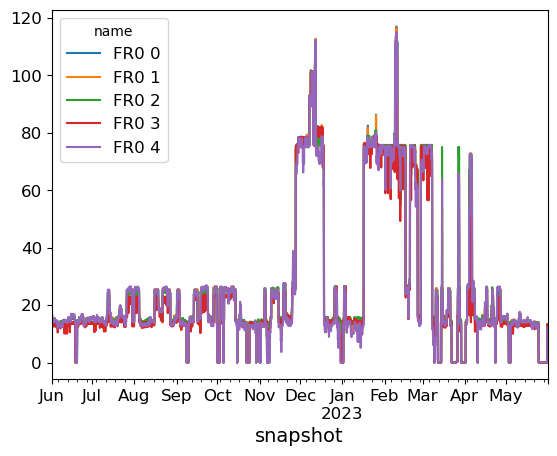

In [340]:
n = networks["base_dis"]
ac_buses = n.buses.index[n.buses.carrier == "AC"].tolist()
n.buses_t.marginal_price[ac_buses].plot()


<Axes: xlabel='snapshot'>

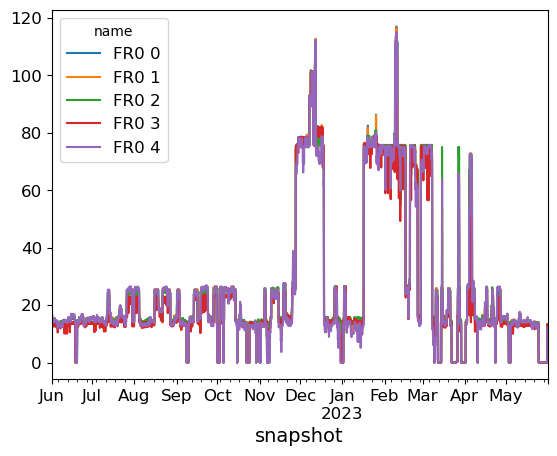

In [336]:
n = networks["base_dis"]
ac_buses = n.buses.index[n.buses.carrier == "AC"].tolist()
n.buses_t.marginal_price[ac_buses].plot()


<Axes: xlabel='snapshot'>

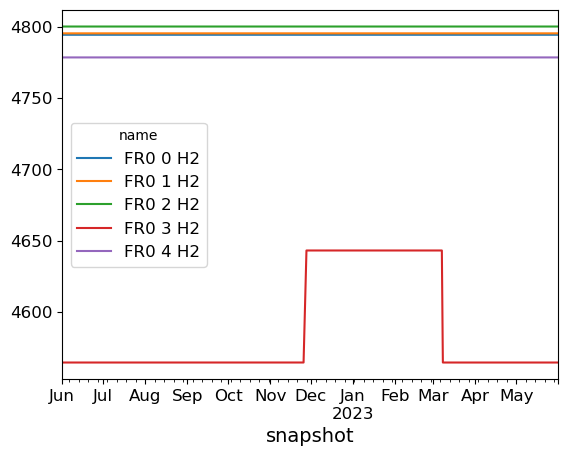

In [402]:
n = networks["dis"]
ac_buses = n.buses.index[n.buses.carrier == "H2"].tolist()
n.buses_t.marginal_price[ac_buses].plot()


<Axes: xlabel='snapshot'>

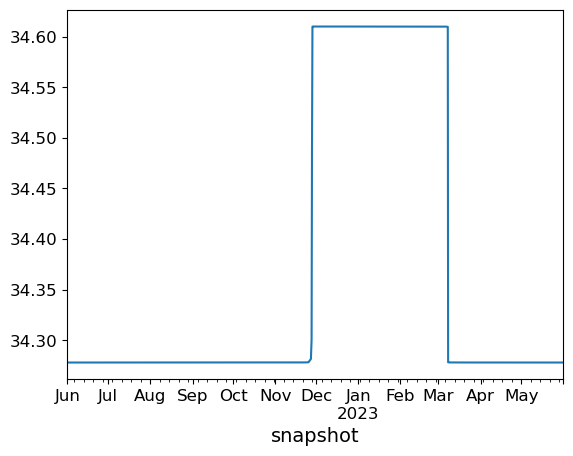

In [395]:
networks["base_dis"].buses_t.marginal_price["FR0 0 H2"].plot()

<Axes: xlabel='snapshot'>

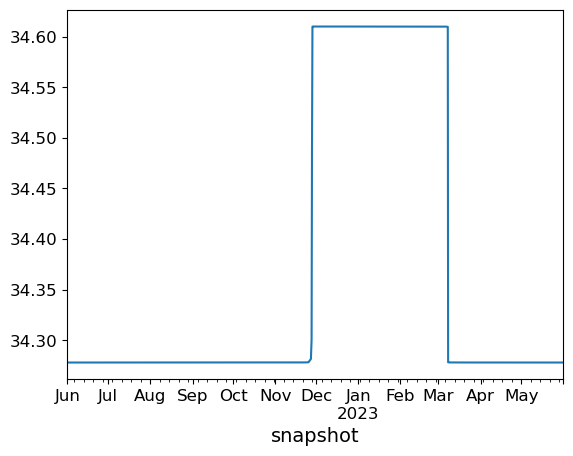

In [ ]:
networks["base_dis"].buses_t.marginal_price["FR0 0 H2"].plot()

<Axes: xlabel='snapshot'>

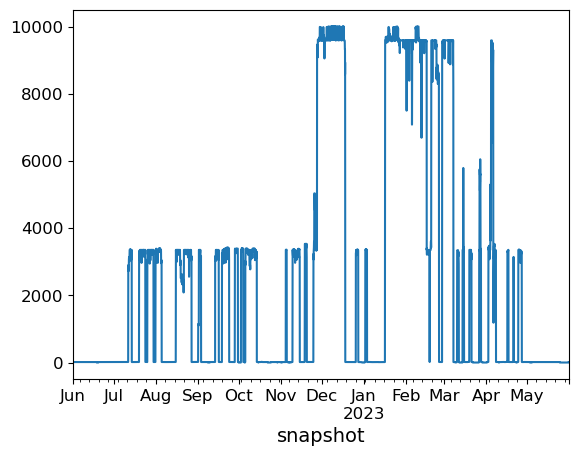

In [397]:
networks["dis"].buses_t.marginal_price["FR0 0"].plot()

<Axes: xlabel='snapshot'>

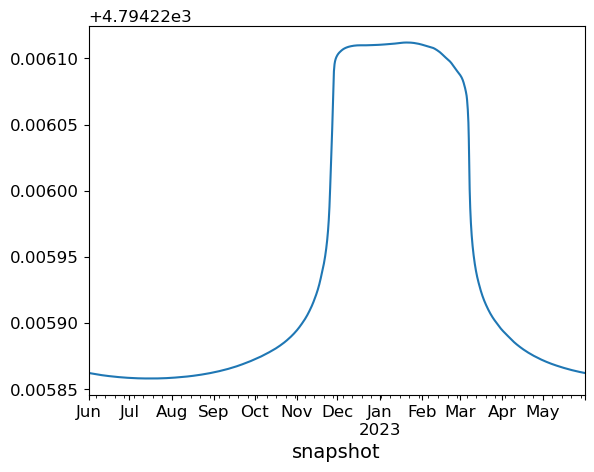

In [396]:
networks["dis"].buses_t.marginal_price["FR0 0 H2"].plot()

In [212]:
eta_elec

np.float64(0.6994)

In [235]:
SUP_CARRIERS

['biomass',
 'nuclear',
 'offwind-ac',
 'offwind-dc',
 'onwind',
 'solar',
 'solar-hsat',
 'load_shedding',
 'ror']

In [233]:
n.storage_units[["carrier", "efficiency_store", "efficiency_dispatch"]].drop_duplicates()


,carrier,efficiency_store,efficiency_dispatch
name,,,
FR0 1 PHS,PHS,0.866025,0.866025
FR0 0 hydro,hydro,0.000000,0.900000
FR0 0 battery,battery,0.979796,0.979796


In [234]:
n.stores[["carrier", "standing_loss"]].drop_duplicates()


,carrier,standing_loss
name,,
FR0 0 H2,H2,0.0


In [388]:
(14.013296/0.69) + (14.013296)

34.32242063768116

In [301]:
print(networks["cap"].buses_t.marginal_price.shape)


(8760, 0)


<Axes: xlabel='snapshot'>

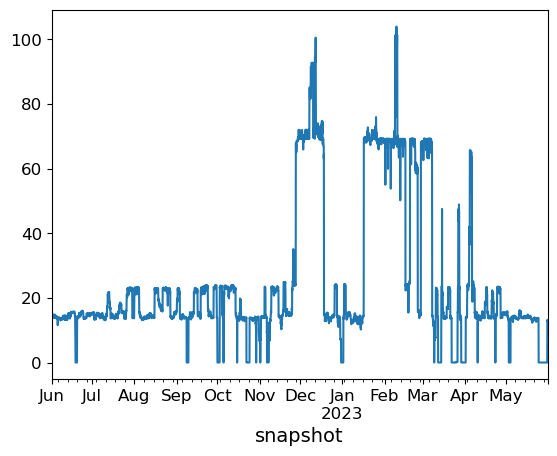

In [379]:
price_base.plot()

<Axes: xlabel='snapshot'>

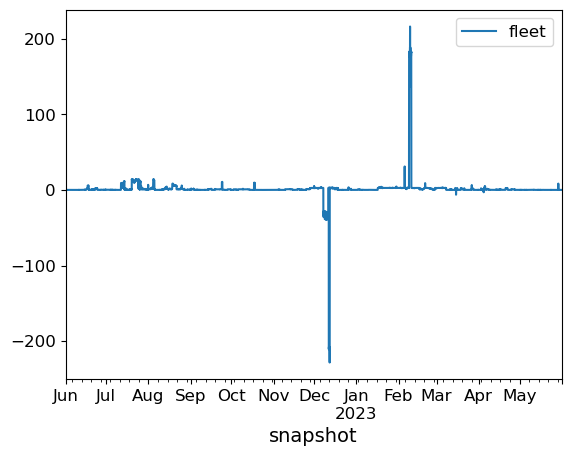

In [135]:
price_diff.plot()